# CV Week: Итоговое задание

На лекции и семинаре мы разбирали как дистиллировать многошаговую диффузионную модель в малошагового студента, который тем самым будет работать на порядок быстрее учителя.

Один из подходов, который мы разбирали - *Consistency Distillation*. В этом задании мы закрепим материал, который был на лекции и семинаре, и реализуем этот фреймворк, затрагивая различные нюансы.

В этом задании мы будем дистиллировать модель *Stable Diffusion 1.5 (SD1.5)* для генерации картинок по текстовому описанию.

Вам предстоит выполнить 8 небольших заданий, которые приведут вас к неплохой модели для генерации картинок за 4 шага, работая в ограниченных условиях колаба.

In [1]:
# torch 2.4.1+cu124
%pip install diffusers==0.30.3, peft==0.8.2 huggingface_hub==0.23.4

Defaulting to user installation because normal site-packages is not writeable

[notice] A new release of pip is available: 23.0.1 -> 24.3.1
[notice] To update, run: python3 -m pip install --upgrade pip


## Теормин

---
### Диффузионные модели

Задан прямой диффузионный процесс, который переводит чистые картинки в шум с помощью распределения $q(\mathbf{x}_t | \mathbf{x}_0)= {N}(\mathbf{x}_t | \alpha_t \mathbf{x}_0, \sigma^2_t I)$

Таким образом, мы можем получаться зашумленные картинки по следующей формуле: $\mathbf{x}_t = \alpha_t \mathbf{x}_0 + \sigma_t \epsilon$, где $\epsilon{\sim} {N}(0, I)$ **(1)**

$\alpha_t, \sigma_t$ задают процесс зашумления. Здесь мы будем иметь дело с *variance preserving (VP)* процессом: $\alpha^2_t = 1 - \sigma^2_t$.

Диффузионная модель (ДМ) пытается решить обратную задачу: из шума порождать новые картинки.
Важно, что диффузионный процесс можно описать следующим обыкновенным дифференциальным уравнением (ОДУ):

 $dx = \left[ f(\mathbf{x}, t) - \frac{1}{2} \nabla_{\mathbf{x}_t} \log p_t(\mathbf{x}) \right] dt$, **(2)**

где $f(\mathbf{x}, t)$ известен из заданного процесса зашумления, а $\nabla_{\mathbf{x}_t} \log p_t(\mathbf{x}_t)$ (*скор функцию*) оцениваем с помощью нейросети: $s_\theta(\mathbf{x}_t, t) \approx \nabla_{\mathbf{x}_t} \log p_t(\mathbf{x}_t)$. Таким образом, имея оценку на $\nabla_{\mathbf{x}_t} \log p_t(\mathbf{x})$, мы можем решить это ОДУ, стартуя со случайного шума, и получить картинку.


**SD1.5** использует *$\epsilon$-параметризацию*, т.е., UNet пытается предсказать шум, который мы добавили на картинку по формуле **(1)**. Оценку скор функции можно получить, пользуясь результатом, вытекающим из формулы Твидди: $s_\theta(\mathbf{x}_t, t) = - \frac{\epsilon_\theta(\mathbf{x}_t, t)} { \sigma_t}$

Чтобы решить ОДУ **(2)**, нам нужно воспользоваться каким-то численным методом (солвером). В этом задании мы будем работать с не самым эффектным, но самым популярным солвером: **DDIM**, который является адаптированным методом Эйлера под диффузионный ОДУ.

Для VP процесса переход с помощью DDIM с шага $t$ на $s$ можно сделать следующим образом:

$
x_s = DDIM(\mathbf{x}_t, t, s) = \alpha_s \cdot \left(\frac{\mathbf{x}_t - \sigma_t \epsilon_\theta}{\alpha_t} \right) + \sigma_s \epsilon_\theta
$

Этот переход можно интерпретировать так: получаем оценку на чистую картинку $\mathbf{x}_0$ на шаге $t$, используя $\frac{\mathbf{x}_t - \sigma_t \epsilon_\theta}{\alpha_t}$, а потом снова зашумляем эту оценку на шаг $s$ по формуле **(1)**, но только используем не случайный шум, а шум предсказанный моделью $\epsilon_\theta$.

*Используя DDIM для SD1.5, можем получать хорошие картинки за 50 шагов.*

**SD1.5** - латентная ДМ, т.е. модель работает не в пиксельном пространстве, а в латентном пространстве **VAE**. Таким образом SD1.5 состоит из следующих компонент:

1) **VAE** - переводит $3{\times}512{\times}512$ картинки в латенты $4{\times}64{\times}64$ и может декодировать их обратно в картинки.
2) **Текстовый энкодер** - извлекает текстовые признаки из промпта. Эти признаки будут подаваться в диффузионную модель, чтобы дать модели информацию, что именно хотим сгенерировать
3) **Диффузионная модель** - UNet, работающий на "латентных картинках" $4{\times}64{\times}64$.

---
### [Консистенси модели](https://arxiv.org/pdf/2303.01469)

Главная цель дистилляции диффузии - уменьшить количество шагов ДМ, при этом сохранив высокое качество картинок.

**Консистенси модели (Consistency Models | CM)** - класс моделей, где мы хотим выучить "консистенси функцию" $f_\theta(\mathbf{x}_t)$ - с любой точки $\mathbf{x}_{t}$ траектории диффузионного ОДУ **(2)** сразу предсказывать $\mathbf{x}_{0}$ (чистые данные) за один шаг.
Если мы идеально выучим консистенси функцию, то сможем шагать из чистого шума сразу в картинку, что супер эффективно в отличии от генерации ДМ.

Отметим, что консистенси модель можно учить как независимую генеративную модель, без предобученной ДМ, и в *задании 3* вам предстоит подумать, как это можно сделать.

<br>

<div>

<img src="https://storage.yandexcloud.net/yandex-research/cvweek-cd-task-images/cd-idea.jpg" width="600"/>
</div>


**Консистенси дистилляция (Consistency Distillation | CD)** - подход, когда для обучения CM, мы используем предобученную ДМ. ДМ нам дает качественную инициализацию модели и уже обученную скор функцию, что сильно упрощает сходимость консистенси моделей.


#### Обучение CM

<div>
<img src="https://storage.yandexcloud.net/yandex-research/cvweek-cd-task-images/cd-training.jpg" width="600"/>
</div>


Главный принцип обучения консистенси моделей заключается в попытке удовлетворить *self-consistency* св-ву: выход CM на двух соседних точках траектории $\mathbf{x}_{t}$ и $\mathbf{x}_{t-1}$ должен совпадать по какой-то мере близости, например L2 расстояние: $\lVert f_\theta(\mathbf{x}_{t-1}) - f_\theta(\mathbf{x}_{t}) \rVert^2_2$.

Заметим, что self-consistency св-во удовлетворить очень просто без какого-либо обучения, взяв, например $f_\theta(\mathbf{x}_{t}) \equiv 0$.

Поэтому, чтобы избежать вырожденных решений, нам необходимо выставить граничное условие (boundary condition), которое будет требовать, чтобы в самой левой точке траектории около $t=0$, модель предсказывала картинку, которую получает на вход: $f_\theta(\mathbf{x}_0) = \mathbf{x}_0$.

**Практическое замечание:** Для обеих точек траектории мы применяем одну и ту же модель $f_\theta(\cdot)$. Но выход модели на шаге ${t-1}$ является "таргетом" для выхода модели на шаге $t$ и поэтому выполнение модели для шага $t-1$ делается в *torch.no_grad* режиме.

**Как получать две соседние точки на траектории ОДУ?**

Берем случайную картинку $\mathbf{x}_0$ из датасета.

Точку $\mathbf{x}_t$ получаем с помощью прямого процесса зашумления: $\mathbf{x}_t = q(\mathbf{x}_t | \mathbf{x}_0)$

Чтобы получить соседнюю точку $\mathbf{x}_{t-1}$, нам нужно сделать шаг по траектории ОДУ, используя, например, DDIM солвер.

В консистенси дистилляции, мы делаем шаг предобученной ДМ: $\mathbf{x}_{t-1} = DDIM(\epsilon_\theta(\mathbf{x}_t, t), \mathbf{x}_t, t, t-1)$

**Важно:** на практике мы можем брать не соседние шаги $t$ и $t-1$, а с некоторым интервалом, например 20 шагов.
Размер интервала влияет на bias/variance trade-off в консистенси обучении: больше интервал между шагами - больше смещение, но меньше дисперсия, и наоборот.
Для простоты в этом задании мы зафиксируем интервал - 20 шагов, но во многих работах размер интервала динамически меняется по ходу обучения.

In [2]:
from tqdm.auto import tqdm

import csv
import os
import functools
import torch
from PIL import Image
from diffusers import StableDiffusionPipeline, LCMScheduler, UNet2DConditionModel, DDIMScheduler

from peft import LoraConfig, get_peft_model, get_peft_model_state_dict

%matplotlib inline
import matplotlib.pyplot as plt


/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/hub.py:128: FutureWarning: Using `TRANSFORMERS_CACHE` is deprecated and will be removed in v5 of Transformers. Use `HF_HOME` instead.
  warnings.warn(
2024-12-06 22:10:59.538321: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


In [3]:
#---------------------
# Visualization utils
#---------------------

def visualize_images(images):
    assert len(images) == 4
    plt.figure(figsize=(12, 3))
    for i, image in enumerate(images):
        plt.subplot(1, 4, i+1)
        plt.imshow(image)
        plt.axis('off')

    plt.subplots_adjust(wspace=-0.01, hspace=-0.01)


#--------------
# Tensor utils
#--------------

def extract_into_tensor(a, t, x_shape):
    b, *_ = t.shape
    out = a.gather(-1, t)
    return out.reshape(b, *((1,) * (len(x_shape) - 1)))

#---------------
# Dataset utils
#---------------

class COCODataset(torch.utils.data.Dataset):
    def __init__(self, root_dir, subset_name="train2014_5k", transform=None, max_cnt=None):
        """
        Arguments:
            root_dir (string): Директория с картинками
            transform (callable, optional): преобразования, применимые к картинкам
        """
        self.root_dir = root_dir
        self.transform = transform
        self.extensions = (
            ".jpg",
            ".jpeg",
            ".png",
            ".ppm",
            ".bmp",
            ".pgm",
            ".tif",
            ".tiff",
            ".webp",
        )
        sample_dir = os.path.join(root_dir, subset_name)

        # Собираем пути до картинок
        self.samples = sorted(
            [
                os.path.join(sample_dir, fname)
                for fname in os.listdir(sample_dir)
                if fname[-4:] in self.extensions
            ],
            key=lambda x: x.split("/")[-1].split(".")[0],
        )
        self.samples = (
            self.samples if max_cnt is None else self.samples[:max_cnt]
        )  #

        # Собираем промпты
        self.captions = {}
        with open(
            os.path.join(root_dir, f"{subset_name}.csv"), newline="\n"
        ) as csvfile:
            spamreader = csv.reader(csvfile, delimiter=",")
            for i, row in enumerate(spamreader):
                if i == 0:
                    continue
                self.captions[row[1]] = row[2]

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()

        sample_path = self.samples[idx]
        sample = Image.open(sample_path).convert("RGB")

        if self.transform:
            sample = self.transform(sample)

        return {
            "image": sample,
            "text": self.captions[os.path.basename(sample_path)],
            "idxs": idx, }

# Модель учителя (SD1.5)

## Задание №1

Давайте для начала загрузим модель [StableDiffusion 1.5](https://huggingface.co/stable-diffusion-v1-5/stable-diffusion-v1-5) и сгенерируем ей картинки за 50 шагов.

**Важно:** для экономии памяти, загружаем все компоненты модели в FP16. Не забываем положить модель на GPU.

In [4]:
model_id = "sd-legacy/stable-diffusion-v1-5"
pipe = StableDiffusionPipeline.from_pretrained(model_id, torch_dtype=torch.float16)
pipe = pipe.to("cuda")


# Проверяем, что все компоненты модели в FP16 и на cuda
assert pipe.unet.dtype == torch.float16 and pipe.unet.device.type == 'cuda'
assert pipe.vae.dtype == torch.float16 and pipe.vae.device.type == 'cuda'
assert pipe.text_encoder.dtype == torch.float16 and pipe.text_encoder.device.type == 'cuda'

# Заменяем дефолтный сэмплер на DDIM
pipe.scheduler = DDIMScheduler.from_config(pipe.scheduler.config, timestep_spacing="trailing")
pipe.scheduler.timesteps = pipe.scheduler.timesteps.cuda()
pipe.scheduler.alphas_cumprod = pipe.scheduler.alphas_cumprod.cuda()

# Отдельно извлечем модель учителя, которую потом будем дистиллировать
teacher_unet = pipe.unet

Loading pipeline components...: 100%|██████████| 7/7 [00:02<00:00,  2.96it/s]


Теперь сгенерируем картинки за 50 шагов. Вам нужно написать вызов pipe и передать в него промпт, число шагов генерации, генератор случайных чисел, гайденс скейл и указать, чтобы сгенерировалось 4 картинки на промпт.

100%|██████████| 50/50 [00:09<00:00,  5.48it/s]


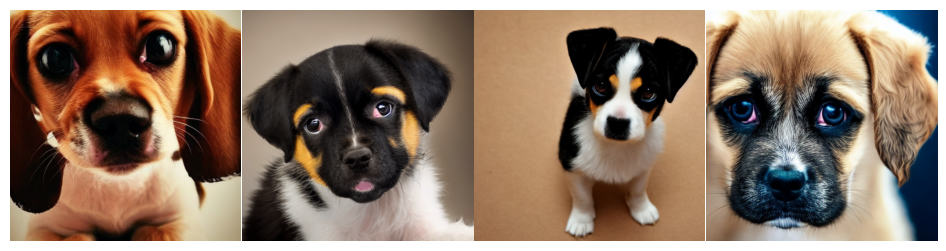

In [5]:
prompt = "A sad puppy with large eyes"
guidance_scale = 7.5
generator = torch.Generator('cuda').manual_seed(1)

images = pipe(prompt, num_inference_steps=50, generator=generator, guidance_scale=guidance_scale, num_images_per_prompt=4).images
visualize_images(images)

Давайте посмотрим, что выдаст модель за 4 шага.
Все то же самое, что и выше, просто поменяем число шагов.

100%|██████████| 4/4 [00:00<00:00,  5.97it/s]


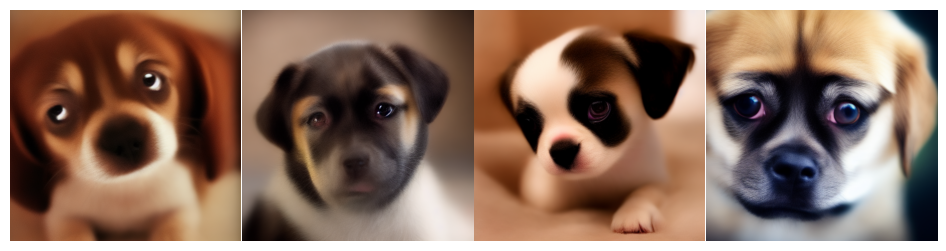

In [6]:
generator = torch.Generator('cuda').manual_seed(1)

images = pipe(prompt, num_inference_steps=4, generator=generator, guidance_scale=guidance_scale, num_images_per_prompt=4).images

visualize_images(images)

На 4 шагах картинки получаются размазанными. Давайте постараемся починить их.

##  Создаем датасет

Чтобы ДЗ было легко выполнимым на colab, мы будем учить консистенси модели на небольшой обучающей выборке из 5000 пар текст-картинка из COCO датасета.
Интересное свойство консистенси моделей - они могут сходиться до адекватного качества за несколько сотен шагов. Качество все еще будет не идеальным, но фазовый переход уже должен быть заметен.

Данные можно загрузить с помощью команд в ячейке ниже. В локальной текущей директории ./ должны появиться:
* Папка train2014_5k с 5000 картинками
* Файл train2014_5k.csv с 5000 промптами

Данные парсятся корректным образом в уже реализованном классе COCODataset.

#### Удалил здесь ячейку с загрузкой файлов, так как у неё слишком большой вывод и html версия ноутбука с ней получается очень длинной.

**Замечание:** для более быстрого дебаггинга можете взять, например, 2500 картинок и прогнать на всей выборке только в самом конце. 2500 картинок должно быть достаточно для понимания корректно ли реализованы функции.
Совсем для первичного дебаггинга можно взять еще меньше картинок.

In [8]:
from torchvision import transforms

transform = transforms.Compose(
    [
        transforms.Resize(512),
        transforms.CenterCrop(512),
        transforms.ToTensor(),
        lambda x: 2 * x - 1,
    ]
)
dataset = COCODataset(".",
    subset_name="train2014_5k",
    transform=transform,
    max_cnt=5000,
)
assert len(dataset) == 5000 # 2500

batch_size = 8 # Рекомендуемый размер батча на Colab

train_dataloader = torch.utils.data.DataLoader(
    dataset=dataset, shuffle=True, batch_size=batch_size, drop_last=True
)

In [9]:
@torch.no_grad()
def prepare_batch(batch, pipe):
    """
    Предобработка батча картинок и текстовых промптов.
    Маппим картинки в латентное пространство VAE.
    Извлекаем эмбеды промптов с помощью текстового энкодера.

    Params:

    Return:
        latents: torch.Tensor([B, 4, 64, 64], dtype=torch.float16)
        prompt_embeds: torch.Tensor([B, 77, D], dtype=torch.float16)
    """

    # Токенизируем промпты
    text_inputs = pipe.tokenizer(
        batch['text'],
        padding="max_length",
        max_length=pipe.tokenizer.model_max_length,
        truncation=True,
        return_tensors="pt",
    )

    # Извлекаем эмбеды промптов с помощью текстового энкодера
    prompt_embeds = pipe.text_encoder(text_inputs.input_ids.cuda())[0]

    # Переводим картинки в латентное пространство VAE
    image = batch['image'].to("cuda", dtype=torch.float16)
    latents = pipe.vae.encode(image).latent_dist.sample()
    latents = latents * pipe.vae.config.scaling_factor
    return latents, prompt_embeds

### Подготовка моделей и оптимизатора

Для начала создаем обучаемую модель: UNet инициализируемый весами SD1.5.
Вам нужно воспользоваться классом UNet2DConditionModel и загрузить отдельно только UNet модель из SD1.5.

Отметим, что эта модель у нас будет храниться в полной точности FP32, потому что обучение параметров в FP16 может приводить к нестабильностям и низкому качеству.

In [10]:
unet = UNet2DConditionModel.from_pretrained(model_id, subfolder="unet", torch_dtype=torch.float32)
unet.train()

assert unet.dtype == torch.float32
assert unet.training

Для экономии памяти во время обучения будем учить не параметры самой модели, а добавим в нее обучаемые LoRA адаптеры с малым числом параметров.

LoRA представляет собой маленькую добавку к весам модели, где на одну матрицу весов $W \in \mathbb{R}^{m{\times}n} $ обучаются две низкоранговые матрицы $W_A \in \mathbb{R}^{k{\times}n}$ и $W_B \in \mathbb{R}^{k{\times}m}$, где $k$ - ранг матрицы сильно меньше $m$ и $n$.

Тем самым, новая обученная матрица весов может быть представлена как $\hat{W} = W + \Delta W = W + W^T_B W_A$.  
Во время инференса $\Delta W$ можно вмержить в $W$ и получить итоговую модель.
Также частая практика оставлять адаптеры как есть, чтобы была возможность для одной базовой модели учить несколько адаптеров под разные задачи и переключаться между ними по необходимости.

Если не мержить адаптеры, то вычисления для линейного слоя происходят как на картинке ниже.

<img src=https://storage.yandexcloud.net/yandex-research/cvweek-cd-task-images/lora-idea.jpg width=300>

In [11]:
# Указываем к каким слоям модели мы будет добавлять адаптеры.
lora_modules = [
    "to_q", "to_k", "to_v", "to_out.0", "proj_in", "proj_out",
    "ff.net.0.proj", "ff.net.2", "conv1", "conv2", "conv_shortcut",
    "downsamplers.0.conv", "upsamplers.0.conv", "time_emb_proj"
]
lora_config = LoraConfig(
    r=64, # задает ранг у матриц A и B в LoRA.
    target_modules=lora_modules
)

# Создаем обертку исходной UNet модели с LoRA адаптерами, используя библиотеку PEFT
cm_unet = get_peft_model(unet, lora_config, adapter_name="ct")

# Включаем gradient checkpointing - важная техника для экономии памяти во время обучения
cm_unet.enable_gradient_checkpointing()

# Создаем оптимизатор
optimizer = torch.optim.AdamW(cm_unet.parameters(), lr=1e-4)

# Задаем лосс функцию для CM обжектива. В базовом варианте разумно взять L2
# По умолчанию, она уже выдает усредненное значение по всем размерностям
mse_loss = torch.nn.functional.mse_loss

## Задание №2 (0.5 балла, сдается в контесте)

####  Реализация шага DDIM

Шаг с помощью DDIM с $\mathbf{x}_t$ на $\mathbf{x}_s$ можно сделать следующим образом:

$
\mathbf{x}_s = DDIM(\epsilon_\theta, \mathbf{x}_t, t, s) = \alpha_s \cdot \left(\frac{\mathbf{x}_t - \sigma_t \epsilon_\theta}{\alpha_t} \right) + \sigma_s \epsilon_\theta
$

Вам нужно реализовать эту формулу в уже готовом шаблоне ниже.
Чтобы корректно выполнить задание, вам нужно задать $\alpha_t$ и $\sigma_t$ имея *DDIMScheduler*.
**Обратите внимание на аттрибут *scheduler.alphas_cumprod***, который задает $\bar\alpha_{t} = \prod^t_{i=1} (1-\beta_i)$ в классической DDPM формулировке: [Denoising Diffusion Probabilistic Models](https://arxiv.org/pdf/2006.11239).

In [12]:
def ddim_solver_step(model_output, x_t, t, s, scheduler):
    """
    Шаг DDIM солвера для VP процесса зашумления и eps-prediction модели
    params:
        model_output: torch.Tensor[B, 4, 64, 64] - предсказание модели - шум eps
        x_t: torch.Tensor[B, 4, 64, 64] - сэмплы на шаге t
        t: torch.Tensor[B] - номер текущего шага
        s: torch.Tensor[B] - номер следующего шага
        scheduler: DDIMScheduler - расписание диффузионного процесса, чтобы получить alpha и sigma
    """
    alphas = scheduler.alphas_cumprod
    sigmas = 1 - alphas
    sigmas_s = extract_into_tensor(sigmas, s, x_t.shape)
    alphas_s = extract_into_tensor(alphas, s, x_t.shape)

    sigmas_t = extract_into_tensor(sigmas, t, x_t.shape)
    alphas_t = extract_into_tensor(alphas, t, x_t.shape)

    # Выставляем крайние значения alpha и sigma, чтобы выполнялись граничные условия
    alphas_s[s == 0] = 1.0
    sigmas_s[s == 0] = 0.0

    alphas_t[t == 0] = 1.0
    sigmas_t[t == 0] = 0.0

    x_0 = (x_t - sigmas_t ** (0.5) * model_output) / alphas_t ** (0.5) # x0 оценка на шаге t
    x_s = alphas_s ** (0.5) * x_0 + sigmas_s ** (0.5) * model_output  # Переход на шаг s
    return x_s

####  Реализация процесса зашумления (q sample)

Аналогично, нам нужен процесс зашумления $q(\mathbf{x}_t | \mathbf{x}_0)= {N}(\mathbf{x}_t | \alpha_t \mathbf{x}_0, \sigma^2_t I)$

$\mathbf{x}_t = \alpha_t \mathbf{x}_0 + \sigma_t \epsilon$, где $\epsilon{\sim} {N}(0, I)$

In [13]:
def q_sample(x, t, scheduler, noise=None):
    alphas = scheduler.alphas_cumprod
    sigmas = 1 - alphas

    if noise is None:
        noise = torch.randn_like(x)

    sigmas_t = extract_into_tensor(sigmas, t, x.shape)
    alphas_t = extract_into_tensor(alphas, t, x.shape)

    x_t = alphas_t ** 0.5 * x + sigmas_t ** 0.5 * noise
    return x_t

# Consistency Training

Обучение консистенси моделей без учителя называется Consistency Training (CT).
В таком случае CM можно рассматривать как отдельный вид генеративных моделей.
Давайте начнем именно с этого подхода и обучим нашу первую консистенси модель на базе SD1.5.

## Задание №3

#### Задание №3.1 (0.5 балла, сдается в контесте)

В консиcтенси дистилляции модель учителя используется для получения второй точки на траектории ODE.
Можем ли мы попробовать оценить соседнюю точку аналитически?

Вам предлагается вывести это самим, используя формулу DDIM шага выше и вспомнив, как мы оцениваем скор функции в denoising score matching-e:

$\epsilon_\theta(x_t, t) = - \sigma_t s_\theta(x_t, t)$

$s_\theta(x_t, t) \approx \nabla_{x_t} \log q(x_t) = \mathop{\mathbb{E}}_{\mathbf{x}\sim p_{data}}\left [ \nabla_{\mathbf{x}_t} \log q(\mathbf{x}_t | \mathbf{x}) \vert \mathbf{x}_t \right ] \approx \nabla_{\mathbf{x}_t} \log q(\mathbf{x}_t \vert \mathbf{x})$

---

< YOUR DERIVATION HERE >
    
$x_s = ?$

---
    
Если возникнут трудности, можно обратиться к оригинальной [статье](https://arxiv.org/pdf/2303.01469).


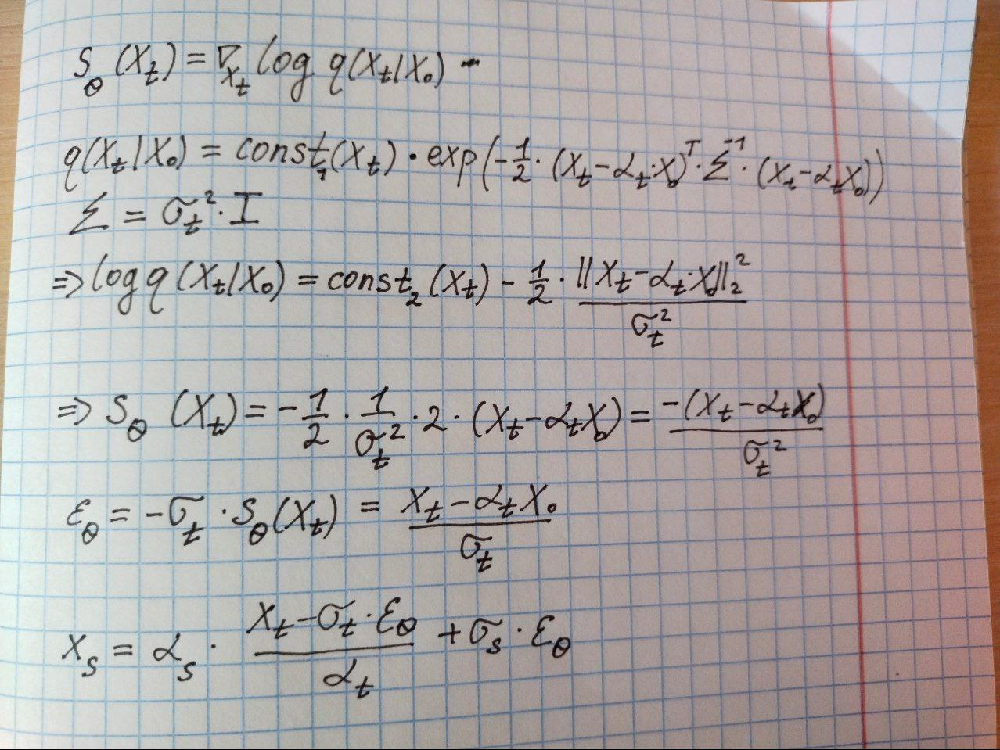

In [1]:
from IPython.display import Image, display

# Замените 'путь_к_изображению/название_изображения.jpg' на реальный путь
display(Image(filename='formula.jpg'))

Теперь реализуем то, что у вас получилось в функции ниже.

In [14]:
def get_xs_from_xt_naive(
    x_0, x_t, t, s, # Не все эти аргументы могут быть вам нужны
    scheduler,
    noise=None,
    **kwargs
):
    """
    Получение точки x_s в CT режиме, т.е., аналитически.
    """
    alphas = scheduler.alphas_cumprod ** 0.5
    sigmas = (1 - alphas ** 2) ** 0.5
    sigmas_t = extract_into_tensor(sigmas, t, x_0.shape)
    alphas_t = extract_into_tensor(alphas, t, x_0.shape)
    sigmas_s = extract_into_tensor(sigmas, s, x_0.shape)
    alphas_s = extract_into_tensor(alphas, s, x_0.shape)
    alphas_s[s == 0] = 1
    sigmas_s[s == 0] = 0
    alphas_t[t == 0] = 1
    sigmas_t[t == 0] = 0
    x_t = q_sample(x_0, t, scheduler, noise)
    eps = sigmas_t * (x_t - alphas_t * x_0) / sigmas_t ** 2
    x_s = alphas_s * (x_t - sigmas_t * eps) / alphas_t + sigmas_s * eps
    t_expanded = t.reshape(t.shape[0], *((1,) * (len(x_t.shape) - 1))).expand(x_t.shape)
    s_expanded = s.reshape(s.shape[0], *((1,) * (len(x_s.shape) - 1))).expand(x_s.shape)
    return torch.where(s_expanded != t_expanded, x_s, x_t)

#### Задание №3.2

Ниже предстален шаблон функции, которая считает лосс для консистенси моделей.
Вам нужно правильно заполнить пропуски, чтобы получилась корректная функция.

In [15]:
def cm_loss_template(
    latents, prompt_embeds, # батч латентов и текстовых эмбедов
    unet, scheduler,

    # Функции, которые будем постепенно менять от задания к заданию
    loss_fn: callable,
    get_boundary_timesteps: callable,
    get_xs_from_xt: callable,

    num_timesteps=1000,
    step_size=20, # Указываем с каким интервалом берем шаги s и t.
):
    # Сэмплируем случайные шаги t для каждого элемента батча t ~ U[step_size-1, 999]
    assert num_timesteps == 1000
    num_intervals = num_timesteps // step_size

    index = torch.randint(1, num_intervals, (len(latents),), device=latents.device).long() # [1, num_intervals]
    t = step_size * index - 1
    s = torch.clamp(t - step_size, min=0)
    boundary_timesteps = get_boundary_timesteps(    # shape: (bs,)
        s, num_timesteps=num_timesteps
    )

    # Сэмплируем x_t
    noise = torch.randn_like(latents)
    x_t = q_sample(latents, t, scheduler, noise)   # <YOUR CODE HERE>

    with torch.amp.autocast("cuda", torch.float16): # для реализации mixed-precision обучения в задании №4
        noise_pred = unet(x_t.float(), t,
            encoder_hidden_states=prompt_embeds.float(),
        ).sample

    # Получаем оценку в граничной точке для x_t
    boundary_pred = ddim_solver_step(noise_pred, x_t, t, boundary_timesteps, scheduler)    # <YOUR CODE HERE>

    # Получаем сэмпл x_s из x_t
    x_s = get_xs_from_xt(
        latents, x_t, t, s,
        scheduler,
        prompt_embeds=prompt_embeds,
        noise=noise,
    )

    # Предсказание "таргет моделью"
    with torch.no_grad(), torch.amp.autocast("cuda", torch.float16):
        target_noise_pred = unet(x_s, s, encoder_hidden_states=prompt_embeds).sample

    # Получаем оценку в граничной точке для x_s
    boundary_target = ddim_solver_step(target_noise_pred, x_s, s, boundary_timesteps, scheduler)    # <YOUR CODE HERE>

    loss = loss_fn(boundary_pred, boundary_target)
    return loss

In [16]:
def get_zero_boundary_timesteps(t, **kwargs):
    """
    Определяем шаги где будут срабатывать граничные условия.
    Для классических СM это t=0.
    """
    return torch.zeros_like(t)


ct_loss = functools.partial(
    cm_loss_template,

    loss_fn=mse_loss,
    get_boundary_timesteps=get_zero_boundary_timesteps,
    get_xs_from_xt=get_xs_from_xt_naive
)
assert cm_unet.active_adapter == 'ct'

## Задание №4

### Эффективное обучение
Данное задание рассчитано на успешное выполнение на colab с бесплатной Tesla T4 c 15GB VRAM.
Однако учить даже относительно небольшие T2I модели масштаба SD1.5 уже на коллабе в лоб проблематично.

Для этого нам нужно применить ряд инженерных техник, чтобы уместиться в данный бюджет и учиться за разумное время.

**Список техник**

1) Включить gradient checkpointing для обучемой модели
2) Добавить LoRA (Low Rank Adapters) адаптеры, чтобы учить не все веса, а только 10% добавочных весов
3) Использовать gradient accumulation, чтобы делать итерацию обучения по бОльшему батчу, чем влезает по памяти
4) Добавить mixed precision FP16/FP32 обучение модели для скорости. Обычно еще и память экономится, но в случае LoRA обучения + gradient checkpointing на память сильно влиять не должно, но зато станет быстрее.
5) Мульти-GPU обучение - распределение вычислений по нескольким GPU.  

1-2) Мы уже применили за вас выше

3-4) Предстоит реализовать вам самим в соотвествующей секции ниже

5 ) Недоступно, так как работаем на одной карточке

### Обучающий цикл

Вам дан код обучения модели в полной точности (FP32) c батчом 8.
К сожалению, на Tesla T4 мы не влезем по памяти.
Поэтому в ячейке ниже вам нужно модифицировать цикл, чтобы он работал в mixed precision FP16 и добавить gradient accumulation.

Про реализацию mixed-precision в pytorch можно перейти по ссылке: [Mixed-precision обучение](https://pytorch.org/docs/stable/notes/amp_examples.html#typical-mixed-precision-training)

**Обратите внимание**: вам еще нужно добавить одну строчку кода в *cm_loss_template* в соответствующем плейсхолдере.

**Замечание:** В начале обучения значения лосса должны быть в окрестности 0.0007-0.001. Ничего страшного, что лосс не падает, для CM это нормально. В конце обучения лосс может доходить до 0.005-0.01

In [17]:
def train_loop(model, pipe, train_dataloader, optimizer, loss_fn, num_grad_accum=1):
    torch.cuda.empty_cache()

    scaler = torch.amp.GradScaler('cuda')
    model.cuda()
    for i, batch in enumerate(tqdm(train_dataloader)):
        optimizer.zero_grad(set_to_none=True)

        latents, prompt_embeds = prepare_batch(batch, pipe)

        latents = latents.cuda()
        prompt_embeds = prompt_embeds.cuda()
        pipe.scheduler.timesteps = pipe.scheduler.timesteps.cuda()
        pipe.scheduler.alphas_cumprod = pipe.scheduler.alphas_cumprod.cuda()

        with torch.amp.autocast('cuda', torch.float16):
            loss = loss_fn(latents, prompt_embeds, model, pipe.scheduler)

        scaler.scale(loss).backward()

        if (i + 1) % num_grad_accum == 0:
            scaler.step(optimizer)
            scaler.update()

        print(f"Loss: {loss.detach().item()}")

In [18]:
num_grad_accum = 2 # обновляем параметры каждые 2 шага

train_loop(cm_unet, pipe, train_dataloader, optimizer, ct_loss, num_grad_accum)

  0%|          | 1/625 [00:02<30:38,  2.95s/it]

Loss: 0.0010963559616357088


  0%|          | 2/625 [00:04<24:21,  2.35s/it]

Loss: 0.002640365855768323


  0%|          | 3/625 [00:06<21:25,  2.07s/it]

Loss: 0.004093046300113201


  1%|          | 4/625 [00:08<20:08,  1.95s/it]

Loss: 0.0006848094053566456


  1%|          | 5/625 [00:10<19:21,  1.87s/it]

Loss: 0.0008856908534653485


  1%|          | 6/625 [00:11<18:57,  1.84s/it]

Loss: 0.0019075078889727592


  1%|          | 7/625 [00:13<18:37,  1.81s/it]

Loss: 0.0009523273911327124


  1%|▏         | 8/625 [00:15<18:26,  1.79s/it]

Loss: 0.0009223297238349915


  1%|▏         | 9/625 [00:17<18:16,  1.78s/it]

Loss: 0.0010772040113806725


  2%|▏         | 10/625 [00:18<18:11,  1.77s/it]

Loss: 0.0012756857322528958


  2%|▏         | 11/625 [00:20<18:04,  1.77s/it]

Loss: 0.0007401820039376616


  2%|▏         | 12/625 [00:22<18:00,  1.76s/it]

Loss: 0.001516564516350627


  2%|▏         | 13/625 [00:24<17:55,  1.76s/it]

Loss: 0.0008035607170313597


  2%|▏         | 14/625 [00:25<17:55,  1.76s/it]

Loss: 0.0021136081777513027


  2%|▏         | 15/625 [00:27<18:51,  1.85s/it]

Loss: 0.0008785557001829147


  3%|▎         | 16/625 [00:29<18:32,  1.83s/it]

Loss: 0.0010648875031620264


  3%|▎         | 17/625 [00:31<18:16,  1.80s/it]

Loss: 0.0009878266137093306


  3%|▎         | 18/625 [00:33<18:05,  1.79s/it]

Loss: 0.0009667902486398816


  3%|▎         | 19/625 [00:34<17:54,  1.77s/it]

Loss: 0.0034070254769176245


  3%|▎         | 20/625 [00:36<17:50,  1.77s/it]

Loss: 0.00088867376325652


  3%|▎         | 21/625 [00:38<17:44,  1.76s/it]

Loss: 0.0012572344858199358


  4%|▎         | 22/625 [00:40<17:43,  1.76s/it]

Loss: 0.0009431284270249307


  4%|▎         | 23/625 [00:42<17:37,  1.76s/it]

Loss: 0.0013003756757825613


  4%|▍         | 24/625 [00:43<17:35,  1.76s/it]

Loss: 0.002327771158888936


  4%|▍         | 25/625 [00:45<17:29,  1.75s/it]

Loss: 0.0009614496375434101


  4%|▍         | 26/625 [00:47<17:28,  1.75s/it]

Loss: 0.000999730546027422


  4%|▍         | 27/625 [00:48<17:23,  1.74s/it]

Loss: 0.0008238865993916988


  4%|▍         | 28/625 [00:50<17:23,  1.75s/it]

Loss: 0.0008935444056987762


  5%|▍         | 29/625 [00:52<17:19,  1.74s/it]

Loss: 0.001201600069180131


  5%|▍         | 30/625 [00:54<17:20,  1.75s/it]

Loss: 0.002780433278530836


  5%|▍         | 31/625 [00:55<17:18,  1.75s/it]

Loss: 0.001080552116036415


  5%|▌         | 32/625 [00:57<17:18,  1.75s/it]

Loss: 0.0028243146371096373


  5%|▌         | 33/625 [00:59<17:15,  1.75s/it]

Loss: 0.0007889920379966497


  5%|▌         | 34/625 [01:01<17:14,  1.75s/it]

Loss: 0.0016305013559758663


  6%|▌         | 35/625 [01:02<17:11,  1.75s/it]

Loss: 0.001052263774909079


  6%|▌         | 36/625 [01:04<17:10,  1.75s/it]

Loss: 0.0023590594064444304


  6%|▌         | 37/625 [01:06<17:10,  1.75s/it]

Loss: 0.0006017888663336635


  6%|▌         | 38/625 [01:08<17:09,  1.75s/it]

Loss: 0.0013532439479604363


  6%|▌         | 39/625 [01:09<17:06,  1.75s/it]

Loss: 0.0010743883904069662


  6%|▋         | 40/625 [01:11<17:05,  1.75s/it]

Loss: 0.00119753647595644


  7%|▋         | 41/625 [01:13<17:56,  1.84s/it]

Loss: 0.002207770012319088


  7%|▋         | 42/625 [01:15<17:40,  1.82s/it]

Loss: 0.0010693585500121117


  7%|▋         | 43/625 [01:17<17:25,  1.80s/it]

Loss: 0.002100614830851555


  7%|▋         | 44/625 [01:19<17:16,  1.78s/it]

Loss: 0.0006822514114901423


  7%|▋         | 45/625 [01:20<17:08,  1.77s/it]

Loss: 0.001282713608816266


  7%|▋         | 46/625 [01:22<17:02,  1.77s/it]

Loss: 0.0010924317175522447


  8%|▊         | 47/625 [01:24<16:54,  1.76s/it]

Loss: 0.0012507368810474873


  8%|▊         | 48/625 [01:26<16:55,  1.76s/it]

Loss: 0.0013835279969498515


  8%|▊         | 49/625 [01:27<16:50,  1.75s/it]

Loss: 0.0009057116694748402


  8%|▊         | 50/625 [01:29<16:49,  1.76s/it]

Loss: 0.0006195253226906061


  8%|▊         | 51/625 [01:31<16:44,  1.75s/it]

Loss: 0.0009804359870031476


  8%|▊         | 52/625 [01:33<16:43,  1.75s/it]

Loss: 0.0010410562390461564


  8%|▊         | 53/625 [01:34<16:39,  1.75s/it]

Loss: 0.0033090452197939157


  9%|▊         | 54/625 [01:36<16:40,  1.75s/it]

Loss: 0.0012584093492478132


  9%|▉         | 55/625 [01:38<16:35,  1.75s/it]

Loss: 0.0033806683495640755


  9%|▉         | 56/625 [01:40<16:37,  1.75s/it]

Loss: 0.0015018382109701633


  9%|▉         | 57/625 [01:41<16:30,  1.74s/it]

Loss: 0.0008816031040623784


  9%|▉         | 58/625 [01:43<16:30,  1.75s/it]

Loss: 0.001642550341784954


  9%|▉         | 59/625 [01:45<16:30,  1.75s/it]

Loss: 0.0016495713498443365


 10%|▉         | 60/625 [01:47<16:31,  1.76s/it]

Loss: 0.0013318717246875167


 10%|▉         | 61/625 [01:48<16:27,  1.75s/it]

Loss: 0.0015592356212437153


 10%|▉         | 62/625 [01:50<16:27,  1.75s/it]

Loss: 0.0014900176320225


 10%|█         | 63/625 [01:52<16:22,  1.75s/it]

Loss: 0.0016580900410190225


 10%|█         | 64/625 [01:54<16:23,  1.75s/it]

Loss: 0.0020386832766234875


 10%|█         | 65/625 [01:55<16:20,  1.75s/it]

Loss: 0.005399348214268684


 11%|█         | 66/625 [01:57<16:21,  1.76s/it]

Loss: 0.0012648331467062235


 11%|█         | 67/625 [01:59<17:09,  1.85s/it]

Loss: 0.0021185013465583324


 11%|█         | 68/625 [02:01<16:53,  1.82s/it]

Loss: 0.0012336424551904202


 11%|█         | 69/625 [02:03<16:38,  1.80s/it]

Loss: 0.001528067165054381


 11%|█         | 70/625 [02:04<16:31,  1.79s/it]

Loss: 0.004275219514966011


 11%|█▏        | 71/625 [02:06<16:23,  1.77s/it]

Loss: 0.002806056523695588


 12%|█▏        | 72/625 [02:08<16:18,  1.77s/it]

Loss: 0.001922826049849391


 12%|█▏        | 73/625 [02:10<16:13,  1.76s/it]

Loss: 0.0017090195324271917


 12%|█▏        | 74/625 [02:11<16:11,  1.76s/it]

Loss: 0.0038157186936587095


 12%|█▏        | 75/625 [02:13<16:06,  1.76s/it]

Loss: 0.001034450251609087


 12%|█▏        | 76/625 [02:15<16:05,  1.76s/it]

Loss: 0.002135921735316515


 12%|█▏        | 77/625 [02:17<16:02,  1.76s/it]

Loss: 0.0015638488112017512


 12%|█▏        | 78/625 [02:18<16:01,  1.76s/it]

Loss: 0.0016192939365282655


 13%|█▎        | 79/625 [02:20<15:57,  1.75s/it]

Loss: 0.001686635660007596


 13%|█▎        | 80/625 [02:22<15:56,  1.75s/it]

Loss: 0.0019719016272574663


 13%|█▎        | 81/625 [02:24<15:52,  1.75s/it]

Loss: 0.0028242317494004965


 13%|█▎        | 82/625 [02:25<15:51,  1.75s/it]

Loss: 0.0018931574886664748


 13%|█▎        | 83/625 [02:27<15:48,  1.75s/it]

Loss: 0.0014252495020627975


 13%|█▎        | 84/625 [02:29<15:47,  1.75s/it]

Loss: 0.0040550632402300835


 14%|█▎        | 85/625 [02:31<15:44,  1.75s/it]

Loss: 0.0029921173118054867


 14%|█▍        | 86/625 [02:32<15:45,  1.75s/it]

Loss: 0.0016337158158421516


 14%|█▍        | 87/625 [02:34<15:38,  1.74s/it]

Loss: 0.0011309629771858454


 14%|█▍        | 88/625 [02:36<15:36,  1.74s/it]

Loss: 0.0017427548300474882


 14%|█▍        | 89/625 [02:38<15:33,  1.74s/it]

Loss: 0.003795104566961527


 14%|█▍        | 90/625 [02:39<15:33,  1.74s/it]

Loss: 0.003072993829846382


 15%|█▍        | 91/625 [02:41<15:31,  1.74s/it]

Loss: 0.0072985319420695305


 15%|█▍        | 92/625 [02:43<15:31,  1.75s/it]

Loss: 0.002599050523713231


 15%|█▍        | 93/625 [02:45<15:29,  1.75s/it]

Loss: 0.003643906209617853


 15%|█▌        | 94/625 [02:47<16:21,  1.85s/it]

Loss: 0.002171820728108287


 15%|█▌        | 95/625 [02:48<16:02,  1.82s/it]

Loss: 0.004933665506541729


 15%|█▌        | 96/625 [02:50<15:52,  1.80s/it]

Loss: 0.003263566642999649


 16%|█▌        | 97/625 [02:52<15:40,  1.78s/it]

Loss: 0.004937600344419479


 16%|█▌        | 98/625 [02:54<15:36,  1.78s/it]

Loss: 0.002887067385017872


 16%|█▌        | 99/625 [02:55<15:30,  1.77s/it]

Loss: 0.007803681306540966


 16%|█▌        | 100/625 [02:57<15:26,  1.76s/it]

Loss: 0.0061964234337210655


 16%|█▌        | 101/625 [02:59<15:19,  1.75s/it]

Loss: 0.005369784776121378


 16%|█▋        | 102/625 [03:01<15:17,  1.75s/it]

Loss: 0.004351908341050148


 16%|█▋        | 103/625 [03:02<15:13,  1.75s/it]

Loss: 0.0017088190652430058


 17%|█▋        | 104/625 [03:04<15:13,  1.75s/it]

Loss: 0.002917514182627201


 17%|█▋        | 105/625 [03:06<15:11,  1.75s/it]

Loss: 0.00866727065294981


 17%|█▋        | 106/625 [03:08<15:09,  1.75s/it]

Loss: 0.006168552674353123


 17%|█▋        | 107/625 [03:09<15:07,  1.75s/it]

Loss: 0.007289751898497343


 17%|█▋        | 108/625 [03:11<15:06,  1.75s/it]

Loss: 0.004506804049015045


 17%|█▋        | 109/625 [03:13<15:03,  1.75s/it]

Loss: 0.0021675738971680403


 18%|█▊        | 110/625 [03:15<15:02,  1.75s/it]

Loss: 0.002376883989199996


 18%|█▊        | 111/625 [03:16<14:58,  1.75s/it]

Loss: 0.004366061184555292


 18%|█▊        | 112/625 [03:18<14:58,  1.75s/it]

Loss: 0.00389341963455081


 18%|█▊        | 113/625 [03:20<14:54,  1.75s/it]

Loss: 0.005959343630820513


 18%|█▊        | 114/625 [03:22<14:53,  1.75s/it]

Loss: 0.004746898077428341


 18%|█▊        | 115/625 [03:23<14:52,  1.75s/it]

Loss: 0.005962763912975788


 19%|█▊        | 116/625 [03:25<14:52,  1.75s/it]

Loss: 0.002336144680157304


 19%|█▊        | 117/625 [03:27<14:49,  1.75s/it]

Loss: 0.03506225347518921


 19%|█▉        | 118/625 [03:29<14:47,  1.75s/it]

Loss: 0.010035783052444458


 19%|█▉        | 119/625 [03:30<14:46,  1.75s/it]

Loss: 0.005317365750670433


 19%|█▉        | 120/625 [03:32<15:06,  1.79s/it]

Loss: 0.003848121967166662


 19%|█▉        | 121/625 [03:34<14:57,  1.78s/it]

Loss: 0.003674061270430684


 20%|█▉        | 122/625 [03:36<14:53,  1.78s/it]

Loss: 0.0025972656439989805


 20%|█▉        | 123/625 [03:38<14:47,  1.77s/it]

Loss: 0.00793578289449215


 20%|█▉        | 124/625 [03:39<14:45,  1.77s/it]

Loss: 0.005538876634091139


 20%|██        | 125/625 [03:41<14:40,  1.76s/it]

Loss: 0.0043379622511565685


 20%|██        | 126/625 [03:43<14:38,  1.76s/it]

Loss: 0.007994452491402626


 20%|██        | 127/625 [03:45<14:35,  1.76s/it]

Loss: 0.00316509697586298


 20%|██        | 128/625 [03:46<14:34,  1.76s/it]

Loss: 0.0027290149591863155


 21%|██        | 129/625 [03:48<14:30,  1.76s/it]

Loss: 0.00207534059882164


 21%|██        | 130/625 [03:50<14:28,  1.75s/it]

Loss: 0.004345363937318325


 21%|██        | 131/625 [03:52<14:24,  1.75s/it]

Loss: 0.005595435854047537


 21%|██        | 132/625 [03:53<14:26,  1.76s/it]

Loss: 0.010566018521785736


 21%|██▏       | 133/625 [03:55<14:23,  1.75s/it]

Loss: 0.004573257640004158


 21%|██▏       | 134/625 [03:57<14:22,  1.76s/it]

Loss: 0.002849765121936798


 22%|██▏       | 135/625 [03:59<14:19,  1.75s/it]

Loss: 0.003724263980984688


 22%|██▏       | 136/625 [04:00<14:19,  1.76s/it]

Loss: 0.0031992411240935326


 22%|██▏       | 137/625 [04:02<14:16,  1.75s/it]

Loss: 0.0030322913080453873


 22%|██▏       | 138/625 [04:04<14:13,  1.75s/it]

Loss: 0.005120765417814255


 22%|██▏       | 139/625 [04:06<14:10,  1.75s/it]

Loss: 0.001602296018972993


 22%|██▏       | 140/625 [04:07<14:10,  1.75s/it]

Loss: 0.002627607434988022


 23%|██▎       | 141/625 [04:09<14:08,  1.75s/it]

Loss: 0.00425109826028347


 23%|██▎       | 142/625 [04:11<14:07,  1.75s/it]

Loss: 0.0020796002354472876


 23%|██▎       | 143/625 [04:13<14:03,  1.75s/it]

Loss: 0.004599973559379578


 23%|██▎       | 144/625 [04:15<14:48,  1.85s/it]

Loss: 0.005451355595141649


 23%|██▎       | 145/625 [04:17<14:30,  1.81s/it]

Loss: 0.0012438915437087417


 23%|██▎       | 146/625 [04:18<14:20,  1.80s/it]

Loss: 0.004868386313319206


 24%|██▎       | 147/625 [04:20<14:10,  1.78s/it]

Loss: 0.007403743453323841


 24%|██▎       | 148/625 [04:22<14:06,  1.78s/it]

Loss: 0.0017914469353854656


 24%|██▍       | 149/625 [04:24<14:00,  1.77s/it]

Loss: 0.0018200874328613281


 24%|██▍       | 150/625 [04:25<13:56,  1.76s/it]

Loss: 0.0024964134208858013


 24%|██▍       | 151/625 [04:27<13:53,  1.76s/it]

Loss: 0.0017075012437999249


 24%|██▍       | 152/625 [04:29<13:51,  1.76s/it]

Loss: 0.0055163209326565266


 24%|██▍       | 153/625 [04:31<13:48,  1.75s/it]

Loss: 0.003391474951058626


 25%|██▍       | 154/625 [04:32<13:45,  1.75s/it]

Loss: 0.0026438101194798946


 25%|██▍       | 155/625 [04:34<13:42,  1.75s/it]

Loss: 0.002587338909506798


 25%|██▍       | 156/625 [04:36<13:42,  1.75s/it]

Loss: 0.000709876767359674


 25%|██▌       | 157/625 [04:38<13:38,  1.75s/it]

Loss: 0.0033558914437890053


 25%|██▌       | 158/625 [04:39<13:36,  1.75s/it]

Loss: 0.001215902273543179


 25%|██▌       | 159/625 [04:41<13:34,  1.75s/it]

Loss: 0.006806368473917246


 26%|██▌       | 160/625 [04:43<13:34,  1.75s/it]

Loss: 0.0028275633230805397


 26%|██▌       | 161/625 [04:45<13:32,  1.75s/it]

Loss: 0.0022389909718185663


 26%|██▌       | 162/625 [04:46<13:32,  1.75s/it]

Loss: 0.004391180817037821


 26%|██▌       | 163/625 [04:48<13:30,  1.75s/it]

Loss: 0.0024692201986908913


 26%|██▌       | 164/625 [04:50<13:29,  1.76s/it]

Loss: 0.004521603230386972


 26%|██▋       | 165/625 [04:52<13:27,  1.75s/it]

Loss: 0.001798322657123208


 27%|██▋       | 166/625 [04:53<13:26,  1.76s/it]

Loss: 0.0016611116006970406


 27%|██▋       | 167/625 [04:55<13:23,  1.75s/it]

Loss: 0.0034274146892130375


 27%|██▋       | 168/625 [04:57<13:21,  1.75s/it]

Loss: 0.0016609214944764972


 27%|██▋       | 169/625 [04:59<13:18,  1.75s/it]

Loss: 0.0019227287266403437


 27%|██▋       | 170/625 [05:01<14:01,  1.85s/it]

Loss: 0.0014804479433223605


 27%|██▋       | 171/625 [05:02<13:45,  1.82s/it]

Loss: 0.0023205173201858997


 28%|██▊       | 172/625 [05:04<13:35,  1.80s/it]

Loss: 0.0013492468278855085


 28%|██▊       | 173/625 [05:06<13:25,  1.78s/it]

Loss: 0.0016711615025997162


 28%|██▊       | 174/625 [05:08<13:19,  1.77s/it]

Loss: 0.00416654534637928


 28%|██▊       | 175/625 [05:09<13:15,  1.77s/it]

Loss: 0.004129789769649506


 28%|██▊       | 176/625 [05:11<13:11,  1.76s/it]

Loss: 0.006339481566101313


 28%|██▊       | 177/625 [05:13<13:06,  1.75s/it]

Loss: 0.000984245096333325


 28%|██▊       | 178/625 [05:15<13:05,  1.76s/it]

Loss: 0.0016758614219725132


 29%|██▊       | 179/625 [05:16<13:02,  1.75s/it]

Loss: 0.0016732661752030253


 29%|██▉       | 180/625 [05:18<13:00,  1.75s/it]

Loss: 0.002166694262996316


 29%|██▉       | 181/625 [05:20<12:56,  1.75s/it]

Loss: 0.0023079444654285908


 29%|██▉       | 182/625 [05:22<12:57,  1.75s/it]

Loss: 0.0016316981054842472


 29%|██▉       | 183/625 [05:23<12:55,  1.75s/it]

Loss: 0.0010662577114999294


 29%|██▉       | 184/625 [05:25<12:55,  1.76s/it]

Loss: 0.001074870233424008


 30%|██▉       | 185/625 [05:27<12:51,  1.75s/it]

Loss: 0.0022782059386372566


 30%|██▉       | 186/625 [05:29<12:51,  1.76s/it]

Loss: 0.0025286725722253323


 30%|██▉       | 187/625 [05:30<12:47,  1.75s/it]

Loss: 0.0015049749054014683


 30%|███       | 188/625 [05:32<12:46,  1.75s/it]

Loss: 0.0028739371336996555


 30%|███       | 189/625 [05:34<12:41,  1.75s/it]

Loss: 0.0009124286007136106


 30%|███       | 190/625 [05:36<12:42,  1.75s/it]

Loss: 0.0015053985407575965


 31%|███       | 191/625 [05:37<12:38,  1.75s/it]

Loss: 0.0029758764430880547


 31%|███       | 192/625 [05:39<12:37,  1.75s/it]

Loss: 0.004457541275769472


 31%|███       | 193/625 [05:41<12:35,  1.75s/it]

Loss: 0.002582042943686247


 31%|███       | 194/625 [05:43<12:32,  1.75s/it]

Loss: 0.001769360387697816


 31%|███       | 195/625 [05:44<12:30,  1.75s/it]

Loss: 0.003297220217064023


 31%|███▏      | 196/625 [05:46<12:31,  1.75s/it]

Loss: 0.001631542923860252


 32%|███▏      | 197/625 [05:48<13:08,  1.84s/it]

Loss: 0.0011108452454209328


 32%|███▏      | 198/625 [05:50<12:55,  1.82s/it]

Loss: 0.0019230158068239689


 32%|███▏      | 199/625 [05:52<12:43,  1.79s/it]

Loss: 0.0007622446864843369


 32%|███▏      | 200/625 [05:53<12:37,  1.78s/it]

Loss: 0.0016001646872609854


 32%|███▏      | 201/625 [05:55<12:30,  1.77s/it]

Loss: 0.0017777334433048964


 32%|███▏      | 202/625 [05:57<12:27,  1.77s/it]

Loss: 0.001619191374629736


 32%|███▏      | 203/625 [05:59<12:21,  1.76s/it]

Loss: 0.001958227250725031


 33%|███▎      | 204/625 [06:00<12:19,  1.76s/it]

Loss: 0.0020124195143580437


 33%|███▎      | 205/625 [06:02<12:16,  1.75s/it]

Loss: 0.0021313857287168503


 33%|███▎      | 206/625 [06:04<12:17,  1.76s/it]

Loss: 0.0018860702402889729


 33%|███▎      | 207/625 [06:06<12:14,  1.76s/it]

Loss: 0.00427350215613842


 33%|███▎      | 208/625 [06:07<12:13,  1.76s/it]

Loss: 0.0011205421760678291


 33%|███▎      | 209/625 [06:09<12:09,  1.75s/it]

Loss: 0.0016671146731823683


 34%|███▎      | 210/625 [06:11<12:09,  1.76s/it]

Loss: 0.0013068877160549164


 34%|███▍      | 211/625 [06:13<12:05,  1.75s/it]

Loss: 0.0007610495667904615


 34%|███▍      | 212/625 [06:14<12:05,  1.76s/it]

Loss: 0.0008280547335743904


 34%|███▍      | 213/625 [06:16<12:01,  1.75s/it]

Loss: 0.0015318230725824833


 34%|███▍      | 214/625 [06:18<12:00,  1.75s/it]

Loss: 0.0020559816621243954


 34%|███▍      | 215/625 [06:20<11:56,  1.75s/it]

Loss: 0.0026962128467857838


 35%|███▍      | 216/625 [06:21<11:56,  1.75s/it]

Loss: 0.0015197611646726727


 35%|███▍      | 217/625 [06:23<11:53,  1.75s/it]

Loss: 0.0014483786653727293


 35%|███▍      | 218/625 [06:25<11:53,  1.75s/it]

Loss: 0.002023404696956277


 35%|███▌      | 219/625 [06:27<11:50,  1.75s/it]

Loss: 0.0011368587147444487


 35%|███▌      | 220/625 [06:29<11:50,  1.76s/it]

Loss: 0.0015069886576384306


 35%|███▌      | 221/625 [06:30<11:47,  1.75s/it]

Loss: 0.002779328729957342


 36%|███▌      | 222/625 [06:32<12:19,  1.84s/it]

Loss: 0.0024742817040532827


 36%|███▌      | 223/625 [06:34<12:07,  1.81s/it]

Loss: 0.0025434282142668962


 36%|███▌      | 224/625 [06:36<11:59,  1.79s/it]

Loss: 0.001963521121069789


 36%|███▌      | 225/625 [06:38<11:50,  1.78s/it]

Loss: 0.0019855478312820196


 36%|███▌      | 226/625 [06:39<11:46,  1.77s/it]

Loss: 0.005486053880304098


 36%|███▋      | 227/625 [06:41<11:40,  1.76s/it]

Loss: 0.0026046691928058863


 36%|███▋      | 228/625 [06:43<11:38,  1.76s/it]

Loss: 0.0030683523509651423


 37%|███▋      | 229/625 [06:45<11:33,  1.75s/it]

Loss: 0.003892722073942423


 37%|███▋      | 230/625 [06:46<11:32,  1.75s/it]

Loss: 0.0008370985742658377


 37%|███▋      | 231/625 [06:48<11:30,  1.75s/it]

Loss: 0.0023328119423240423


 37%|███▋      | 232/625 [06:50<11:30,  1.76s/it]

Loss: 0.001987742492929101


 37%|███▋      | 233/625 [06:52<11:26,  1.75s/it]

Loss: 0.004680289886891842


 37%|███▋      | 234/625 [06:53<11:25,  1.75s/it]

Loss: 0.0014709618408232927


 38%|███▊      | 235/625 [06:55<11:21,  1.75s/it]

Loss: 0.0016663268906995654


 38%|███▊      | 236/625 [06:57<11:21,  1.75s/it]

Loss: 0.0010517837945371866


 38%|███▊      | 237/625 [06:59<11:18,  1.75s/it]

Loss: 0.001561962766572833


 38%|███▊      | 238/625 [07:00<11:18,  1.75s/it]

Loss: 0.0017912146868184209


 38%|███▊      | 239/625 [07:02<11:15,  1.75s/it]

Loss: 0.0013694398803636432


 38%|███▊      | 240/625 [07:04<11:16,  1.76s/it]

Loss: 0.0033471775241196156


 39%|███▊      | 241/625 [07:06<11:11,  1.75s/it]

Loss: 0.0011567004257813096


 39%|███▊      | 242/625 [07:07<11:11,  1.75s/it]

Loss: 0.0024377419613301754


 39%|███▉      | 243/625 [07:09<11:07,  1.75s/it]

Loss: 0.0028210715390741825


 39%|███▉      | 244/625 [07:11<11:06,  1.75s/it]

Loss: 0.0019792201928794384


 39%|███▉      | 245/625 [07:13<11:04,  1.75s/it]

Loss: 0.0017124953446909785


 39%|███▉      | 246/625 [07:14<11:04,  1.75s/it]

Loss: 0.0030572989489883184


 40%|███▉      | 247/625 [07:16<11:01,  1.75s/it]

Loss: 0.0009649006533436477


 40%|███▉      | 248/625 [07:18<11:33,  1.84s/it]

Loss: 0.001769613940268755


 40%|███▉      | 249/625 [07:20<11:19,  1.81s/it]

Loss: 0.00158149772323668


 40%|████      | 250/625 [07:22<11:11,  1.79s/it]

Loss: 0.0015758589142933488


 40%|████      | 251/625 [07:23<11:04,  1.78s/it]

Loss: 0.0012323823757469654


 40%|████      | 252/625 [07:25<11:01,  1.77s/it]

Loss: 0.002692123642191291


 40%|████      | 253/625 [07:27<10:56,  1.76s/it]

Loss: 0.0016142036765813828


 41%|████      | 254/625 [07:29<10:54,  1.76s/it]

Loss: 0.0026642552111297846


 41%|████      | 255/625 [07:30<10:49,  1.75s/it]

Loss: 0.0035922699607908726


 41%|████      | 256/625 [07:32<10:49,  1.76s/it]

Loss: 0.0049118055030703545


 41%|████      | 257/625 [07:34<10:45,  1.76s/it]

Loss: 0.0024058420676738024


 41%|████▏     | 258/625 [07:36<10:45,  1.76s/it]

Loss: 0.0021532527171075344


 41%|████▏     | 259/625 [07:37<10:40,  1.75s/it]

Loss: 0.0028721115086227655


 42%|████▏     | 260/625 [07:39<10:39,  1.75s/it]

Loss: 0.0031549681443721056


 42%|████▏     | 261/625 [07:41<10:35,  1.75s/it]

Loss: 0.0027280915528535843


 42%|████▏     | 262/625 [07:43<10:36,  1.75s/it]

Loss: 0.003343175398185849


 42%|████▏     | 263/625 [07:44<10:32,  1.75s/it]

Loss: 0.0038005926180630922


 42%|████▏     | 264/625 [07:46<10:32,  1.75s/it]

Loss: 0.003056747606024146


 42%|████▏     | 265/625 [07:48<10:29,  1.75s/it]

Loss: 0.0021216419991105795


 43%|████▎     | 266/625 [07:50<10:28,  1.75s/it]

Loss: 0.0025486997328698635


 43%|████▎     | 267/625 [07:51<10:25,  1.75s/it]

Loss: 0.0025919941253960133


 43%|████▎     | 268/625 [07:53<10:23,  1.75s/it]

Loss: 0.00175010459497571


 43%|████▎     | 269/625 [07:55<10:23,  1.75s/it]

Loss: 0.00148613634519279


 43%|████▎     | 270/625 [07:57<10:22,  1.75s/it]

Loss: 0.0011486567091196775


 43%|████▎     | 271/625 [07:58<10:20,  1.75s/it]

Loss: 0.003311105305328965


 44%|████▎     | 272/625 [08:00<10:20,  1.76s/it]

Loss: 0.004230785649269819


 44%|████▎     | 273/625 [08:02<10:16,  1.75s/it]

Loss: 0.0022063362412154675


 44%|████▍     | 274/625 [08:04<10:15,  1.75s/it]

Loss: 0.001436581602320075


 44%|████▍     | 275/625 [08:06<10:40,  1.83s/it]

Loss: 0.001971895107999444


 44%|████▍     | 276/625 [08:07<10:30,  1.81s/it]

Loss: 0.0019761505536735058


 44%|████▍     | 277/625 [08:09<10:21,  1.79s/it]

Loss: 0.0020579975098371506


 44%|████▍     | 278/625 [08:11<10:17,  1.78s/it]

Loss: 0.0011583267478272319


 45%|████▍     | 279/625 [08:13<10:12,  1.77s/it]

Loss: 0.004643329419195652


 45%|████▍     | 280/625 [08:14<10:10,  1.77s/it]

Loss: 0.0013841601321473718


 45%|████▍     | 281/625 [08:16<10:06,  1.76s/it]

Loss: 0.0017067503649741411


 45%|████▌     | 282/625 [08:18<10:04,  1.76s/it]

Loss: 0.0016099782660603523


 45%|████▌     | 283/625 [08:20<10:01,  1.76s/it]

Loss: 0.0014905615244060755


 45%|████▌     | 284/625 [08:21<10:00,  1.76s/it]

Loss: 0.002322200918570161


 46%|████▌     | 285/625 [08:23<09:56,  1.75s/it]

Loss: 0.0018119851592928171


 46%|████▌     | 286/625 [08:25<09:55,  1.76s/it]

Loss: 0.002200494986027479


 46%|████▌     | 287/625 [08:27<09:52,  1.75s/it]

Loss: 0.0010618013329803944


 46%|████▌     | 288/625 [08:28<09:50,  1.75s/it]

Loss: 0.0017157901311293244


 46%|████▌     | 289/625 [08:30<09:47,  1.75s/it]

Loss: 0.004065594170242548


 46%|████▋     | 290/625 [08:32<09:46,  1.75s/it]

Loss: 0.0024214794393628836


 47%|████▋     | 291/625 [08:34<09:44,  1.75s/it]

Loss: 0.00283280061557889


 47%|████▋     | 292/625 [08:35<09:44,  1.75s/it]

Loss: 0.0011076850350946188


 47%|████▋     | 293/625 [08:37<09:40,  1.75s/it]

Loss: 0.0016576352063566446


 47%|████▋     | 294/625 [08:39<09:39,  1.75s/it]

Loss: 0.0007473558071069419


 47%|████▋     | 295/625 [08:41<09:36,  1.75s/it]

Loss: 0.0013187965378165245


 47%|████▋     | 296/625 [08:42<09:34,  1.75s/it]

Loss: 0.0026392571162432432


 48%|████▊     | 297/625 [08:44<09:31,  1.74s/it]

Loss: 0.0015333532355725765


 48%|████▊     | 298/625 [08:46<09:32,  1.75s/it]

Loss: 0.0015688170678913593


 48%|████▊     | 299/625 [08:48<09:30,  1.75s/it]

Loss: 0.008353393524885178


 48%|████▊     | 300/625 [08:49<09:29,  1.75s/it]

Loss: 0.0015980794560164213


 48%|████▊     | 301/625 [08:51<09:54,  1.84s/it]

Loss: 0.0025809514336287975


 48%|████▊     | 302/625 [08:53<09:45,  1.81s/it]

Loss: 0.001670431112870574


 48%|████▊     | 303/625 [08:55<09:38,  1.80s/it]

Loss: 0.0014149646740406752


 49%|████▊     | 304/625 [08:57<09:32,  1.78s/it]

Loss: 0.0015929238870739937


 49%|████▉     | 305/625 [08:58<09:26,  1.77s/it]

Loss: 0.0011512413620948792


 49%|████▉     | 306/625 [09:00<09:23,  1.77s/it]

Loss: 0.003692255588248372


 49%|████▉     | 307/625 [09:02<09:20,  1.76s/it]

Loss: 0.001893860287964344


 49%|████▉     | 308/625 [09:04<09:19,  1.76s/it]

Loss: 0.0024398043751716614


 49%|████▉     | 309/625 [09:05<09:15,  1.76s/it]

Loss: 0.002184295793995261


 50%|████▉     | 310/625 [09:07<09:14,  1.76s/it]

Loss: 0.003349015722051263


 50%|████▉     | 311/625 [09:09<09:10,  1.75s/it]

Loss: 0.0012147361412644386


 50%|████▉     | 312/625 [09:11<09:09,  1.76s/it]

Loss: 0.0026995467487722635


 50%|█████     | 313/625 [09:12<09:06,  1.75s/it]

Loss: 0.0022115488536655903


 50%|█████     | 314/625 [09:14<09:05,  1.76s/it]

Loss: 0.005337580107152462


 50%|█████     | 315/625 [09:16<09:03,  1.75s/it]

Loss: 0.004558613058179617


 51%|█████     | 316/625 [09:18<09:01,  1.75s/it]

Loss: 0.002284193178638816


 51%|█████     | 317/625 [09:19<08:58,  1.75s/it]

Loss: 0.0016866428777575493


 51%|█████     | 318/625 [09:21<08:57,  1.75s/it]

Loss: 0.002135797869414091


 51%|█████     | 319/625 [09:23<08:55,  1.75s/it]

Loss: 0.0014747462701052427


 51%|█████     | 320/625 [09:25<08:54,  1.75s/it]

Loss: 0.005136046092957258


 51%|█████▏    | 321/625 [09:26<08:51,  1.75s/it]

Loss: 0.0018035240937024355


 52%|█████▏    | 322/625 [09:28<08:50,  1.75s/it]

Loss: 0.0021058490965515375


 52%|█████▏    | 323/625 [09:30<08:48,  1.75s/it]

Loss: 0.0023947530426084995


 52%|█████▏    | 324/625 [09:32<08:46,  1.75s/it]

Loss: 0.0014184117317199707


 52%|█████▏    | 325/625 [09:33<08:43,  1.75s/it]

Loss: 0.0033067455515265465


 52%|█████▏    | 326/625 [09:36<09:11,  1.84s/it]

Loss: 0.0023434858303517103


 52%|█████▏    | 327/625 [09:37<09:00,  1.81s/it]

Loss: 0.002871147822588682


 52%|█████▏    | 328/625 [09:39<08:53,  1.80s/it]

Loss: 0.0016400052700191736


 53%|█████▎    | 329/625 [09:41<08:46,  1.78s/it]

Loss: 0.0035207392647862434


 53%|█████▎    | 330/625 [09:43<08:42,  1.77s/it]

Loss: 0.001170867239125073


 53%|█████▎    | 331/625 [09:44<08:39,  1.77s/it]

Loss: 0.002331409603357315


 53%|█████▎    | 332/625 [09:46<08:36,  1.76s/it]

Loss: 0.004390188958495855


 53%|█████▎    | 333/625 [09:48<08:33,  1.76s/it]

Loss: 0.0016691742930561304


 53%|█████▎    | 334/625 [09:50<08:31,  1.76s/it]

Loss: 0.002091754460707307


 54%|█████▎    | 335/625 [09:51<08:28,  1.75s/it]

Loss: 0.003861676435917616


 54%|█████▍    | 336/625 [09:53<08:27,  1.76s/it]

Loss: 0.0031095659360289574


 54%|█████▍    | 337/625 [09:55<08:24,  1.75s/it]

Loss: 0.0019432457629591227


 54%|█████▍    | 338/625 [09:57<08:22,  1.75s/it]

Loss: 0.0016478333855047822


 54%|█████▍    | 339/625 [09:58<08:20,  1.75s/it]

Loss: 0.003041923511773348


 54%|█████▍    | 340/625 [10:00<08:19,  1.75s/it]

Loss: 0.0036877747625112534


 55%|█████▍    | 341/625 [10:02<08:16,  1.75s/it]

Loss: 0.0035069880541414022


 55%|█████▍    | 342/625 [10:04<08:15,  1.75s/it]

Loss: 0.00413243705406785


 55%|█████▍    | 343/625 [10:05<08:13,  1.75s/it]

Loss: 0.0011439751833677292


 55%|█████▌    | 344/625 [10:07<08:12,  1.75s/it]

Loss: 0.002522686729207635


 55%|█████▌    | 345/625 [10:09<08:09,  1.75s/it]

Loss: 0.001948860939592123


 55%|█████▌    | 346/625 [10:11<08:07,  1.75s/it]

Loss: 0.0018840045668184757


 56%|█████▌    | 347/625 [10:12<08:05,  1.75s/it]

Loss: 0.002000111620873213


 56%|█████▌    | 348/625 [10:14<08:05,  1.75s/it]

Loss: 0.003172521246597171


 56%|█████▌    | 349/625 [10:16<08:04,  1.75s/it]

Loss: 0.0018812648486346006


 56%|█████▌    | 350/625 [10:18<08:03,  1.76s/it]

Loss: 0.002154161687940359


 56%|█████▌    | 351/625 [10:19<07:59,  1.75s/it]

Loss: 0.0011373227462172508


 56%|█████▋    | 352/625 [10:21<07:59,  1.76s/it]

Loss: 0.0023544314317405224


 56%|█████▋    | 353/625 [10:23<08:22,  1.85s/it]

Loss: 0.004484873265028


 57%|█████▋    | 354/625 [10:25<08:13,  1.82s/it]

Loss: 0.0052452124655246735


 57%|█████▋    | 355/625 [10:27<08:04,  1.80s/it]

Loss: 0.0035124344285577536


 57%|█████▋    | 356/625 [10:28<07:59,  1.78s/it]

Loss: 0.0020542368292808533


 57%|█████▋    | 357/625 [10:30<07:54,  1.77s/it]

Loss: 0.0018414894584566355


 57%|█████▋    | 358/625 [10:32<07:52,  1.77s/it]

Loss: 0.0017864636611193419


 57%|█████▋    | 359/625 [10:34<07:47,  1.76s/it]

Loss: 0.004031389020383358


 58%|█████▊    | 360/625 [10:35<07:46,  1.76s/it]

Loss: 0.0017017186619341373


 58%|█████▊    | 361/625 [10:37<07:42,  1.75s/it]

Loss: 0.0043097855523228645


 58%|█████▊    | 362/625 [10:39<07:42,  1.76s/it]

Loss: 0.0037016498390585184


 58%|█████▊    | 363/625 [10:41<07:39,  1.75s/it]

Loss: 0.003755641635507345


 58%|█████▊    | 364/625 [10:42<07:37,  1.75s/it]

Loss: 0.002050132490694523


 58%|█████▊    | 365/625 [10:44<07:36,  1.75s/it]

Loss: 0.0020927346777170897


 59%|█████▊    | 366/625 [10:46<07:34,  1.76s/it]

Loss: 0.005076030269265175


 59%|█████▊    | 367/625 [10:48<07:31,  1.75s/it]

Loss: 0.001170140109024942


 59%|█████▉    | 368/625 [10:49<07:30,  1.75s/it]

Loss: 0.0061701200902462006


 59%|█████▉    | 369/625 [10:51<07:26,  1.75s/it]

Loss: 0.0028490214608609676


 59%|█████▉    | 370/625 [10:53<07:25,  1.75s/it]

Loss: 0.0024315444752573967


 59%|█████▉    | 371/625 [10:55<07:23,  1.74s/it]

Loss: 0.002187941689044237


 60%|█████▉    | 372/625 [10:56<07:22,  1.75s/it]

Loss: 0.003319960320368409


 60%|█████▉    | 373/625 [10:58<07:20,  1.75s/it]

Loss: 0.002942499006167054


 60%|█████▉    | 374/625 [11:00<07:19,  1.75s/it]

Loss: 0.0023439377546310425


 60%|██████    | 375/625 [11:02<07:16,  1.75s/it]

Loss: 0.0029391078278422356


 60%|██████    | 376/625 [11:03<07:14,  1.75s/it]

Loss: 0.003948349505662918


 60%|██████    | 377/625 [11:05<07:11,  1.74s/it]

Loss: 0.0019335434772074223


 60%|██████    | 378/625 [11:07<07:30,  1.82s/it]

Loss: 0.0019290620693936944


 61%|██████    | 379/625 [11:09<07:22,  1.80s/it]

Loss: 0.004576287232339382


 61%|██████    | 380/625 [11:11<07:17,  1.79s/it]

Loss: 0.0033715669997036457


 61%|██████    | 381/625 [11:12<07:12,  1.77s/it]

Loss: 0.004487647674977779


 61%|██████    | 382/625 [11:14<07:09,  1.77s/it]

Loss: 0.0021426035091280937


 61%|██████▏   | 383/625 [11:16<07:05,  1.76s/it]

Loss: 0.0031921928748488426


 61%|██████▏   | 384/625 [11:18<07:03,  1.76s/it]

Loss: 0.0039299847558140755


 62%|██████▏   | 385/625 [11:19<07:00,  1.75s/it]

Loss: 0.0022710436023771763


 62%|██████▏   | 386/625 [11:21<06:59,  1.76s/it]

Loss: 0.0014651434030383825


 62%|██████▏   | 387/625 [11:23<06:57,  1.75s/it]

Loss: 0.0020379226189106703


 62%|██████▏   | 388/625 [11:25<06:56,  1.76s/it]

Loss: 0.0018447843613103032


 62%|██████▏   | 389/625 [11:26<06:53,  1.75s/it]

Loss: 0.0029055727645754814


 62%|██████▏   | 390/625 [11:28<06:53,  1.76s/it]

Loss: 0.0019667455926537514


 63%|██████▎   | 391/625 [11:30<06:50,  1.75s/it]

Loss: 0.002155301161110401


 63%|██████▎   | 392/625 [11:32<06:49,  1.76s/it]

Loss: 0.0019122952362522483


 63%|██████▎   | 393/625 [11:33<06:45,  1.75s/it]

Loss: 0.004162748344242573


 63%|██████▎   | 394/625 [11:35<06:44,  1.75s/it]

Loss: 0.0028578697238117456


 63%|██████▎   | 395/625 [11:37<06:41,  1.75s/it]

Loss: 0.002398726064711809


 63%|██████▎   | 396/625 [11:39<06:39,  1.75s/it]

Loss: 0.002342932391911745


 64%|██████▎   | 397/625 [11:40<06:37,  1.74s/it]

Loss: 0.0022724014706909657


 64%|██████▎   | 398/625 [11:42<06:36,  1.75s/it]

Loss: 0.0017348575638607144


 64%|██████▍   | 399/625 [11:44<06:34,  1.74s/it]

Loss: 0.0025594462640583515


 64%|██████▍   | 400/625 [11:46<06:33,  1.75s/it]

Loss: 0.0018260810757055879


 64%|██████▍   | 401/625 [11:47<06:30,  1.74s/it]

Loss: 0.0020665368065238


 64%|██████▍   | 402/625 [11:49<06:29,  1.75s/it]

Loss: 0.003117008600383997


 64%|██████▍   | 403/625 [11:51<06:27,  1.75s/it]

Loss: 0.0015721196541562676


 65%|██████▍   | 404/625 [11:53<06:46,  1.84s/it]

Loss: 0.003586624516174197


 65%|██████▍   | 405/625 [11:55<06:38,  1.81s/it]

Loss: 0.002630758099257946


 65%|██████▍   | 406/625 [11:56<06:32,  1.79s/it]

Loss: 0.0026681674644351006


 65%|██████▌   | 407/625 [11:58<06:27,  1.78s/it]

Loss: 0.0033794851042330265


 65%|██████▌   | 408/625 [12:00<06:24,  1.77s/it]

Loss: 0.0043985964730381966


 65%|██████▌   | 409/625 [12:02<06:21,  1.77s/it]

Loss: 0.00240121316164732


 66%|██████▌   | 410/625 [12:03<06:19,  1.76s/it]

Loss: 0.002141623292118311


 66%|██████▌   | 411/625 [12:05<06:15,  1.76s/it]

Loss: 0.006073585245758295


 66%|██████▌   | 412/625 [12:07<06:13,  1.75s/it]

Loss: 0.001399895641952753


 66%|██████▌   | 413/625 [12:09<06:11,  1.75s/it]

Loss: 0.004223514348268509


 66%|██████▌   | 414/625 [12:10<06:09,  1.75s/it]

Loss: 0.0018396640662103891


 66%|██████▋   | 415/625 [12:12<06:07,  1.75s/it]

Loss: 0.0025487844832241535


 67%|██████▋   | 416/625 [12:14<06:06,  1.75s/it]

Loss: 0.00329428818076849


 67%|██████▋   | 417/625 [12:16<06:03,  1.75s/it]

Loss: 0.010797139257192612


 67%|██████▋   | 418/625 [12:17<06:03,  1.75s/it]

Loss: 0.0015811491757631302


 67%|██████▋   | 419/625 [12:19<06:01,  1.75s/it]

Loss: 0.002628165762871504


 67%|██████▋   | 420/625 [12:21<06:00,  1.76s/it]

Loss: 0.0030725968535989523


 67%|██████▋   | 421/625 [12:23<05:58,  1.76s/it]

Loss: 0.0018901884322986007


 68%|██████▊   | 422/625 [12:24<05:57,  1.76s/it]

Loss: 0.001704587135463953


 68%|██████▊   | 423/625 [12:26<05:54,  1.75s/it]

Loss: 0.002911080839112401


 68%|██████▊   | 424/625 [12:28<05:52,  1.75s/it]

Loss: 0.005936474539339542


 68%|██████▊   | 425/625 [12:30<05:49,  1.75s/it]

Loss: 0.0018014747183769941


 68%|██████▊   | 426/625 [12:31<05:48,  1.75s/it]

Loss: 0.002356469165533781


 68%|██████▊   | 427/625 [12:33<05:45,  1.75s/it]

Loss: 0.0021930932998657227


 68%|██████▊   | 428/625 [12:35<05:44,  1.75s/it]

Loss: 0.0025678137317299843


 69%|██████▊   | 429/625 [12:37<05:42,  1.75s/it]

Loss: 0.002509128302335739


 69%|██████▉   | 430/625 [12:38<05:41,  1.75s/it]

Loss: 0.004227581433951855


 69%|██████▉   | 431/625 [12:40<05:53,  1.82s/it]

Loss: 0.0013883193023502827


 69%|██████▉   | 432/625 [12:42<05:48,  1.81s/it]

Loss: 0.0033076289109885693


 69%|██████▉   | 433/625 [12:44<05:43,  1.79s/it]

Loss: 0.002200616290792823


 69%|██████▉   | 434/625 [12:46<05:40,  1.78s/it]

Loss: 0.0025454694405198097


 70%|██████▉   | 435/625 [12:47<05:36,  1.77s/it]

Loss: 0.0021847335156053305


 70%|██████▉   | 436/625 [12:49<05:33,  1.77s/it]

Loss: 0.0023896750062704086


 70%|██████▉   | 437/625 [12:51<05:30,  1.76s/it]

Loss: 0.00284785614348948


 70%|███████   | 438/625 [12:53<05:29,  1.76s/it]

Loss: 0.0019023411441594362


 70%|███████   | 439/625 [12:54<05:26,  1.76s/it]

Loss: 0.002464544028043747


 70%|███████   | 440/625 [12:56<05:25,  1.76s/it]

Loss: 0.002196310553699732


 71%|███████   | 441/625 [12:58<05:23,  1.76s/it]

Loss: 0.0021019065752625465


 71%|███████   | 442/625 [13:00<05:21,  1.76s/it]

Loss: 0.0014124675653874874


 71%|███████   | 443/625 [13:01<05:18,  1.75s/it]

Loss: 0.0039049708284437656


 71%|███████   | 444/625 [13:03<05:17,  1.75s/it]

Loss: 0.0041048564016819


 71%|███████   | 445/625 [13:05<05:14,  1.75s/it]

Loss: 0.0025738398544490337


 71%|███████▏  | 446/625 [13:07<05:13,  1.75s/it]

Loss: 0.004670306108891964


 72%|███████▏  | 447/625 [13:08<05:11,  1.75s/it]

Loss: 0.0014547149185091257


 72%|███████▏  | 448/625 [13:10<05:10,  1.76s/it]

Loss: 0.005471915006637573


 72%|███████▏  | 449/625 [13:12<05:08,  1.75s/it]

Loss: 0.0021666577085852623


 72%|███████▏  | 450/625 [13:14<05:07,  1.75s/it]

Loss: 0.0026382538489997387


 72%|███████▏  | 451/625 [13:15<05:04,  1.75s/it]

Loss: 0.003959070425480604


 72%|███████▏  | 452/625 [13:17<05:03,  1.75s/it]

Loss: 0.007420124486088753


 72%|███████▏  | 453/625 [13:19<05:00,  1.75s/it]

Loss: 0.003842740086838603


 73%|███████▎  | 454/625 [13:21<04:59,  1.75s/it]

Loss: 0.0026386200916022062


 73%|███████▎  | 455/625 [13:22<04:57,  1.75s/it]

Loss: 0.002342419233173132


 73%|███████▎  | 456/625 [13:24<04:56,  1.75s/it]

Loss: 0.002396069001406431


 73%|███████▎  | 457/625 [13:26<05:08,  1.83s/it]

Loss: 0.001770967966876924


 73%|███████▎  | 458/625 [13:28<05:02,  1.81s/it]

Loss: 0.00252409465610981


 73%|███████▎  | 459/625 [13:30<04:57,  1.79s/it]

Loss: 0.0032159180846065283


 74%|███████▎  | 460/625 [13:31<04:53,  1.78s/it]

Loss: 0.009372325614094734


 74%|███████▍  | 461/625 [13:33<04:50,  1.77s/it]

Loss: 0.0028033514972776175


 74%|███████▍  | 462/625 [13:35<04:48,  1.77s/it]

Loss: 0.004679464269429445


 74%|███████▍  | 463/625 [13:37<04:45,  1.76s/it]

Loss: 0.0024313011672347784


 74%|███████▍  | 464/625 [13:38<04:43,  1.76s/it]

Loss: 0.002251727506518364


 74%|███████▍  | 465/625 [13:40<04:40,  1.75s/it]

Loss: 0.002752476604655385


 75%|███████▍  | 466/625 [13:42<04:39,  1.76s/it]

Loss: 0.004163824953138828


 75%|███████▍  | 467/625 [13:44<04:36,  1.75s/it]

Loss: 0.0031505709048360586


 75%|███████▍  | 468/625 [13:45<04:35,  1.75s/it]

Loss: 0.0025595035403966904


 75%|███████▌  | 469/625 [13:47<04:33,  1.75s/it]

Loss: 0.001538447686471045


 75%|███████▌  | 470/625 [13:49<04:32,  1.76s/it]

Loss: 0.0030550702940672636


 75%|███████▌  | 471/625 [13:51<04:30,  1.76s/it]

Loss: 0.003795814234763384


 76%|███████▌  | 472/625 [13:53<04:29,  1.76s/it]

Loss: 0.002721334807574749


 76%|███████▌  | 473/625 [13:54<04:27,  1.76s/it]

Loss: 0.002064914908260107


 76%|███████▌  | 474/625 [13:56<04:25,  1.76s/it]

Loss: 0.0016105367103591561


 76%|███████▌  | 475/625 [13:58<04:23,  1.76s/it]

Loss: 0.0022366864141076803


 76%|███████▌  | 476/625 [14:00<04:21,  1.76s/it]

Loss: 0.00112930778414011


 76%|███████▋  | 477/625 [14:01<04:19,  1.75s/it]

Loss: 0.0014635937986895442


 76%|███████▋  | 478/625 [14:03<04:18,  1.76s/it]

Loss: 0.0017324896762147546


 77%|███████▋  | 479/625 [14:05<04:15,  1.75s/it]

Loss: 0.0020213096868246794


 77%|███████▋  | 480/625 [14:07<04:14,  1.76s/it]

Loss: 0.0030844253487885


 77%|███████▋  | 481/625 [14:08<04:12,  1.76s/it]

Loss: 0.0017317928140982985


 77%|███████▋  | 482/625 [14:10<04:25,  1.86s/it]

Loss: 0.0013539312640205026


 77%|███████▋  | 483/625 [14:12<04:19,  1.82s/it]

Loss: 0.0014312759740278125


 77%|███████▋  | 484/625 [14:14<04:14,  1.81s/it]

Loss: 0.0024618911556899548


 78%|███████▊  | 485/625 [14:16<04:11,  1.79s/it]

Loss: 0.0015993083361536264


 78%|███████▊  | 486/625 [14:17<04:07,  1.78s/it]

Loss: 0.0012760566314682364


 78%|███████▊  | 487/625 [14:19<04:04,  1.77s/it]

Loss: 0.0022023001220077276


 78%|███████▊  | 488/625 [14:21<04:02,  1.77s/it]

Loss: 0.0017663307953625917


 78%|███████▊  | 489/625 [14:23<03:59,  1.76s/it]

Loss: 0.003937721252441406


 78%|███████▊  | 490/625 [14:24<03:57,  1.76s/it]

Loss: 0.0013497081818059087


 79%|███████▊  | 491/625 [14:26<03:55,  1.76s/it]

Loss: 0.00138808973133564


 79%|███████▊  | 492/625 [14:28<03:54,  1.76s/it]

Loss: 0.0023246610071510077


 79%|███████▉  | 493/625 [14:30<03:51,  1.75s/it]

Loss: 0.0018988789524883032


 79%|███████▉  | 494/625 [14:31<03:50,  1.76s/it]

Loss: 0.0017620283178985119


 79%|███████▉  | 495/625 [14:33<03:48,  1.76s/it]

Loss: 0.0032715352717787027


 79%|███████▉  | 496/625 [14:35<03:47,  1.76s/it]

Loss: 0.002435636706650257


 80%|███████▉  | 497/625 [14:37<03:45,  1.76s/it]

Loss: 0.0033305734395980835


 80%|███████▉  | 498/625 [14:39<03:43,  1.76s/it]

Loss: 0.0010966840200126171


 80%|███████▉  | 499/625 [14:40<03:41,  1.76s/it]

Loss: 0.002153848297894001


 80%|████████  | 500/625 [14:42<03:40,  1.76s/it]

Loss: 0.001476492267102003


 80%|████████  | 501/625 [14:44<03:38,  1.76s/it]

Loss: 0.003178836777806282


 80%|████████  | 502/625 [14:46<03:36,  1.76s/it]

Loss: 0.002524142386391759


 80%|████████  | 503/625 [14:47<03:34,  1.76s/it]

Loss: 0.0018156300066038966


 81%|████████  | 504/625 [14:49<03:33,  1.76s/it]

Loss: 0.0019234101055189967


 81%|████████  | 505/625 [14:51<03:31,  1.76s/it]

Loss: 0.0018281812081113458


 81%|████████  | 506/625 [14:53<03:29,  1.76s/it]

Loss: 0.0015267489943653345


 81%|████████  | 507/625 [14:54<03:27,  1.76s/it]

Loss: 0.003588715335354209


 81%|████████▏ | 508/625 [14:56<03:25,  1.76s/it]

Loss: 0.0016291653737425804


 81%|████████▏ | 509/625 [14:58<03:35,  1.85s/it]

Loss: 0.001551949535496533


 82%|████████▏ | 510/625 [15:00<03:30,  1.83s/it]

Loss: 0.00184851442463696


 82%|████████▏ | 511/625 [15:02<03:25,  1.81s/it]

Loss: 0.001828966778703034


 82%|████████▏ | 512/625 [15:04<03:22,  1.80s/it]

Loss: 0.0026411674916744232


 82%|████████▏ | 513/625 [15:05<03:19,  1.78s/it]

Loss: 0.002430373104289174


 82%|████████▏ | 514/625 [15:07<03:17,  1.78s/it]

Loss: 0.0020011109299957752


 82%|████████▏ | 515/625 [15:09<03:14,  1.77s/it]

Loss: 0.002412912668660283


 83%|████████▎ | 516/625 [15:11<03:13,  1.77s/it]

Loss: 0.002876254729926586


 83%|████████▎ | 517/625 [15:12<03:09,  1.76s/it]

Loss: 0.0021136142313480377


 83%|████████▎ | 518/625 [15:14<03:08,  1.76s/it]

Loss: 0.0022074687294662


 83%|████████▎ | 519/625 [15:16<03:06,  1.76s/it]

Loss: 0.0018806303851306438


 83%|████████▎ | 520/625 [15:18<03:04,  1.76s/it]

Loss: 0.002516510896384716


 83%|████████▎ | 521/625 [15:19<03:02,  1.75s/it]

Loss: 0.0024866543244570494


 84%|████████▎ | 522/625 [15:21<03:00,  1.75s/it]

Loss: 0.0066190557554364204


 84%|████████▎ | 523/625 [15:23<02:58,  1.75s/it]

Loss: 0.0015689900610595942


 84%|████████▍ | 524/625 [15:25<02:57,  1.75s/it]

Loss: 0.004352544900029898


 84%|████████▍ | 525/625 [15:26<02:55,  1.75s/it]

Loss: 0.0022469554096460342


 84%|████████▍ | 526/625 [15:28<02:53,  1.76s/it]

Loss: 0.001972072757780552


 84%|████████▍ | 527/625 [15:30<02:51,  1.75s/it]

Loss: 0.0013762230519205332


 84%|████████▍ | 528/625 [15:32<02:50,  1.76s/it]

Loss: 0.0025391913950443268


 85%|████████▍ | 529/625 [15:33<02:48,  1.76s/it]

Loss: 0.002798324218019843


 85%|████████▍ | 530/625 [15:35<02:47,  1.76s/it]

Loss: 0.004543291870504618


 85%|████████▍ | 531/625 [15:37<02:45,  1.76s/it]

Loss: 0.0016089509008452296


 85%|████████▌ | 532/625 [15:39<02:43,  1.76s/it]

Loss: 0.0013196974759921432


 85%|████████▌ | 533/625 [15:40<02:41,  1.75s/it]

Loss: 0.00214394205249846


 85%|████████▌ | 534/625 [15:42<02:47,  1.84s/it]

Loss: 0.0024345084093511105


 86%|████████▌ | 535/625 [15:44<02:42,  1.81s/it]

Loss: 0.0017749355174601078


 86%|████████▌ | 536/625 [15:46<02:39,  1.80s/it]

Loss: 0.003558199619874358


 86%|████████▌ | 537/625 [15:48<02:36,  1.78s/it]

Loss: 0.0020340399350970984


 86%|████████▌ | 538/625 [15:49<02:34,  1.78s/it]

Loss: 0.0020789699628949165


 86%|████████▌ | 539/625 [15:51<02:32,  1.77s/it]

Loss: 0.0024265707470476627


 86%|████████▋ | 540/625 [15:53<02:30,  1.77s/it]

Loss: 0.0021480140276253223


 87%|████████▋ | 541/625 [15:55<02:27,  1.76s/it]

Loss: 0.0034815475810319185


 87%|████████▋ | 542/625 [15:56<02:25,  1.76s/it]

Loss: 0.002091803355142474


 87%|████████▋ | 543/625 [15:58<02:23,  1.75s/it]

Loss: 0.002493783598765731


 87%|████████▋ | 544/625 [16:00<02:22,  1.76s/it]

Loss: 0.002990295644849539


 87%|████████▋ | 545/625 [16:02<02:20,  1.75s/it]

Loss: 0.002273650374263525


 87%|████████▋ | 546/625 [16:03<02:18,  1.75s/it]

Loss: 0.0021116016432642937


 88%|████████▊ | 547/625 [16:05<02:16,  1.75s/it]

Loss: 0.003134162165224552


 88%|████████▊ | 548/625 [16:07<02:14,  1.75s/it]

Loss: 0.004733809269964695


 88%|████████▊ | 549/625 [16:09<02:12,  1.75s/it]

Loss: 0.0035232240334153175


 88%|████████▊ | 550/625 [16:10<02:11,  1.75s/it]

Loss: 0.002890421077609062


 88%|████████▊ | 551/625 [16:12<02:09,  1.75s/it]

Loss: 0.001881210831925273


 88%|████████▊ | 552/625 [16:14<02:07,  1.75s/it]

Loss: 0.0018763128900900483


 88%|████████▊ | 553/625 [16:16<02:06,  1.76s/it]

Loss: 0.003619872033596039


 89%|████████▊ | 554/625 [16:17<02:04,  1.76s/it]

Loss: 0.0020787299145013094


 89%|████████▉ | 555/625 [16:19<02:02,  1.75s/it]

Loss: 0.003049774095416069


 89%|████████▉ | 556/625 [16:21<02:01,  1.76s/it]

Loss: 0.0019091784488409758


 89%|████████▉ | 557/625 [16:23<01:59,  1.75s/it]

Loss: 0.0013499658089131117


 89%|████████▉ | 558/625 [16:24<01:57,  1.76s/it]

Loss: 0.0038957688957452774


 89%|████████▉ | 559/625 [16:26<01:55,  1.75s/it]

Loss: 0.0019019593019038439


 90%|████████▉ | 560/625 [16:28<01:59,  1.84s/it]

Loss: 0.0020536319352686405


 90%|████████▉ | 561/625 [16:30<01:56,  1.82s/it]

Loss: 0.0013365744380280375


 90%|████████▉ | 562/625 [16:32<01:53,  1.80s/it]

Loss: 0.0027569292578846216


 90%|█████████ | 563/625 [16:34<01:50,  1.79s/it]

Loss: 0.0025494061410427094


 90%|█████████ | 564/625 [16:35<01:48,  1.78s/it]

Loss: 0.002951454371213913


 90%|█████████ | 565/625 [16:37<01:46,  1.77s/it]

Loss: 0.0026796513702720404


 91%|█████████ | 566/625 [16:39<01:44,  1.77s/it]

Loss: 0.0016191992908716202


 91%|█████████ | 567/625 [16:41<01:42,  1.76s/it]

Loss: 0.0032384428195655346


 91%|█████████ | 568/625 [16:42<01:40,  1.76s/it]

Loss: 0.002439741976559162


 91%|█████████ | 569/625 [16:44<01:38,  1.76s/it]

Loss: 0.002047015819698572


 91%|█████████ | 570/625 [16:46<01:36,  1.76s/it]

Loss: 0.00244487589225173


 91%|█████████▏| 571/625 [16:48<01:34,  1.76s/it]

Loss: 0.003364100120961666


 92%|█████████▏| 572/625 [16:49<01:33,  1.76s/it]

Loss: 0.00336065492592752


 92%|█████████▏| 573/625 [16:51<01:31,  1.76s/it]

Loss: 0.005017531104385853


 92%|█████████▏| 574/625 [16:53<01:29,  1.76s/it]

Loss: 0.0020553183276206255


 92%|█████████▏| 575/625 [16:55<01:27,  1.76s/it]

Loss: 0.004305437207221985


 92%|█████████▏| 576/625 [16:56<01:26,  1.76s/it]

Loss: 0.0031226102728396654


 92%|█████████▏| 577/625 [16:58<01:24,  1.76s/it]

Loss: 0.0023785438388586044


 92%|█████████▏| 578/625 [17:00<01:22,  1.76s/it]

Loss: 0.0018176550511270761


 93%|█████████▎| 579/625 [17:02<01:20,  1.76s/it]

Loss: 0.003930035512894392


 93%|█████████▎| 580/625 [17:03<01:19,  1.76s/it]

Loss: 0.001588769955560565


 93%|█████████▎| 581/625 [17:05<01:17,  1.76s/it]

Loss: 0.00273719010874629


 93%|█████████▎| 582/625 [17:07<01:15,  1.76s/it]

Loss: 0.0015767615986987948


 93%|█████████▎| 583/625 [17:09<01:13,  1.76s/it]

Loss: 0.0015302033862099051


 93%|█████████▎| 584/625 [17:10<01:12,  1.76s/it]

Loss: 0.003857843577861786


 94%|█████████▎| 585/625 [17:12<01:10,  1.76s/it]

Loss: 0.002539488486945629


 94%|█████████▍| 586/625 [17:14<01:08,  1.76s/it]

Loss: 0.0014053519116714597


 94%|█████████▍| 587/625 [17:16<01:09,  1.84s/it]

Loss: 0.0021686062682420015


 94%|█████████▍| 588/625 [17:18<01:07,  1.82s/it]

Loss: 0.0016104576643556356


 94%|█████████▍| 589/625 [17:20<01:04,  1.80s/it]

Loss: 0.0014116836246103048


 94%|█████████▍| 590/625 [17:21<01:02,  1.79s/it]

Loss: 0.002415833994746208


 95%|█████████▍| 591/625 [17:23<01:00,  1.77s/it]

Loss: 0.0018293013563379645


 95%|█████████▍| 592/625 [17:25<00:58,  1.77s/it]

Loss: 0.0023371977731585503


 95%|█████████▍| 593/625 [17:27<00:56,  1.76s/it]

Loss: 0.001915322500281036


 95%|█████████▌| 594/625 [17:28<00:54,  1.76s/it]

Loss: 0.0013855407014489174


 95%|█████████▌| 595/625 [17:30<00:52,  1.75s/it]

Loss: 0.0026404745876789093


 95%|█████████▌| 596/625 [17:32<00:50,  1.75s/it]

Loss: 0.0012980167521163821


 96%|█████████▌| 597/625 [17:34<00:48,  1.75s/it]

Loss: 0.002915407298132777


 96%|█████████▌| 598/625 [17:35<00:47,  1.75s/it]

Loss: 0.003133561462163925


 96%|█████████▌| 599/625 [17:37<00:45,  1.75s/it]

Loss: 0.0024573560804128647


 96%|█████████▌| 600/625 [17:39<00:43,  1.75s/it]

Loss: 0.004982933402061462


 96%|█████████▌| 601/625 [17:41<00:42,  1.75s/it]

Loss: 0.0013665864244103432


 96%|█████████▋| 602/625 [17:42<00:40,  1.75s/it]

Loss: 0.0034857490099966526


 96%|█████████▋| 603/625 [17:44<00:38,  1.76s/it]

Loss: 0.0019552395679056644


 97%|█████████▋| 604/625 [17:46<00:37,  1.76s/it]

Loss: 0.0020298550371080637


 97%|█████████▋| 605/625 [17:48<00:35,  1.76s/it]

Loss: 0.0029894858598709106


 97%|█████████▋| 606/625 [17:49<00:33,  1.76s/it]

Loss: 0.002026632195338607


 97%|█████████▋| 607/625 [17:51<00:31,  1.76s/it]

Loss: 0.002241608453914523


 97%|█████████▋| 608/625 [17:53<00:29,  1.76s/it]

Loss: 0.002617691410705447


 97%|█████████▋| 609/625 [17:55<00:28,  1.75s/it]

Loss: 0.0020396115723997355


 98%|█████████▊| 610/625 [17:56<00:26,  1.76s/it]

Loss: 0.0023332517594099045


 98%|█████████▊| 611/625 [17:58<00:24,  1.76s/it]

Loss: 0.0020817737095057964


 98%|█████████▊| 612/625 [18:00<00:22,  1.76s/it]

Loss: 0.001999187981709838


 98%|█████████▊| 613/625 [18:02<00:22,  1.84s/it]

Loss: 0.002773203421384096


 98%|█████████▊| 614/625 [18:04<00:20,  1.82s/it]

Loss: 0.001726828282698989


 98%|█████████▊| 615/625 [18:05<00:17,  1.80s/it]

Loss: 0.001457745092920959


 99%|█████████▊| 616/625 [18:07<00:16,  1.79s/it]

Loss: 0.001934576197527349


 99%|█████████▊| 617/625 [18:09<00:14,  1.78s/it]

Loss: 0.0022887415252625942


 99%|█████████▉| 618/625 [18:11<00:12,  1.77s/it]

Loss: 0.0025216732174158096


 99%|█████████▉| 619/625 [18:12<00:10,  1.77s/it]

Loss: 0.0022058156318962574


 99%|█████████▉| 620/625 [18:14<00:08,  1.77s/it]

Loss: 0.003698199288919568


 99%|█████████▉| 621/625 [18:16<00:07,  1.76s/it]

Loss: 0.0020729750394821167


100%|█████████▉| 622/625 [18:18<00:05,  1.76s/it]

Loss: 0.0016112544108182192


100%|█████████▉| 623/625 [18:19<00:03,  1.76s/it]

Loss: 0.0038468646816909313


100%|█████████▉| 624/625 [18:21<00:01,  1.76s/it]

Loss: 0.0022433886770159006


100%|██████████| 625/625 [18:23<00:00,  1.77s/it]

Loss: 0.0013887037057429552


## Задание 5

### Генерация с помощью обученной консистенси модели

Настало время погенерировать картинки с помощью нашей модели.
Напомним, что мы не можем для консистенси моделей использовать DDIM и другие классические солверы для диффузии.
Нам нужен специальный сэмплер для CM, который схематично изображен на картинке ниже:

<div>
<img src="https://storage.yandexcloud.net/yandex-research/cvweek-cd-task-images/cd-sampling-idea.jpg" width="600"/>
</div>

Чуть более формально:

$x_{t_n} \sim {N}(0, I)$

$for\ t_i \in [t_n, ..., t_1]:$

* $\epsilon \leftarrow unet(x_{t_i})$

* $x_0 \leftarrow DDIM(\epsilon, x_{t_i}, t_i, 0)$

* $x_{t_{i-1}} \leftarrow q(x_{t_{i-1}} | x_0)$


**Classifier-free guidance (CFG)**

Также вам надо реализовать поддержку CFG в CM сэмплирование. Вспомним формулу:

$\epsilon_w = {\color{blue}{\epsilon_{uncond}}} + w \cdot (\epsilon_{cond} - \epsilon_{uncond})$, где $w \geq 1$

**Обратим внимание**, что режим "без гайденса" соотвествует $w = 1$, что немного контринтуитивно, но в большинстве реализаций будет встречаться именно такой вид этой формулы.

In [19]:
@torch.no_grad()
def consistency_sampling(
    pipe,
    prompt,
    num_inference_steps=4,
    generator=None,
    num_images_per_prompt=4,
    guidance_scale=1
):
    if prompt is not None and isinstance(prompt, str):
        batch_size = 1
    elif prompt is not None and isinstance(prompt, list):
        batch_size = len(prompt)

    device = pipe._execution_device

    # Извлекаем эмбеды из текстовых промптов. Реализуйте вызов pipe.encode_prompt
    do_classifier_free_guidance = guidance_scale > 0
    prompt_embeds, _ = pipe.encode_prompt(prompt, num_images_per_prompt=num_images_per_prompt, device=device, do_classifier_free_guidance=do_classifier_free_guidance)
    null_prompt_embeds, _ = pipe.encode_prompt("", num_images_per_prompt=num_images_per_prompt, device=device, do_classifier_free_guidance=do_classifier_free_guidance)
    assert prompt_embeds.dtype == null_prompt_embeds.dtype == torch.float16

    # Настраиваем параметры scheduler-a
    assert pipe.scheduler.config['timestep_spacing'] == 'trailing'
    pipe.scheduler.set_timesteps(num_inference_steps)

    # Создаем батч латентов из N(0,I)
    latents = torch.randn((batch_size * num_images_per_prompt, 4, 64, 64), generator=generator, device=device, dtype=torch.float16) # <YOUR CODE HERE>

    for i, t in enumerate(tqdm(pipe.scheduler.timesteps)):
        t = torch.tensor([t] * len(latents)).to(device)
        zero_t = torch.tensor([0] * len(latents)).to(device)

        cond_noise_pred = pipe.unet(latents, t, encoder_hidden_states=prompt_embeds).sample   # <YOUR CODE HERE>

        if do_classifier_free_guidance:
            uncond_noise_pred = pipe.unet(latents, t, encoder_hidden_states=null_prompt_embeds).sample  # <YOUR CODE HERE>
            noise_pred = uncond_noise_pred + guidance_scale * (cond_noise_pred - uncond_noise_pred)     # <YOUR CODE HERE>
        else:
            noise_pred = cond_noise_pred    # <YOUR CODE HERE>

        # Получаем x_0 оценку из x_t
        x_0 = ddim_solver_step(noise_pred, latents, t, zero_t, pipe.scheduler)    # <YOUR CODE HERE>

        if i + 1 < num_inference_steps:
            # Переход на следующий шаг
            s = pipe.scheduler.timesteps[i+1]
            s = torch.tensor([s] * len(latents)).to(device)

            latents = q_sample(x_0, s, pipe.scheduler)       # <YOUR CODE HERE>  может сюда noise_pred?
        else:
            # Последний шаг
            latents = x_0

        latents = latents.half()

    image = pipe.vae.decode(latents / pipe.vae.config.scaling_factor, return_dict=False)[0]
    do_denormalize = [True] * image.shape[0]
    image = pipe.image_processor.postprocess(image, output_type="pil", do_denormalize=do_denormalize)
    return image

Попробуем сгененировать что-то нашей моделью. Можно поиграться с разными сидами и гайденс скейлами.

Референс, что примерно должно получиться на этом этапе для guidance_scale=2. Как видите, картинки стали почетче, но пока все еще так себе.

![img](https://storage.yandexcloud.net/yandex-research/cvweek-cd-task-images/reference-ct.png)

100%|██████████| 4/4 [00:01<00:00,  3.16it/s]


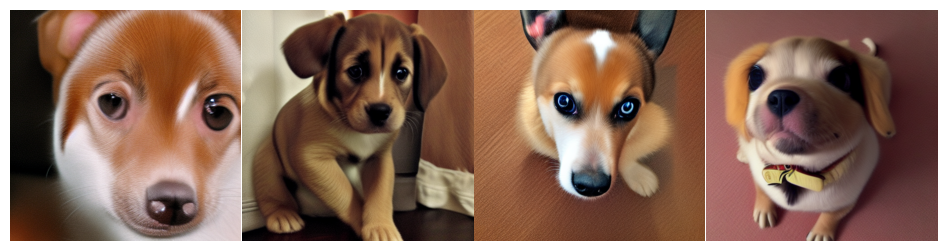

In [20]:
pipe.unet = cm_unet.eval().to(torch.float16)
assert cm_unet.active_adapter == 'ct'

generator = torch.Generator(device="cuda").manual_seed(0)
guidance_scale = 3

# Заменяем генерацию пайплайном на наше сэмплирование.
prompt = "A sad puppy with large eyes"
images = consistency_sampling(       # <YOUR CODE HERE>
    pipe,
    prompt,
    generator=generator,
    guidance_scale=guidance_scale,
)

visualize_images(images)

# Consistency Distillation

## Задание №6


Теперь давайте попробуем перейти к постановке дистилляции, где шаг из $x_t$ в $x_s$ будет делаться не аналитически, а c помощью модели учителя.  

$\mathbf{x}_t = q(\mathbf{x}_t | \mathbf{x}_0)$

$\mathbf{x}_s = DDIM(\epsilon_\theta(\mathbf{x}_t, t), \mathbf{x}_t, t, s)$

**Замечание:**
В text-to-image генерации *classifier-free guidance (CFG)* играет очень важную роль для получения хорошего качества с помощью диффузии.
CFG меняет траектории ODE и раз нам он важен, то давайте и дистиллировать траектории с CFG.

Поэтому для получения точки $\mathbf{x}_{s}$ мы будем использовать шаг учителя с CFG. Это важное отличие от CT сеттинга - там мы не можем моделировать гайденс.

In [21]:
unet = unet.to(torch.float32)
unet.train()
assert unet.dtype == torch.float32

# Добавляем новые LoRA адаптеры для CD модели
cm_unet.add_adapter("cd", lora_config)
cm_unet.set_adapter("cd")

# Пересоздаем оптимизатор
optimizer = torch.optim.AdamW(cm_unet.parameters(), lr=1e-4)

In [22]:
@torch.no_grad()
def get_xs_from_xt_with_teacher(
    x_0, x_t, t, s, # Не все эти аргументы могут быть вам нужны
    scheduler,
    prompt_embeds,
    teacher_unet,
    guidance_scale,
    **kwargs
):
    # может опять засемплить x_t???
    #x_t = q_sample(x_0, t, scheduler)

    # Делаем предсказание учителем в кондишион случае: подаем эмбеды текста
    cond_noise_pred = teacher_unet(x_t, t, encoder_hidden_states=prompt_embeds).sample    # <YOUR CODE HERE>

    # Для CFG нам нужно делать предсказания в unconditional случае.
    # Для T2I моделей, мы будем это моделировать предсказаниями для пустого промпта ""
    # Извлечем эмбеды из пустого промпта и размножить их до размера батча
    uncond_input_ids = pipe.tokenizer(
        [""], return_tensors="pt", padding="max_length", max_length=77
    ).input_ids.to("cuda")

    uncond_prompt_embeds = pipe.text_encoder(uncond_input_ids)[0].expand(
        *prompt_embeds.shape
    )

    # Затем прогоняем модель для пустых промптов
    uncond_noise_pred = teacher_unet(x_t, t, encoder_hidden_states=uncond_prompt_embeds).sample  # <YOUR CODE HERE>

    # Применяем CFG формулу и получаем итоговый предикт учителя
    noise_pred = uncond_noise_pred + guidance_scale * (cond_noise_pred - uncond_noise_pred)      # <YOUR CODE HERE>

    # Получаем x_s из x_t
    x_s = ddim_solver_step(noise_pred, x_t, t, s, scheduler)    # <YOUR CODE HERE>
    return x_s


# Сразу зададим внутрь модель учителя и guidance_scale
get_xs_from_xt_with_teacher = functools.partial(
    get_xs_from_xt_with_teacher,
    teacher_unet=teacher_unet,
    guidance_scale=7.5
)

Еще, как показано в работе [Improved Techniques for Training Consistency Models](https://arxiv.org/pdf/2310.14189).
L2 лосс не самый оптимальный выбор для консистенси моделей.
Давайте в CD обучении также заменим MSE лосс на pseudo-huber лосс из статьи.

In [23]:
def pseudo_huber_loss(
    x: torch.Tensor,
    y: torch.Tensor,
    c=0.001
):
    # c = 0.00054 * math.sqrt(math.prod(input.shape[1:]))
    loss = (torch.sqrt((x - y) ** 2 + c**2) - c).mean()
    return loss

In [24]:
cd_loss = functools.partial(
    cm_loss_template,

    loss_fn=pseudo_huber_loss,
    get_boundary_timesteps=get_zero_boundary_timesteps,
    get_xs_from_xt=get_xs_from_xt_with_teacher
)

assert cm_unet.active_adapter == 'cd'

**Теперь обучим модель в CD режиме**

In [25]:
num_grad_accum = 2 # обновляем параметры каждые 2 шага

train_loop(cm_unet, pipe, train_dataloader, optimizer, cd_loss, num_grad_accum)

  0%|          | 1/625 [00:02<22:12,  2.14s/it]

Loss: 0.040806844830513


  0%|          | 2/625 [00:04<22:29,  2.17s/it]

Loss: 0.023756055161356926


  0%|          | 3/625 [00:06<22:13,  2.14s/it]

Loss: 0.03285204619169235


  1%|          | 4/625 [00:08<22:09,  2.14s/it]

Loss: 0.027884742245078087


  1%|          | 5/625 [00:10<22:02,  2.13s/it]

Loss: 0.028154898434877396


  1%|          | 6/625 [00:12<22:00,  2.13s/it]

Loss: 0.021522415801882744


  1%|          | 7/625 [00:14<21:54,  2.13s/it]

Loss: 0.017159296199679375


  1%|▏         | 8/625 [00:17<21:53,  2.13s/it]

Loss: 0.024743251502513885


  1%|▏         | 9/625 [00:19<21:48,  2.12s/it]

Loss: 0.01888454146683216


  2%|▏         | 10/625 [00:21<22:45,  2.22s/it]

Loss: 0.03667697310447693


  2%|▏         | 11/625 [00:23<22:24,  2.19s/it]

Loss: 0.014977710321545601


  2%|▏         | 12/625 [00:25<22:11,  2.17s/it]

Loss: 0.017870590090751648


  2%|▏         | 13/625 [00:27<21:57,  2.15s/it]

Loss: 0.024895403534173965


  2%|▏         | 14/625 [00:30<21:52,  2.15s/it]

Loss: 0.02119237743318081


  2%|▏         | 15/625 [00:32<21:45,  2.14s/it]

Loss: 0.033570803701877594


  3%|▎         | 16/625 [00:34<21:43,  2.14s/it]

Loss: 0.013548429124057293


  3%|▎         | 17/625 [00:36<21:38,  2.14s/it]

Loss: 0.032972872257232666


  3%|▎         | 18/625 [00:38<21:37,  2.14s/it]

Loss: 0.03498806804418564


  3%|▎         | 19/625 [00:40<21:31,  2.13s/it]

Loss: 0.03482120484113693


  3%|▎         | 20/625 [00:42<21:28,  2.13s/it]

Loss: 0.026760583743453026


  3%|▎         | 21/625 [00:45<21:25,  2.13s/it]

Loss: 0.033657271414995193


  4%|▎         | 22/625 [00:47<21:24,  2.13s/it]

Loss: 0.021896714344620705


  4%|▎         | 23/625 [00:49<21:19,  2.12s/it]

Loss: 0.0228410791605711


  4%|▍         | 24/625 [00:51<21:17,  2.13s/it]

Loss: 0.015630746260285378


  4%|▍         | 25/625 [00:53<21:13,  2.12s/it]

Loss: 0.025828462094068527


  4%|▍         | 26/625 [00:55<21:13,  2.13s/it]

Loss: 0.036325883120298386


  4%|▍         | 27/625 [00:57<21:12,  2.13s/it]

Loss: 0.015098284929990768


  4%|▍         | 28/625 [00:59<21:12,  2.13s/it]

Loss: 0.027317114174365997


  5%|▍         | 29/625 [01:02<21:08,  2.13s/it]

Loss: 0.03195977583527565


  5%|▍         | 30/625 [01:04<21:08,  2.13s/it]

Loss: 0.03089333139359951


  5%|▍         | 31/625 [01:06<21:03,  2.13s/it]

Loss: 0.01551129575818777


  5%|▌         | 32/625 [01:08<21:01,  2.13s/it]

Loss: 0.01751905307173729


  5%|▌         | 33/625 [01:10<20:58,  2.13s/it]

Loss: 0.023998316377401352


  5%|▌         | 34/625 [01:12<20:56,  2.13s/it]

Loss: 0.03194599971175194


  6%|▌         | 35/625 [01:14<20:54,  2.13s/it]

Loss: 0.028429273515939713


  6%|▌         | 36/625 [01:17<21:50,  2.22s/it]

Loss: 0.014089520089328289


  6%|▌         | 37/625 [01:19<21:28,  2.19s/it]

Loss: 0.04125348478555679


  6%|▌         | 38/625 [01:21<21:14,  2.17s/it]

Loss: 0.03275557979941368


  6%|▌         | 39/625 [01:23<21:02,  2.15s/it]

Loss: 0.0189227182418108


  6%|▋         | 40/625 [01:25<20:56,  2.15s/it]

Loss: 0.02925749495625496


  7%|▋         | 41/625 [01:27<20:50,  2.14s/it]

Loss: 0.03945229575037956


  7%|▋         | 42/625 [01:30<20:47,  2.14s/it]

Loss: 0.025029225274920464


  7%|▋         | 43/625 [01:32<20:43,  2.14s/it]

Loss: 0.022745348513126373


  7%|▋         | 44/625 [01:34<20:41,  2.14s/it]

Loss: 0.026992158964276314


  7%|▋         | 45/625 [01:36<20:37,  2.13s/it]

Loss: 0.02375192753970623


  7%|▋         | 46/625 [01:38<20:36,  2.14s/it]

Loss: 0.03268048167228699


  8%|▊         | 47/625 [01:40<20:31,  2.13s/it]

Loss: 0.03753954917192459


  8%|▊         | 48/625 [01:42<20:31,  2.13s/it]

Loss: 0.032779477536678314


  8%|▊         | 49/625 [01:44<20:27,  2.13s/it]

Loss: 0.017329609021544456


  8%|▊         | 50/625 [01:47<20:27,  2.14s/it]

Loss: 0.025678448379039764


  8%|▊         | 51/625 [01:49<20:23,  2.13s/it]

Loss: 0.031508564949035645


  8%|▊         | 52/625 [01:51<20:20,  2.13s/it]

Loss: 0.027909792959690094


  8%|▊         | 53/625 [01:53<20:15,  2.13s/it]

Loss: 0.04040248692035675


  9%|▊         | 54/625 [01:55<20:13,  2.13s/it]

Loss: 0.029308218508958817


  9%|▉         | 55/625 [01:57<20:09,  2.12s/it]

Loss: 0.024541638791561127


  9%|▉         | 56/625 [01:59<20:08,  2.12s/it]

Loss: 0.034814417362213135


  9%|▉         | 57/625 [02:01<20:02,  2.12s/it]

Loss: 0.025905277580022812


  9%|▉         | 58/625 [02:04<20:03,  2.12s/it]

Loss: 0.03802722692489624


  9%|▉         | 59/625 [02:06<19:58,  2.12s/it]

Loss: 0.043424978852272034


 10%|▉         | 60/625 [02:08<19:59,  2.12s/it]

Loss: 0.025090843439102173


 10%|▉         | 61/625 [02:10<19:55,  2.12s/it]

Loss: 0.02648860216140747


 10%|▉         | 62/625 [02:12<20:19,  2.17s/it]

Loss: 0.035890888422727585


 10%|█         | 63/625 [02:14<20:07,  2.15s/it]

Loss: 0.039136797189712524


 10%|█         | 64/625 [02:16<20:03,  2.14s/it]

Loss: 0.02308301255106926


 10%|█         | 65/625 [02:19<19:55,  2.14s/it]

Loss: 0.0520612895488739


 11%|█         | 66/625 [02:21<19:53,  2.14s/it]

Loss: 0.042166028171777725


 11%|█         | 67/625 [02:23<19:47,  2.13s/it]

Loss: 0.03204807639122009


 11%|█         | 68/625 [02:25<19:45,  2.13s/it]

Loss: 0.02595973201096058


 11%|█         | 69/625 [02:27<19:41,  2.12s/it]

Loss: 0.03284637629985809


 11%|█         | 70/625 [02:29<19:40,  2.13s/it]

Loss: 0.024829795584082603


 11%|█▏        | 71/625 [02:31<19:36,  2.12s/it]

Loss: 0.04164411127567291


 12%|█▏        | 72/625 [02:33<19:36,  2.13s/it]

Loss: 0.03506670519709587


 12%|█▏        | 73/625 [02:36<19:33,  2.13s/it]

Loss: 0.04334394261240959


 12%|█▏        | 74/625 [02:38<19:33,  2.13s/it]

Loss: 0.039659325033426285


 12%|█▏        | 75/625 [02:40<19:30,  2.13s/it]

Loss: 0.032468460500240326


 12%|█▏        | 76/625 [02:42<19:29,  2.13s/it]

Loss: 0.036310069262981415


 12%|█▏        | 77/625 [02:44<19:25,  2.13s/it]

Loss: 0.03584878891706467


 12%|█▏        | 78/625 [02:46<19:23,  2.13s/it]

Loss: 0.019255956634879112


 13%|█▎        | 79/625 [02:48<19:19,  2.12s/it]

Loss: 0.056115131825208664


 13%|█▎        | 80/625 [02:50<19:19,  2.13s/it]

Loss: 0.02887190878391266


 13%|█▎        | 81/625 [02:53<19:15,  2.12s/it]

Loss: 0.06760155409574509


 13%|█▎        | 82/625 [02:55<19:15,  2.13s/it]

Loss: 0.05234883725643158


 13%|█▎        | 83/625 [02:57<19:09,  2.12s/it]

Loss: 0.02706720307469368


 13%|█▎        | 84/625 [02:59<19:11,  2.13s/it]

Loss: 0.03979090228676796


 14%|█▎        | 85/625 [03:01<19:06,  2.12s/it]

Loss: 0.05351705476641655


 14%|█▍        | 86/625 [03:03<19:05,  2.13s/it]

Loss: 0.03048805706202984


 14%|█▍        | 87/625 [03:06<19:49,  2.21s/it]

Loss: 0.01671864092350006


 14%|█▍        | 88/625 [03:08<19:35,  2.19s/it]

Loss: 0.06925679743289948


 14%|█▍        | 89/625 [03:10<19:20,  2.16s/it]

Loss: 0.07344330847263336


 14%|█▍        | 90/625 [03:12<19:12,  2.15s/it]

Loss: 0.059979528188705444


 15%|█▍        | 91/625 [03:14<19:04,  2.14s/it]

Loss: 0.024970320984721184


 15%|█▍        | 92/625 [03:16<19:02,  2.14s/it]

Loss: 0.06263773143291473


 15%|█▍        | 93/625 [03:18<18:57,  2.14s/it]

Loss: 0.03408981114625931


 15%|█▌        | 94/625 [03:20<18:56,  2.14s/it]

Loss: 0.025761380791664124


 15%|█▌        | 95/625 [03:23<18:51,  2.14s/it]

Loss: 0.08222649991512299


 15%|█▌        | 96/625 [03:25<18:50,  2.14s/it]

Loss: 0.04179907590150833


 16%|█▌        | 97/625 [03:27<18:46,  2.13s/it]

Loss: 0.052441246807575226


 16%|█▌        | 98/625 [03:29<18:44,  2.13s/it]

Loss: 0.03197355940937996


 16%|█▌        | 99/625 [03:31<18:40,  2.13s/it]

Loss: 0.056459471583366394


 16%|█▌        | 100/625 [03:33<18:40,  2.13s/it]

Loss: 0.030514903366565704


 16%|█▌        | 101/625 [03:35<18:35,  2.13s/it]

Loss: 0.060031041502952576


 16%|█▋        | 102/625 [03:38<18:35,  2.13s/it]

Loss: 0.029850631952285767


 16%|█▋        | 103/625 [03:40<18:30,  2.13s/it]

Loss: 0.027214117348194122


 17%|█▋        | 104/625 [03:42<18:28,  2.13s/it]

Loss: 0.032092418521642685


 17%|█▋        | 105/625 [03:44<18:24,  2.12s/it]

Loss: 0.07333100587129593


 17%|█▋        | 106/625 [03:46<18:24,  2.13s/it]

Loss: 0.04140903800725937


 17%|█▋        | 107/625 [03:48<18:21,  2.13s/it]

Loss: 0.01624266803264618


 17%|█▋        | 108/625 [03:50<18:22,  2.13s/it]

Loss: 0.0730530172586441


 17%|█▋        | 109/625 [03:52<18:18,  2.13s/it]

Loss: 0.050543129444122314


 18%|█▊        | 110/625 [03:55<18:17,  2.13s/it]

Loss: 0.05080422759056091


 18%|█▊        | 111/625 [03:57<18:11,  2.12s/it]

Loss: 0.05591365322470665


 18%|█▊        | 112/625 [03:59<18:13,  2.13s/it]

Loss: 0.06385719031095505


 18%|█▊        | 113/625 [04:01<18:59,  2.23s/it]

Loss: 0.04569704830646515


 18%|█▊        | 114/625 [04:03<18:42,  2.20s/it]

Loss: 0.032027728855609894


 18%|█▊        | 115/625 [04:06<18:29,  2.17s/it]

Loss: 0.06737643480300903


 19%|█▊        | 116/625 [04:08<18:20,  2.16s/it]

Loss: 0.0569969117641449


 19%|█▊        | 117/625 [04:10<18:13,  2.15s/it]

Loss: 0.04183417558670044


 19%|█▉        | 118/625 [04:12<18:09,  2.15s/it]

Loss: 0.07402551174163818


 19%|█▉        | 119/625 [04:14<18:03,  2.14s/it]

Loss: 0.08130015432834625


 19%|█▉        | 120/625 [04:16<18:00,  2.14s/it]

Loss: 0.03079952299594879


 19%|█▉        | 121/625 [04:18<17:56,  2.14s/it]

Loss: 0.03506365790963173


 20%|█▉        | 122/625 [04:20<17:56,  2.14s/it]

Loss: 0.043685708194971085


 20%|█▉        | 123/625 [04:23<17:51,  2.13s/it]

Loss: 0.05852983891963959


 20%|█▉        | 124/625 [04:25<17:48,  2.13s/it]

Loss: 0.05529986321926117


 20%|██        | 125/625 [04:27<17:43,  2.13s/it]

Loss: 0.042126256972551346


 20%|██        | 126/625 [04:29<17:41,  2.13s/it]

Loss: 0.04336784780025482


 20%|██        | 127/625 [04:31<17:37,  2.12s/it]

Loss: 0.04381241649389267


 20%|██        | 128/625 [04:33<17:37,  2.13s/it]

Loss: 0.03261876478791237


 21%|██        | 129/625 [04:35<17:37,  2.13s/it]

Loss: 0.053600870072841644


 21%|██        | 130/625 [04:37<17:34,  2.13s/it]

Loss: 0.07394144684076309


 21%|██        | 131/625 [04:40<17:30,  2.13s/it]

Loss: 0.04202750325202942


 21%|██        | 132/625 [04:42<17:29,  2.13s/it]

Loss: 0.08459804952144623


 21%|██▏       | 133/625 [04:44<17:26,  2.13s/it]

Loss: 0.06968168169260025


 21%|██▏       | 134/625 [04:46<17:27,  2.13s/it]

Loss: 0.025994762778282166


 22%|██▏       | 135/625 [04:48<17:24,  2.13s/it]

Loss: 0.039096567779779434


 22%|██▏       | 136/625 [04:50<17:23,  2.13s/it]

Loss: 0.03069622814655304


 22%|██▏       | 137/625 [04:52<17:20,  2.13s/it]

Loss: 0.07660820335149765


 22%|██▏       | 138/625 [04:55<17:18,  2.13s/it]

Loss: 0.03788744658231735


 22%|██▏       | 139/625 [04:57<17:13,  2.13s/it]

Loss: 0.021575719118118286


 22%|██▏       | 140/625 [04:59<17:53,  2.21s/it]

Loss: 0.03438914194703102


 23%|██▎       | 141/625 [05:01<17:36,  2.18s/it]

Loss: 0.062124818563461304


 23%|██▎       | 142/625 [05:03<17:28,  2.17s/it]

Loss: 0.048835910856723785


 23%|██▎       | 143/625 [05:05<17:19,  2.16s/it]

Loss: 0.03040812537074089


 23%|██▎       | 144/625 [05:08<17:13,  2.15s/it]

Loss: 0.07184873521327972


 23%|██▎       | 145/625 [05:10<17:06,  2.14s/it]

Loss: 0.02250102534890175


 23%|██▎       | 146/625 [05:12<17:03,  2.14s/it]

Loss: 0.06862987577915192


 24%|██▎       | 147/625 [05:14<16:57,  2.13s/it]

Loss: 0.034418247640132904


 24%|██▎       | 148/625 [05:16<16:55,  2.13s/it]

Loss: 0.037941835820674896


 24%|██▍       | 149/625 [05:18<16:49,  2.12s/it]

Loss: 0.04468408599495888


 24%|██▍       | 150/625 [05:20<16:50,  2.13s/it]

Loss: 0.06541872024536133


 24%|██▍       | 151/625 [05:22<16:48,  2.13s/it]

Loss: 0.03821779042482376


 24%|██▍       | 152/625 [05:25<16:48,  2.13s/it]

Loss: 0.05036117136478424


 24%|██▍       | 153/625 [05:27<16:45,  2.13s/it]

Loss: 0.02708951011300087


 25%|██▍       | 154/625 [05:29<16:45,  2.14s/it]

Loss: 0.03724880516529083


 25%|██▍       | 155/625 [05:31<16:40,  2.13s/it]

Loss: 0.033212944865226746


 25%|██▍       | 156/625 [05:33<16:40,  2.13s/it]

Loss: 0.034457962960004807


 25%|██▌       | 157/625 [05:35<16:36,  2.13s/it]

Loss: 0.05291997268795967


 25%|██▌       | 158/625 [05:37<16:35,  2.13s/it]

Loss: 0.0353289358317852


 25%|██▌       | 159/625 [05:39<16:33,  2.13s/it]

Loss: 0.0662672221660614


 26%|██▌       | 160/625 [05:42<16:32,  2.13s/it]

Loss: 0.05336698144674301


 26%|██▌       | 161/625 [05:44<16:28,  2.13s/it]

Loss: 0.06323841959238052


 26%|██▌       | 162/625 [05:46<16:28,  2.13s/it]

Loss: 0.03757384419441223


 26%|██▌       | 163/625 [05:48<16:25,  2.13s/it]

Loss: 0.026552284136414528


 26%|██▌       | 164/625 [05:50<16:24,  2.14s/it]

Loss: 0.04452713951468468


 26%|██▋       | 165/625 [05:52<16:21,  2.13s/it]

Loss: 0.04388410598039627


 27%|██▋       | 166/625 [05:55<17:01,  2.23s/it]

Loss: 0.061898358166217804


 27%|██▋       | 167/625 [05:57<16:44,  2.19s/it]

Loss: 0.0325511135160923


 27%|██▋       | 168/625 [05:59<16:34,  2.18s/it]

Loss: 0.0714377909898758


 27%|██▋       | 169/625 [06:01<16:23,  2.16s/it]

Loss: 0.03038468211889267


 27%|██▋       | 170/625 [06:03<16:17,  2.15s/it]

Loss: 0.07307061553001404


 27%|██▋       | 171/625 [06:05<16:11,  2.14s/it]

Loss: 0.022770289331674576


 28%|██▊       | 172/625 [06:07<16:08,  2.14s/it]

Loss: 0.06159219518303871


 28%|██▊       | 173/625 [06:10<16:02,  2.13s/it]

Loss: 0.03452427685260773


 28%|██▊       | 174/625 [06:12<16:00,  2.13s/it]

Loss: 0.041055865585803986


 28%|██▊       | 175/625 [06:14<15:56,  2.13s/it]

Loss: 0.060986727476119995


 28%|██▊       | 176/625 [06:16<15:55,  2.13s/it]

Loss: 0.022051943466067314


 28%|██▊       | 177/625 [06:18<15:52,  2.13s/it]

Loss: 0.03230801969766617


 28%|██▊       | 178/625 [06:20<15:51,  2.13s/it]

Loss: 0.024944402277469635


 29%|██▊       | 179/625 [06:22<15:48,  2.13s/it]

Loss: 0.07699930667877197


 29%|██▉       | 180/625 [06:24<15:47,  2.13s/it]

Loss: 0.04859418421983719


 29%|██▉       | 181/625 [06:27<15:43,  2.12s/it]

Loss: 0.03335727006196976


 29%|██▉       | 182/625 [06:29<15:43,  2.13s/it]

Loss: 0.03937496989965439


 29%|██▉       | 183/625 [06:31<15:39,  2.13s/it]

Loss: 0.040426939725875854


 29%|██▉       | 184/625 [06:33<15:39,  2.13s/it]

Loss: 0.058621082454919815


 30%|██▉       | 185/625 [06:35<15:36,  2.13s/it]

Loss: 0.017090409994125366


 30%|██▉       | 186/625 [06:37<15:35,  2.13s/it]

Loss: 0.04874827712774277


 30%|██▉       | 187/625 [06:39<15:31,  2.13s/it]

Loss: 0.02858840301632881


 30%|███       | 188/625 [06:41<15:31,  2.13s/it]

Loss: 0.03897522762417793


 30%|███       | 189/625 [06:44<15:27,  2.13s/it]

Loss: 0.03328554332256317


 30%|███       | 190/625 [06:46<15:26,  2.13s/it]

Loss: 0.05357559025287628


 31%|███       | 191/625 [06:48<15:22,  2.12s/it]

Loss: 0.03158365562558174


 31%|███       | 192/625 [06:50<15:21,  2.13s/it]

Loss: 0.04185580834746361


 31%|███       | 193/625 [06:52<15:53,  2.21s/it]

Loss: 0.06089954823255539


 31%|███       | 194/625 [06:55<15:41,  2.18s/it]

Loss: 0.06478175520896912


 31%|███       | 195/625 [06:57<15:30,  2.16s/it]

Loss: 0.03960185870528221


 31%|███▏      | 196/625 [06:59<15:23,  2.15s/it]

Loss: 0.04591146856546402


 32%|███▏      | 197/625 [07:01<15:16,  2.14s/it]

Loss: 0.04495386779308319


 32%|███▏      | 198/625 [07:03<15:14,  2.14s/it]

Loss: 0.041464876383543015


 32%|███▏      | 199/625 [07:05<15:09,  2.13s/it]

Loss: 0.024987775832414627


 32%|███▏      | 200/625 [07:07<15:07,  2.13s/it]

Loss: 0.07957692444324493


 32%|███▏      | 201/625 [07:09<15:03,  2.13s/it]

Loss: 0.04760575294494629


 32%|███▏      | 202/625 [07:12<15:01,  2.13s/it]

Loss: 0.05119309946894646


 32%|███▏      | 203/625 [07:14<14:57,  2.13s/it]

Loss: 0.05229291692376137


 33%|███▎      | 204/625 [07:16<14:56,  2.13s/it]

Loss: 0.027110561728477478


 33%|███▎      | 205/625 [07:18<14:51,  2.12s/it]

Loss: 0.03161057084798813


 33%|███▎      | 206/625 [07:20<14:51,  2.13s/it]

Loss: 0.030703794211149216


 33%|███▎      | 207/625 [07:22<14:48,  2.13s/it]

Loss: 0.05720285698771477


 33%|███▎      | 208/625 [07:24<14:48,  2.13s/it]

Loss: 0.07206851989030838


 33%|███▎      | 209/625 [07:26<14:44,  2.13s/it]

Loss: 0.09350431710481644


 34%|███▎      | 210/625 [07:29<14:42,  2.13s/it]

Loss: 0.04649430885910988


 34%|███▍      | 211/625 [07:31<14:39,  2.13s/it]

Loss: 0.05744316056370735


 34%|███▍      | 212/625 [07:33<14:40,  2.13s/it]

Loss: 0.03392694145441055


 34%|███▍      | 213/625 [07:35<14:35,  2.13s/it]

Loss: 0.060020752251148224


 34%|███▍      | 214/625 [07:37<14:34,  2.13s/it]

Loss: 0.058391861617565155


 34%|███▍      | 215/625 [07:39<14:31,  2.12s/it]

Loss: 0.07283210754394531


 35%|███▍      | 216/625 [07:41<14:29,  2.13s/it]

Loss: 0.044931523501873016


 35%|███▍      | 217/625 [07:43<14:26,  2.12s/it]

Loss: 0.05865168571472168


 35%|███▍      | 218/625 [07:46<14:26,  2.13s/it]

Loss: 0.04784436151385307


 35%|███▌      | 219/625 [07:48<14:24,  2.13s/it]

Loss: 0.035836413502693176


 35%|███▌      | 220/625 [07:50<14:23,  2.13s/it]

Loss: 0.04530436545610428


 35%|███▌      | 221/625 [07:52<14:57,  2.22s/it]

Loss: 0.060348980128765106


 36%|███▌      | 222/625 [07:54<14:44,  2.20s/it]

Loss: 0.038815997540950775


 36%|███▌      | 223/625 [07:56<14:32,  2.17s/it]

Loss: 0.036414433270692825


 36%|███▌      | 224/625 [07:59<14:25,  2.16s/it]

Loss: 0.041307926177978516


 36%|███▌      | 225/625 [08:01<14:18,  2.15s/it]

Loss: 0.04134167358279228


 36%|███▌      | 226/625 [08:03<14:13,  2.14s/it]

Loss: 0.04904280602931976


 36%|███▋      | 227/625 [08:05<14:08,  2.13s/it]

Loss: 0.054107509553432465


 36%|███▋      | 228/625 [08:07<14:05,  2.13s/it]

Loss: 0.032984763383865356


 37%|███▋      | 229/625 [08:09<14:01,  2.12s/it]

Loss: 0.04577859491109848


 37%|███▋      | 230/625 [08:11<13:59,  2.12s/it]

Loss: 0.03667077422142029


 37%|███▋      | 231/625 [08:13<13:55,  2.12s/it]

Loss: 0.06758835911750793


 37%|███▋      | 232/625 [08:16<13:56,  2.13s/it]

Loss: 0.05592944473028183


 37%|███▋      | 233/625 [08:18<13:53,  2.13s/it]

Loss: 0.06258721649646759


 37%|███▋      | 234/625 [08:20<13:51,  2.13s/it]

Loss: 0.063013955950737


 38%|███▊      | 235/625 [08:22<13:48,  2.13s/it]

Loss: 0.06481477618217468


 38%|███▊      | 236/625 [08:24<13:47,  2.13s/it]

Loss: 0.03440047428011894


 38%|███▊      | 237/625 [08:26<13:44,  2.13s/it]

Loss: 0.015304610133171082


 38%|███▊      | 238/625 [08:28<13:44,  2.13s/it]

Loss: 0.048084892332553864


 38%|███▊      | 239/625 [08:30<13:41,  2.13s/it]

Loss: 0.05583277344703674


 38%|███▊      | 240/625 [08:33<13:40,  2.13s/it]

Loss: 0.022319696843624115


 39%|███▊      | 241/625 [08:35<13:37,  2.13s/it]

Loss: 0.07098746299743652


 39%|███▊      | 242/625 [08:37<13:36,  2.13s/it]

Loss: 0.03656703233718872


 39%|███▉      | 243/625 [08:39<13:33,  2.13s/it]

Loss: 0.04223579168319702


 39%|███▉      | 244/625 [08:41<13:32,  2.13s/it]

Loss: 0.033706724643707275


 39%|███▉      | 245/625 [08:43<13:29,  2.13s/it]

Loss: 0.03821144253015518


 39%|███▉      | 246/625 [08:46<13:59,  2.21s/it]

Loss: 0.07364533096551895


 40%|███▉      | 247/625 [08:48<13:45,  2.18s/it]

Loss: 0.048852816224098206


 40%|███▉      | 248/625 [08:50<13:37,  2.17s/it]

Loss: 0.04380621761083603


 40%|███▉      | 249/625 [08:52<13:29,  2.15s/it]

Loss: 0.036208756268024445


 40%|████      | 250/625 [08:54<13:24,  2.15s/it]

Loss: 0.028293302282691002


 40%|████      | 251/625 [08:56<13:19,  2.14s/it]

Loss: 0.05632844567298889


 40%|████      | 252/625 [08:58<13:17,  2.14s/it]

Loss: 0.047384344041347504


 40%|████      | 253/625 [09:01<13:12,  2.13s/it]

Loss: 0.03279127925634384


 41%|████      | 254/625 [09:03<13:11,  2.13s/it]

Loss: 0.04635190963745117


 41%|████      | 255/625 [09:05<13:07,  2.13s/it]

Loss: 0.09814061224460602


 41%|████      | 256/625 [09:07<13:06,  2.13s/it]

Loss: 0.07787445932626724


 41%|████      | 257/625 [09:09<13:03,  2.13s/it]

Loss: 0.04391387477517128


 41%|████▏     | 258/625 [09:11<13:01,  2.13s/it]

Loss: 0.04305354505777359


 41%|████▏     | 259/625 [09:13<13:00,  2.13s/it]

Loss: 0.08463163673877716


 42%|████▏     | 260/625 [09:15<12:58,  2.13s/it]

Loss: 0.03673917427659035


 42%|████▏     | 261/625 [09:18<12:54,  2.13s/it]

Loss: 0.027455074712634087


 42%|████▏     | 262/625 [09:20<12:54,  2.13s/it]

Loss: 0.0615881122648716


 42%|████▏     | 263/625 [09:22<12:51,  2.13s/it]

Loss: 0.035277847200632095


 42%|████▏     | 264/625 [09:24<12:50,  2.13s/it]

Loss: 0.049351535737514496


 42%|████▏     | 265/625 [09:26<12:45,  2.13s/it]

Loss: 0.04579188674688339


 43%|████▎     | 266/625 [09:28<12:44,  2.13s/it]

Loss: 0.0276164747774601


 43%|████▎     | 267/625 [09:30<12:41,  2.13s/it]

Loss: 0.05325371399521828


 43%|████▎     | 268/625 [09:33<12:40,  2.13s/it]

Loss: 0.016042247414588928


 43%|████▎     | 269/625 [09:35<12:38,  2.13s/it]

Loss: 0.05610419064760208


 43%|████▎     | 270/625 [09:37<12:36,  2.13s/it]

Loss: 0.05170407146215439


 43%|████▎     | 271/625 [09:39<12:34,  2.13s/it]

Loss: 0.03166722506284714


 44%|████▎     | 272/625 [09:41<12:32,  2.13s/it]

Loss: 0.03321591392159462


 44%|████▎     | 273/625 [09:43<13:03,  2.23s/it]

Loss: 0.0450582392513752


 44%|████▍     | 274/625 [09:46<12:51,  2.20s/it]

Loss: 0.04320060461759567


 44%|████▍     | 275/625 [09:48<12:40,  2.17s/it]

Loss: 0.06370750069618225


 44%|████▍     | 276/625 [09:50<12:35,  2.16s/it]

Loss: 0.039147987961769104


 44%|████▍     | 277/625 [09:52<12:29,  2.15s/it]

Loss: 0.03524426370859146


 44%|████▍     | 278/625 [09:54<12:25,  2.15s/it]

Loss: 0.07382483780384064


 45%|████▍     | 279/625 [09:56<12:19,  2.14s/it]

Loss: 0.04636559635400772


 45%|████▍     | 280/625 [09:58<12:16,  2.13s/it]

Loss: 0.088002510368824


 45%|████▍     | 281/625 [10:00<12:11,  2.13s/it]

Loss: 0.06347432732582092


 45%|████▌     | 282/625 [10:03<12:10,  2.13s/it]

Loss: 0.05087786167860031


 45%|████▌     | 283/625 [10:05<12:07,  2.13s/it]

Loss: 0.03910441696643829


 45%|████▌     | 284/625 [10:07<12:05,  2.13s/it]

Loss: 0.047677747905254364


 46%|████▌     | 285/625 [10:09<12:01,  2.12s/it]

Loss: 0.03978969156742096


 46%|████▌     | 286/625 [10:11<11:59,  2.12s/it]

Loss: 0.06075134128332138


 46%|████▌     | 287/625 [10:13<11:56,  2.12s/it]

Loss: 0.03483233228325844


 46%|████▌     | 288/625 [10:15<11:55,  2.12s/it]

Loss: 0.05558718368411064


 46%|████▌     | 289/625 [10:17<11:52,  2.12s/it]

Loss: 0.040190353989601135


 46%|████▋     | 290/625 [10:20<11:52,  2.13s/it]

Loss: 0.061135176569223404


 47%|████▋     | 291/625 [10:22<11:50,  2.13s/it]

Loss: 0.10354211181402206


 47%|████▋     | 292/625 [10:24<11:48,  2.13s/it]

Loss: 0.06707405298948288


 47%|████▋     | 293/625 [10:26<11:45,  2.13s/it]

Loss: 0.043294522911310196


 47%|████▋     | 294/625 [10:28<11:45,  2.13s/it]

Loss: 0.044728074222803116


 47%|████▋     | 295/625 [10:30<11:41,  2.13s/it]

Loss: 0.030397091060876846


 47%|████▋     | 296/625 [10:32<11:41,  2.13s/it]

Loss: 0.04277355223894119


 48%|████▊     | 297/625 [10:35<11:37,  2.13s/it]

Loss: 0.0564320832490921


 48%|████▊     | 298/625 [10:37<11:36,  2.13s/it]

Loss: 0.04631679877638817


 48%|████▊     | 299/625 [10:39<11:32,  2.12s/it]

Loss: 0.056692175567150116


 48%|████▊     | 300/625 [10:41<12:03,  2.23s/it]

Loss: 0.030094051733613014


 48%|████▊     | 301/625 [10:43<11:50,  2.19s/it]

Loss: 0.06719231605529785


 48%|████▊     | 302/625 [10:45<11:42,  2.17s/it]

Loss: 0.05291121453046799


 48%|████▊     | 303/625 [10:48<11:34,  2.16s/it]

Loss: 0.04556959122419357


 49%|████▊     | 304/625 [10:50<11:29,  2.15s/it]

Loss: 0.04885596036911011


 49%|████▉     | 305/625 [10:52<11:23,  2.14s/it]

Loss: 0.04986853152513504


 49%|████▉     | 306/625 [10:54<11:21,  2.14s/it]

Loss: 0.043922871351242065


 49%|████▉     | 307/625 [10:56<11:18,  2.13s/it]

Loss: 0.055347736924886703


 49%|████▉     | 308/625 [10:58<11:17,  2.14s/it]

Loss: 0.0562007911503315


 49%|████▉     | 309/625 [11:00<11:13,  2.13s/it]

Loss: 0.06961970776319504


 50%|████▉     | 310/625 [11:02<11:11,  2.13s/it]

Loss: 0.04542607069015503


 50%|████▉     | 311/625 [11:05<11:08,  2.13s/it]

Loss: 0.033887915313243866


 50%|████▉     | 312/625 [11:07<11:05,  2.13s/it]

Loss: 0.04039404168725014


 50%|█████     | 313/625 [11:09<11:02,  2.12s/it]

Loss: 0.05826210603117943


 50%|█████     | 314/625 [11:11<11:01,  2.13s/it]

Loss: 0.048863351345062256


 50%|█████     | 315/625 [11:13<10:59,  2.13s/it]

Loss: 0.04690883308649063


 51%|█████     | 316/625 [11:15<10:58,  2.13s/it]

Loss: 0.02989555150270462


 51%|█████     | 317/625 [11:17<10:55,  2.13s/it]

Loss: 0.03896868973970413


 51%|█████     | 318/625 [11:19<10:54,  2.13s/it]

Loss: 0.04330538958311081


 51%|█████     | 319/625 [11:22<10:50,  2.13s/it]

Loss: 0.02891858108341694


 51%|█████     | 320/625 [11:24<10:49,  2.13s/it]

Loss: 0.033199165016412735


 51%|█████▏    | 321/625 [11:26<10:46,  2.13s/it]

Loss: 0.0517626628279686


 52%|█████▏    | 322/625 [11:28<10:45,  2.13s/it]

Loss: 0.07141544669866562


 52%|█████▏    | 323/625 [11:30<10:42,  2.13s/it]

Loss: 0.03356277197599411


 52%|█████▏    | 324/625 [11:32<10:40,  2.13s/it]

Loss: 0.07037223130464554


 52%|█████▏    | 325/625 [11:35<11:03,  2.21s/it]

Loss: 0.050701528787612915


 52%|█████▏    | 326/625 [11:37<10:55,  2.19s/it]

Loss: 0.03858140856027603


 52%|█████▏    | 327/625 [11:39<10:47,  2.17s/it]

Loss: 0.029222823679447174


 52%|█████▏    | 328/625 [11:41<10:42,  2.16s/it]

Loss: 0.02556743659079075


 53%|█████▎    | 329/625 [11:43<10:37,  2.15s/it]

Loss: 0.04489206522703171


 53%|█████▎    | 330/625 [11:45<10:33,  2.15s/it]

Loss: 0.03751687332987785


 53%|█████▎    | 331/625 [11:47<10:29,  2.14s/it]

Loss: 0.0691511482000351


 53%|█████▎    | 332/625 [11:50<10:25,  2.14s/it]

Loss: 0.03714962303638458


 53%|█████▎    | 333/625 [11:52<10:22,  2.13s/it]

Loss: 0.04633556678891182


 53%|█████▎    | 334/625 [11:54<10:21,  2.14s/it]

Loss: 0.06507350504398346


 54%|█████▎    | 335/625 [11:56<10:18,  2.13s/it]

Loss: 0.07926197350025177


 54%|█████▍    | 336/625 [11:58<10:16,  2.13s/it]

Loss: 0.024219876155257225


 54%|█████▍    | 337/625 [12:00<10:14,  2.13s/it]

Loss: 0.03472571820020676


 54%|█████▍    | 338/625 [12:02<10:11,  2.13s/it]

Loss: 0.035297833383083344


 54%|█████▍    | 339/625 [12:04<10:07,  2.12s/it]

Loss: 0.053268466144800186


 54%|█████▍    | 340/625 [12:07<10:05,  2.13s/it]

Loss: 0.038114555180072784


 55%|█████▍    | 341/625 [12:09<10:02,  2.12s/it]

Loss: 0.031888000667095184


 55%|█████▍    | 342/625 [12:11<10:02,  2.13s/it]

Loss: 0.03024396486580372


 55%|█████▍    | 343/625 [12:13<09:59,  2.13s/it]

Loss: 0.07654262334108353


 55%|█████▌    | 344/625 [12:15<09:57,  2.13s/it]

Loss: 0.05648636817932129


 55%|█████▌    | 345/625 [12:17<09:54,  2.12s/it]

Loss: 0.06406774371862411


 55%|█████▌    | 346/625 [12:19<09:52,  2.12s/it]

Loss: 0.042173728346824646


 56%|█████▌    | 347/625 [12:21<09:50,  2.12s/it]

Loss: 0.026797553524374962


 56%|█████▌    | 348/625 [12:24<09:49,  2.13s/it]

Loss: 0.06474335491657257


 56%|█████▌    | 349/625 [12:26<09:46,  2.13s/it]

Loss: 0.04137730225920677


 56%|█████▌    | 350/625 [12:28<09:45,  2.13s/it]

Loss: 0.04249034449458122


 56%|█████▌    | 351/625 [12:30<09:42,  2.13s/it]

Loss: 0.03296519070863724


 56%|█████▋    | 352/625 [12:32<10:08,  2.23s/it]

Loss: 0.046859897673130035


 56%|█████▋    | 353/625 [12:35<09:57,  2.19s/it]

Loss: 0.022462699562311172


 57%|█████▋    | 354/625 [12:37<09:50,  2.18s/it]

Loss: 0.027659576386213303


 57%|█████▋    | 355/625 [12:39<09:43,  2.16s/it]

Loss: 0.07911437749862671


 57%|█████▋    | 356/625 [12:41<09:39,  2.15s/it]

Loss: 0.0412081778049469


 57%|█████▋    | 357/625 [12:43<09:33,  2.14s/it]

Loss: 0.0512763150036335


 57%|█████▋    | 358/625 [12:45<09:31,  2.14s/it]

Loss: 0.05390921235084534


 57%|█████▋    | 359/625 [12:47<09:27,  2.13s/it]

Loss: 0.04351666569709778


 58%|█████▊    | 360/625 [12:49<09:26,  2.14s/it]

Loss: 0.03634373098611832


 58%|█████▊    | 361/625 [12:52<09:23,  2.13s/it]

Loss: 0.0734015479683876


 58%|█████▊    | 362/625 [12:54<09:21,  2.14s/it]

Loss: 0.029576947912573814


 58%|█████▊    | 363/625 [12:56<09:18,  2.13s/it]

Loss: 0.0479297861456871


 58%|█████▊    | 364/625 [12:58<09:15,  2.13s/it]

Loss: 0.033397503197193146


 58%|█████▊    | 365/625 [13:00<09:12,  2.12s/it]

Loss: 0.03351619094610214


 59%|█████▊    | 366/625 [13:02<09:10,  2.12s/it]

Loss: 0.05401865765452385


 59%|█████▊    | 367/625 [13:04<09:06,  2.12s/it]

Loss: 0.0466962568461895


 59%|█████▉    | 368/625 [13:06<09:05,  2.12s/it]

Loss: 0.038595594465732574


 59%|█████▉    | 369/625 [13:09<09:02,  2.12s/it]

Loss: 0.04743339866399765


 59%|█████▉    | 370/625 [13:11<09:02,  2.13s/it]

Loss: 0.050575658679008484


 59%|█████▉    | 371/625 [13:13<08:59,  2.12s/it]

Loss: 0.06034551560878754


 60%|█████▉    | 372/625 [13:15<08:57,  2.13s/it]

Loss: 0.06426821649074554


 60%|█████▉    | 373/625 [13:17<08:54,  2.12s/it]

Loss: 0.05129358917474747


 60%|█████▉    | 374/625 [13:19<08:53,  2.12s/it]

Loss: 0.035003360360860825


 60%|██████    | 375/625 [13:21<08:50,  2.12s/it]

Loss: 0.028463758528232574


 60%|██████    | 376/625 [13:23<08:50,  2.13s/it]

Loss: 0.056912973523139954


 60%|██████    | 377/625 [13:26<08:47,  2.13s/it]

Loss: 0.04565758630633354


 60%|██████    | 378/625 [13:28<08:46,  2.13s/it]

Loss: 0.06754492968320847


 61%|██████    | 379/625 [13:30<09:07,  2.23s/it]

Loss: 0.05528797581791878


 61%|██████    | 380/625 [13:32<08:59,  2.20s/it]

Loss: 0.04352787137031555


 61%|██████    | 381/625 [13:34<08:51,  2.18s/it]

Loss: 0.0338856466114521


 61%|██████    | 382/625 [13:37<08:46,  2.17s/it]

Loss: 0.04058516025543213


 61%|██████▏   | 383/625 [13:39<08:40,  2.15s/it]

Loss: 0.0308203287422657


 61%|██████▏   | 384/625 [13:41<08:37,  2.15s/it]

Loss: 0.06501135230064392


 62%|██████▏   | 385/625 [13:43<08:33,  2.14s/it]

Loss: 0.026018038392066956


 62%|██████▏   | 386/625 [13:45<08:31,  2.14s/it]

Loss: 0.06211221590638161


 62%|██████▏   | 387/625 [13:47<08:27,  2.13s/it]

Loss: 0.03999193012714386


 62%|██████▏   | 388/625 [13:49<08:25,  2.13s/it]

Loss: 0.03575379401445389


 62%|██████▏   | 389/625 [13:51<08:21,  2.13s/it]

Loss: 0.031220993027091026


 62%|██████▏   | 390/625 [13:54<08:20,  2.13s/it]

Loss: 0.040119826793670654


 63%|██████▎   | 391/625 [13:56<08:17,  2.12s/it]

Loss: 0.044147562235593796


 63%|██████▎   | 392/625 [13:58<08:15,  2.13s/it]

Loss: 0.063783660531044


 63%|██████▎   | 393/625 [14:00<08:12,  2.12s/it]

Loss: 0.045287683606147766


 63%|██████▎   | 394/625 [14:02<08:11,  2.13s/it]

Loss: 0.046016328036785126


 63%|██████▎   | 395/625 [14:04<08:08,  2.12s/it]

Loss: 0.04283053055405617


 63%|██████▎   | 396/625 [14:06<08:06,  2.12s/it]

Loss: 0.04162045568227768


 64%|██████▎   | 397/625 [14:08<08:03,  2.12s/it]

Loss: 0.052517712116241455


 64%|██████▎   | 398/625 [14:11<08:02,  2.13s/it]

Loss: 0.054478876292705536


 64%|██████▍   | 399/625 [14:13<07:59,  2.12s/it]

Loss: 0.03883804380893707


 64%|██████▍   | 400/625 [14:15<07:58,  2.13s/it]

Loss: 0.03718904033303261


 64%|██████▍   | 401/625 [14:17<07:56,  2.13s/it]

Loss: 0.02810903824865818


 64%|██████▍   | 402/625 [14:19<07:54,  2.13s/it]

Loss: 0.029100634157657623


 64%|██████▍   | 403/625 [14:21<07:51,  2.12s/it]

Loss: 0.04524703323841095


 65%|██████▍   | 404/625 [14:23<07:49,  2.13s/it]

Loss: 0.044689521193504333


 65%|██████▍   | 405/625 [14:26<08:08,  2.22s/it]

Loss: 0.024316072463989258


 65%|██████▍   | 406/625 [14:28<08:01,  2.20s/it]

Loss: 0.05438700690865517


 65%|██████▌   | 407/625 [14:30<07:54,  2.18s/it]

Loss: 0.030827349051833153


 65%|██████▌   | 408/625 [14:32<07:50,  2.17s/it]

Loss: 0.06996709853410721


 65%|██████▌   | 409/625 [14:34<07:44,  2.15s/it]

Loss: 0.04338980093598366


 66%|██████▌   | 410/625 [14:36<07:41,  2.15s/it]

Loss: 0.032593511044979095


 66%|██████▌   | 411/625 [14:39<07:37,  2.14s/it]

Loss: 0.0443100668489933


 66%|██████▌   | 412/625 [14:41<07:34,  2.14s/it]

Loss: 0.03510403633117676


 66%|██████▌   | 413/625 [14:43<07:31,  2.13s/it]

Loss: 0.011258717626333237


 66%|██████▌   | 414/625 [14:45<07:29,  2.13s/it]

Loss: 0.03281131014227867


 66%|██████▋   | 415/625 [14:47<07:26,  2.13s/it]

Loss: 0.04385627806186676


 67%|██████▋   | 416/625 [14:49<07:24,  2.13s/it]

Loss: 0.09102016687393188


 67%|██████▋   | 417/625 [14:51<07:21,  2.12s/it]

Loss: 0.07978525012731552


 67%|██████▋   | 418/625 [14:53<07:19,  2.12s/it]

Loss: 0.05121135711669922


 67%|██████▋   | 419/625 [14:56<07:17,  2.12s/it]

Loss: 0.016654571518301964


 67%|██████▋   | 420/625 [14:58<07:15,  2.12s/it]

Loss: 0.0595097690820694


 67%|██████▋   | 421/625 [15:00<07:12,  2.12s/it]

Loss: 0.03664226457476616


 68%|██████▊   | 422/625 [15:02<07:11,  2.13s/it]

Loss: 0.04142577946186066


 68%|██████▊   | 423/625 [15:04<07:08,  2.12s/it]

Loss: 0.024937640875577927


 68%|██████▊   | 424/625 [15:06<07:06,  2.12s/it]

Loss: 0.04266166687011719


 68%|██████▊   | 425/625 [15:08<07:04,  2.12s/it]

Loss: 0.04549315571784973


 68%|██████▊   | 426/625 [15:10<07:02,  2.13s/it]

Loss: 0.03751853480935097


 68%|██████▊   | 427/625 [15:13<07:00,  2.12s/it]

Loss: 0.031314313411712646


 68%|██████▊   | 428/625 [15:15<06:59,  2.13s/it]

Loss: 0.016180023550987244


 69%|██████▊   | 429/625 [15:17<06:56,  2.13s/it]

Loss: 0.053986795246601105


 69%|██████▉   | 430/625 [15:19<06:54,  2.13s/it]

Loss: 0.046008750796318054


 69%|██████▉   | 431/625 [15:21<07:08,  2.21s/it]

Loss: 0.042487263679504395


 69%|██████▉   | 432/625 [15:23<07:01,  2.19s/it]

Loss: 0.03263310343027115


 69%|██████▉   | 433/625 [15:26<06:56,  2.17s/it]

Loss: 0.02386675402522087


 69%|██████▉   | 434/625 [15:28<06:51,  2.15s/it]

Loss: 0.04656166583299637


 70%|██████▉   | 435/625 [15:30<06:47,  2.14s/it]

Loss: 0.05441392958164215


 70%|██████▉   | 436/625 [15:32<06:44,  2.14s/it]

Loss: 0.05036686360836029


 70%|██████▉   | 437/625 [15:34<06:40,  2.13s/it]

Loss: 0.04113328456878662


 70%|███████   | 438/625 [15:36<06:39,  2.13s/it]

Loss: 0.03852773457765579


 70%|███████   | 439/625 [15:38<06:35,  2.13s/it]

Loss: 0.05232397839426994


 70%|███████   | 440/625 [15:40<06:33,  2.13s/it]

Loss: 0.034813739359378815


 71%|███████   | 441/625 [15:43<06:31,  2.13s/it]

Loss: 0.029531609266996384


 71%|███████   | 442/625 [15:45<06:29,  2.13s/it]

Loss: 0.05366407707333565


 71%|███████   | 443/625 [15:47<06:26,  2.12s/it]

Loss: 0.04582780972123146


 71%|███████   | 444/625 [15:49<06:24,  2.12s/it]

Loss: 0.03310798108577728


 71%|███████   | 445/625 [15:51<06:22,  2.12s/it]

Loss: 0.05531200021505356


 71%|███████▏  | 446/625 [15:53<06:20,  2.12s/it]

Loss: 0.04874084144830704


 72%|███████▏  | 447/625 [15:55<06:17,  2.12s/it]

Loss: 0.05562883988022804


 72%|███████▏  | 448/625 [15:57<06:16,  2.13s/it]

Loss: 0.05197363346815109


 72%|███████▏  | 449/625 [16:00<06:14,  2.13s/it]

Loss: 0.0527990460395813


 72%|███████▏  | 450/625 [16:02<06:12,  2.13s/it]

Loss: 0.038869261741638184


 72%|███████▏  | 451/625 [16:04<06:09,  2.13s/it]

Loss: 0.03740214556455612


 72%|███████▏  | 452/625 [16:06<06:08,  2.13s/it]

Loss: 0.05078394338488579


 72%|███████▏  | 453/625 [16:08<06:06,  2.13s/it]

Loss: 0.0745590478181839


 73%|███████▎  | 454/625 [16:10<06:04,  2.13s/it]

Loss: 0.03215489536523819


 73%|███████▎  | 455/625 [16:12<06:02,  2.13s/it]

Loss: 0.040240656584501266


 73%|███████▎  | 456/625 [16:15<06:00,  2.13s/it]

Loss: 0.035486143082380295


 73%|███████▎  | 457/625 [16:17<05:57,  2.13s/it]

Loss: 0.04484333470463753


 73%|███████▎  | 458/625 [16:19<05:55,  2.13s/it]

Loss: 0.040854062885046005


 73%|███████▎  | 459/625 [16:21<06:09,  2.23s/it]

Loss: 0.03074699640274048


 74%|███████▎  | 460/625 [16:23<06:03,  2.20s/it]

Loss: 0.07275018841028214


 74%|███████▍  | 461/625 [16:25<05:57,  2.18s/it]

Loss: 0.05826566740870476


 74%|███████▍  | 462/625 [16:28<05:53,  2.17s/it]

Loss: 0.03808660805225372


 74%|███████▍  | 463/625 [16:30<05:48,  2.15s/it]

Loss: 0.03871406614780426


 74%|███████▍  | 464/625 [16:32<05:45,  2.15s/it]

Loss: 0.05151720345020294


 74%|███████▍  | 465/625 [16:34<05:41,  2.13s/it]

Loss: 0.04152625799179077


 75%|███████▍  | 466/625 [16:36<05:39,  2.14s/it]

Loss: 0.03686731308698654


 75%|███████▍  | 467/625 [16:38<05:36,  2.13s/it]

Loss: 0.019588837400078773


 75%|███████▍  | 468/625 [16:40<05:34,  2.13s/it]

Loss: 0.05503705143928528


 75%|███████▌  | 469/625 [16:42<05:31,  2.12s/it]

Loss: 0.04171697422862053


 75%|███████▌  | 470/625 [16:45<05:29,  2.13s/it]

Loss: 0.020476682111620903


 75%|███████▌  | 471/625 [16:47<05:27,  2.12s/it]

Loss: 0.05932391434907913


 76%|███████▌  | 472/625 [16:49<05:25,  2.12s/it]

Loss: 0.04535304754972458


 76%|███████▌  | 473/625 [16:51<05:22,  2.12s/it]

Loss: 0.059291668236255646


 76%|███████▌  | 474/625 [16:53<05:20,  2.12s/it]

Loss: 0.0617724284529686


 76%|███████▌  | 475/625 [16:55<05:18,  2.12s/it]

Loss: 0.047997746616601944


 76%|███████▌  | 476/625 [16:57<05:16,  2.13s/it]

Loss: 0.045552171766757965


 76%|███████▋  | 477/625 [16:59<05:14,  2.13s/it]

Loss: 0.032711878418922424


 76%|███████▋  | 478/625 [17:02<05:13,  2.13s/it]

Loss: 0.05434075742959976


 77%|███████▋  | 479/625 [17:04<05:10,  2.12s/it]

Loss: 0.05778738483786583


 77%|███████▋  | 480/625 [17:06<05:08,  2.13s/it]

Loss: 0.043063241988420486


 77%|███████▋  | 481/625 [17:08<05:06,  2.13s/it]

Loss: 0.045237503945827484


 77%|███████▋  | 482/625 [17:10<05:05,  2.13s/it]

Loss: 0.039979007095098495


 77%|███████▋  | 483/625 [17:12<05:02,  2.13s/it]

Loss: 0.024593453854322433


 77%|███████▋  | 484/625 [17:15<05:11,  2.21s/it]

Loss: 0.04537748545408249


 78%|███████▊  | 485/625 [17:17<05:05,  2.18s/it]

Loss: 0.040888503193855286


 78%|███████▊  | 486/625 [17:19<05:01,  2.17s/it]

Loss: 0.037864185869693756


 78%|███████▊  | 487/625 [17:21<04:57,  2.15s/it]

Loss: 0.05147969722747803


 78%|███████▊  | 488/625 [17:23<04:54,  2.15s/it]

Loss: 0.05978178232908249


 78%|███████▊  | 489/625 [17:25<04:50,  2.14s/it]

Loss: 0.05258660018444061


 78%|███████▊  | 490/625 [17:27<04:48,  2.14s/it]

Loss: 0.03688271716237068


 79%|███████▊  | 491/625 [17:30<04:45,  2.13s/it]

Loss: 0.042421478778123856


 79%|███████▊  | 492/625 [17:32<04:43,  2.13s/it]

Loss: 0.05077648162841797


 79%|███████▉  | 493/625 [17:34<04:40,  2.12s/it]

Loss: 0.061214033514261246


 79%|███████▉  | 494/625 [17:36<04:38,  2.13s/it]

Loss: 0.04270786792039871


 79%|███████▉  | 495/625 [17:38<04:35,  2.12s/it]

Loss: 0.02420663647353649


 79%|███████▉  | 496/625 [17:40<04:34,  2.12s/it]

Loss: 0.03608258068561554


 80%|███████▉  | 497/625 [17:42<04:31,  2.12s/it]

Loss: 0.042761266231536865


 80%|███████▉  | 498/625 [17:44<04:29,  2.12s/it]

Loss: 0.02310829423367977


 80%|███████▉  | 499/625 [17:46<04:27,  2.12s/it]

Loss: 0.03249668702483177


 80%|████████  | 500/625 [17:49<04:25,  2.12s/it]

Loss: 0.07465282827615738


 80%|████████  | 501/625 [17:51<04:22,  2.12s/it]

Loss: 0.07230021804571152


 80%|████████  | 502/625 [17:53<04:21,  2.12s/it]

Loss: 0.041445497423410416


 80%|████████  | 503/625 [17:55<04:18,  2.12s/it]

Loss: 0.030192214995622635


 81%|████████  | 504/625 [17:57<04:16,  2.12s/it]

Loss: 0.058225058019161224


 81%|████████  | 505/625 [17:59<04:14,  2.12s/it]

Loss: 0.044372543692588806


 81%|████████  | 506/625 [18:01<04:12,  2.13s/it]

Loss: 0.047596290707588196


 81%|████████  | 507/625 [18:03<04:10,  2.12s/it]

Loss: 0.032893914729356766


 81%|████████▏ | 508/625 [18:06<04:08,  2.13s/it]

Loss: 0.04324236884713173


 81%|████████▏ | 509/625 [18:08<04:06,  2.12s/it]

Loss: 0.046229876577854156


 82%|████████▏ | 510/625 [18:10<04:04,  2.13s/it]

Loss: 0.03754570707678795


 82%|████████▏ | 511/625 [18:12<04:13,  2.22s/it]

Loss: 0.03425619751214981


 82%|████████▏ | 512/625 [18:14<04:08,  2.20s/it]

Loss: 0.06756184250116348


 82%|████████▏ | 513/625 [18:17<04:03,  2.18s/it]

Loss: 0.060979198664426804


 82%|████████▏ | 514/625 [18:19<04:00,  2.17s/it]

Loss: 0.0341779887676239


 82%|████████▏ | 515/625 [18:21<03:56,  2.15s/it]

Loss: 0.01929541863501072


 83%|████████▎ | 516/625 [18:23<03:53,  2.14s/it]

Loss: 0.0662713497877121


 83%|████████▎ | 517/625 [18:25<03:50,  2.14s/it]

Loss: 0.04765399917960167


 83%|████████▎ | 518/625 [18:27<03:49,  2.14s/it]

Loss: 0.07821648567914963


 83%|████████▎ | 519/625 [18:29<03:46,  2.13s/it]

Loss: 0.05996581166982651


 83%|████████▎ | 520/625 [18:31<03:44,  2.14s/it]

Loss: 0.037678033113479614


 83%|████████▎ | 521/625 [18:34<03:41,  2.13s/it]

Loss: 0.04933466762304306


 84%|████████▎ | 522/625 [18:36<03:40,  2.14s/it]

Loss: 0.033630676567554474


 84%|████████▎ | 523/625 [18:38<03:37,  2.13s/it]

Loss: 0.021845024079084396


 84%|████████▍ | 524/625 [18:40<03:35,  2.13s/it]

Loss: 0.03598630055785179


 84%|████████▍ | 525/625 [18:42<03:32,  2.12s/it]

Loss: 0.09760689735412598


 84%|████████▍ | 526/625 [18:44<03:30,  2.13s/it]

Loss: 0.04427832365036011


 84%|████████▍ | 527/625 [18:46<03:27,  2.12s/it]

Loss: 0.03391294926404953


 84%|████████▍ | 528/625 [18:48<03:26,  2.13s/it]

Loss: 0.04699946194887161


 85%|████████▍ | 529/625 [18:51<03:23,  2.12s/it]

Loss: 0.05794156342744827


 85%|████████▍ | 530/625 [18:53<03:21,  2.13s/it]

Loss: 0.04133286327123642


 85%|████████▍ | 531/625 [18:55<03:19,  2.13s/it]

Loss: 0.050305865705013275


 85%|████████▌ | 532/625 [18:57<03:18,  2.13s/it]

Loss: 0.07220347225666046


 85%|████████▌ | 533/625 [18:59<03:15,  2.13s/it]

Loss: 0.04593880847096443


 85%|████████▌ | 534/625 [19:01<03:14,  2.13s/it]

Loss: 0.03414542227983475


 86%|████████▌ | 535/625 [19:03<03:11,  2.13s/it]

Loss: 0.06810476630926132


 86%|████████▌ | 536/625 [19:06<03:09,  2.13s/it]

Loss: 0.05794013291597366


 86%|████████▌ | 537/625 [19:08<03:06,  2.12s/it]

Loss: 0.05303752049803734


 86%|████████▌ | 538/625 [19:10<03:13,  2.22s/it]

Loss: 0.06485749036073685


 86%|████████▌ | 539/625 [19:12<03:08,  2.19s/it]

Loss: 0.04369063675403595


 86%|████████▋ | 540/625 [19:14<03:04,  2.17s/it]

Loss: 0.06599707901477814


 87%|████████▋ | 541/625 [19:16<03:01,  2.15s/it]

Loss: 0.04575939103960991


 87%|████████▋ | 542/625 [19:19<02:58,  2.15s/it]

Loss: 0.051118362694978714


 87%|████████▋ | 543/625 [19:21<02:55,  2.14s/it]

Loss: 0.03266541287302971


 87%|████████▋ | 544/625 [19:23<02:52,  2.13s/it]

Loss: 0.08681753277778625


 87%|████████▋ | 545/625 [19:25<02:49,  2.12s/it]

Loss: 0.04980319365859032


 87%|████████▋ | 546/625 [19:27<02:47,  2.12s/it]

Loss: 0.0591321662068367


 88%|████████▊ | 547/625 [19:29<02:45,  2.12s/it]

Loss: 0.04442821815609932


 88%|████████▊ | 548/625 [19:31<02:43,  2.13s/it]

Loss: 0.062069088220596313


 88%|████████▊ | 549/625 [19:33<02:41,  2.12s/it]

Loss: 0.04526403173804283


 88%|████████▊ | 550/625 [19:36<02:39,  2.13s/it]

Loss: 0.042950697243213654


 88%|████████▊ | 551/625 [19:38<02:37,  2.12s/it]

Loss: 0.03926561772823334


 88%|████████▊ | 552/625 [19:40<02:35,  2.13s/it]

Loss: 0.054621051996946335


 88%|████████▊ | 553/625 [19:42<02:32,  2.12s/it]

Loss: 0.03643739968538284


 89%|████████▊ | 554/625 [19:44<02:30,  2.13s/it]

Loss: 0.026212865486741066


 89%|████████▉ | 555/625 [19:46<02:28,  2.12s/it]

Loss: 0.030693646520376205


 89%|████████▉ | 556/625 [19:48<02:26,  2.12s/it]

Loss: 0.03690292313694954


 89%|████████▉ | 557/625 [19:50<02:24,  2.12s/it]

Loss: 0.05104416608810425


 89%|████████▉ | 558/625 [19:53<02:22,  2.12s/it]

Loss: 0.035549528896808624


 89%|████████▉ | 559/625 [19:55<02:20,  2.12s/it]

Loss: 0.026642048731446266


 90%|████████▉ | 560/625 [19:57<02:18,  2.13s/it]

Loss: 0.03408309817314148


 90%|████████▉ | 561/625 [19:59<02:15,  2.12s/it]

Loss: 0.033540017902851105


 90%|████████▉ | 562/625 [20:01<02:13,  2.13s/it]

Loss: 0.02703106589615345


 90%|█████████ | 563/625 [20:03<02:17,  2.21s/it]

Loss: 0.06211294233798981


 90%|█████████ | 564/625 [20:06<02:13,  2.19s/it]

Loss: 0.029991675168275833


 90%|█████████ | 565/625 [20:08<02:10,  2.17s/it]

Loss: 0.044288456439971924


 91%|█████████ | 566/625 [20:10<02:07,  2.16s/it]

Loss: 0.04970351979136467


 91%|█████████ | 567/625 [20:12<02:04,  2.15s/it]

Loss: 0.06273636221885681


 91%|█████████ | 568/625 [20:14<02:02,  2.14s/it]

Loss: 0.03852882981300354


 91%|█████████ | 569/625 [20:16<01:59,  2.14s/it]

Loss: 0.0385085791349411


 91%|█████████ | 570/625 [20:18<01:57,  2.13s/it]

Loss: 0.0570540688931942


 91%|█████████▏| 571/625 [20:20<01:54,  2.13s/it]

Loss: 0.08502879738807678


 92%|█████████▏| 572/625 [20:23<01:52,  2.13s/it]

Loss: 0.04241851717233658


 92%|█████████▏| 573/625 [20:25<01:50,  2.13s/it]

Loss: 0.04983071610331535


 92%|█████████▏| 574/625 [20:27<01:48,  2.13s/it]

Loss: 0.05407308414578438


 92%|█████████▏| 575/625 [20:29<01:46,  2.13s/it]

Loss: 0.03431283310055733


 92%|█████████▏| 576/625 [20:31<01:44,  2.13s/it]

Loss: 0.037718791514635086


 92%|█████████▏| 577/625 [20:33<01:41,  2.12s/it]

Loss: 0.02326256036758423


 92%|█████████▏| 578/625 [20:35<01:40,  2.13s/it]

Loss: 0.027626285329461098


 93%|█████████▎| 579/625 [20:37<01:37,  2.12s/it]

Loss: 0.06936687231063843


 93%|█████████▎| 580/625 [20:40<01:35,  2.13s/it]

Loss: 0.025275249034166336


 93%|█████████▎| 581/625 [20:42<01:33,  2.12s/it]

Loss: 0.07159744203090668


 93%|█████████▎| 582/625 [20:44<01:31,  2.12s/it]

Loss: 0.035056792199611664


 93%|█████████▎| 583/625 [20:46<01:29,  2.12s/it]

Loss: 0.06878902018070221


 93%|█████████▎| 584/625 [20:48<01:27,  2.13s/it]

Loss: 0.07103872299194336


 94%|█████████▎| 585/625 [20:50<01:24,  2.12s/it]

Loss: 0.021970704197883606


 94%|█████████▍| 586/625 [20:52<01:22,  2.12s/it]

Loss: 0.03802723437547684


 94%|█████████▍| 587/625 [20:54<01:20,  2.12s/it]

Loss: 0.03252043202519417


 94%|█████████▍| 588/625 [20:57<01:18,  2.13s/it]

Loss: 0.030811205506324768


 94%|█████████▍| 589/625 [20:59<01:16,  2.12s/it]

Loss: 0.038970913738012314


 94%|█████████▍| 590/625 [21:01<01:17,  2.22s/it]

Loss: 0.046147461980581284


 95%|█████████▍| 591/625 [21:03<01:14,  2.19s/it]

Loss: 0.0489078015089035


 95%|█████████▍| 592/625 [21:05<01:11,  2.18s/it]

Loss: 0.04582689702510834


 95%|█████████▍| 593/625 [21:08<01:08,  2.15s/it]

Loss: 0.03964841738343239


 95%|█████████▌| 594/625 [21:10<01:06,  2.15s/it]

Loss: 0.03360791504383087


 95%|█████████▌| 595/625 [21:12<01:04,  2.14s/it]

Loss: 0.055136747658252716


 95%|█████████▌| 596/625 [21:14<01:01,  2.14s/it]

Loss: 0.0667315423488617


 96%|█████████▌| 597/625 [21:16<00:59,  2.13s/it]

Loss: 0.012518607079982758


 96%|█████████▌| 598/625 [21:18<00:57,  2.14s/it]

Loss: 0.06075505539774895


 96%|█████████▌| 599/625 [21:20<00:55,  2.13s/it]

Loss: 0.04680010303854942


 96%|█████████▌| 600/625 [21:22<00:53,  2.13s/it]

Loss: 0.04975979030132294


 96%|█████████▌| 601/625 [21:25<00:51,  2.13s/it]

Loss: 0.049429889768362045


 96%|█████████▋| 602/625 [21:27<00:48,  2.13s/it]

Loss: 0.04515797644853592


 96%|█████████▋| 603/625 [21:29<00:46,  2.12s/it]

Loss: 0.02208014577627182


 97%|█████████▋| 604/625 [21:31<00:44,  2.13s/it]

Loss: 0.06726741790771484


 97%|█████████▋| 605/625 [21:33<00:42,  2.13s/it]

Loss: 0.03210560977458954


 97%|█████████▋| 606/625 [21:35<00:40,  2.13s/it]

Loss: 0.01589476317167282


 97%|█████████▋| 607/625 [21:37<00:38,  2.13s/it]

Loss: 0.022906087338924408


 97%|█████████▋| 608/625 [21:39<00:36,  2.13s/it]

Loss: 0.05279044061899185


 97%|█████████▋| 609/625 [21:42<00:33,  2.12s/it]

Loss: 0.029814383015036583


 98%|█████████▊| 610/625 [21:44<00:31,  2.13s/it]

Loss: 0.04205373674631119


 98%|█████████▊| 611/625 [21:46<00:29,  2.12s/it]

Loss: 0.03286103159189224


 98%|█████████▊| 612/625 [21:48<00:27,  2.12s/it]

Loss: 0.04538723826408386


 98%|█████████▊| 613/625 [21:50<00:25,  2.12s/it]

Loss: 0.02520376816391945


 98%|█████████▊| 614/625 [21:52<00:23,  2.13s/it]

Loss: 0.058823175728321075


 98%|█████████▊| 615/625 [21:54<00:21,  2.12s/it]

Loss: 0.0249693114310503


 99%|█████████▊| 616/625 [21:56<00:19,  2.13s/it]

Loss: 0.04341789335012436


 99%|█████████▊| 617/625 [21:59<00:17,  2.22s/it]

Loss: 0.03736206889152527


 99%|█████████▉| 618/625 [22:01<00:15,  2.19s/it]

Loss: 0.058293718844652176


 99%|█████████▉| 619/625 [22:03<00:13,  2.17s/it]

Loss: 0.038947127759456635


 99%|█████████▉| 620/625 [22:05<00:10,  2.16s/it]

Loss: 0.0537378266453743


 99%|█████████▉| 621/625 [22:07<00:08,  2.15s/it]

Loss: 0.051738668233156204


100%|█████████▉| 622/625 [22:09<00:06,  2.14s/it]

Loss: 0.05133363604545593


100%|█████████▉| 623/625 [22:12<00:04,  2.13s/it]

Loss: 0.055806972086429596


100%|█████████▉| 624/625 [22:14<00:02,  2.13s/it]

Loss: 0.05574066564440727


100%|██████████| 625/625 [22:16<00:00,  2.14s/it]

Loss: 0.04280232638120651


### Снова сэмплируем

Обратим внимание, что тут мы сэмпилруем без гайденса, потому что мы его уже частично прокинули в модель, когда делали шаг учителя с CFG.

Снова для референса приводим картинки на этом этапе:

![img](https://storage.yandexcloud.net/yandex-research/cvweek-cd-task-images/reference-cd.png)

**Ваши картинки не обязаны совпадать: у вас могут быть немного менее/более качественные. Небольшая разница по качеству на оценку не влиет.**

100%|██████████| 4/4 [00:00<00:00,  7.07it/s]


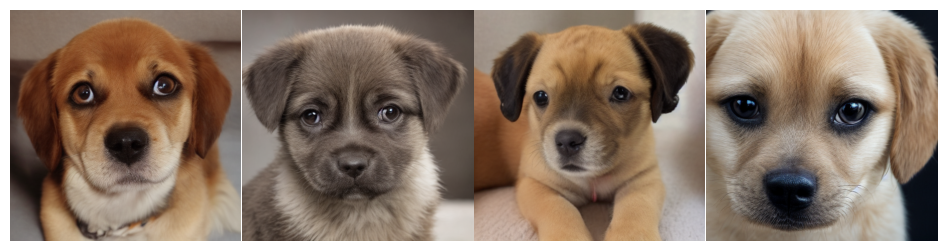

In [26]:
# Подставляем нашу новую обученную модель в пайплайн
pipe.unet = cm_unet.eval().to(torch.float16)
assert cm_unet.active_adapter == 'cd'

generator = torch.Generator(device="cuda").manual_seed(1)
guidance_scale = 0

prompt = "A sad puppy with large eyes"
images = consistency_sampling(       # <YOUR CODE HERE>
    pipe,
    prompt,
    generator=generator,
    guidance_scale=guidance_scale,
)

visualize_images(images)

100%|██████████| 4/4 [00:00<00:00,  7.22it/s]


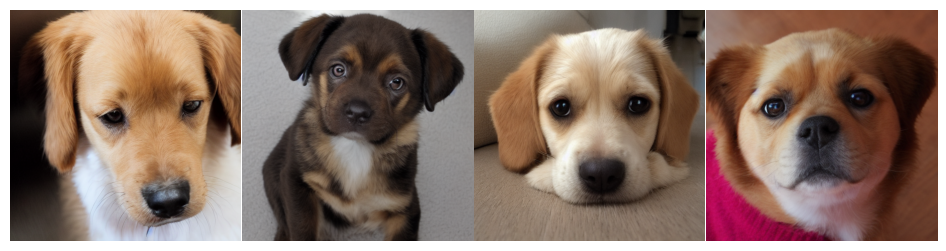

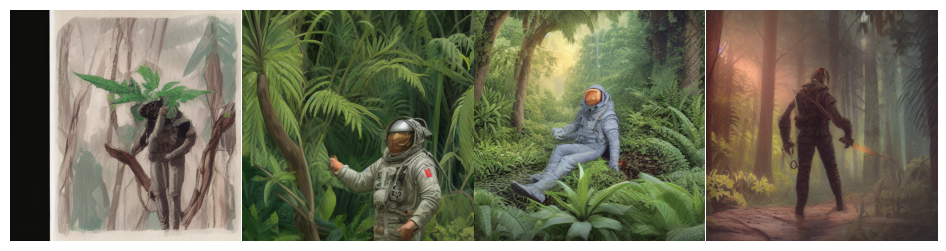

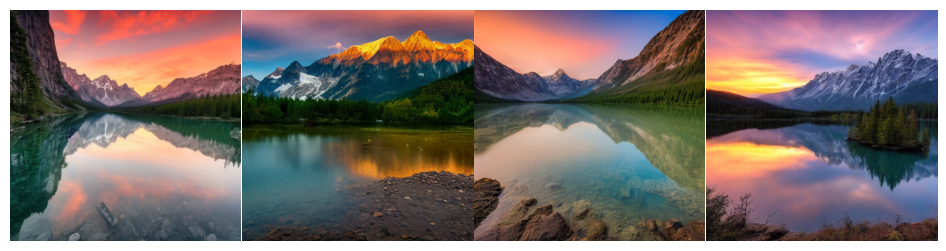

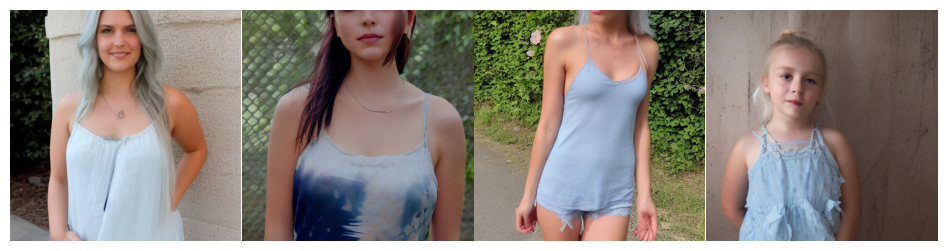

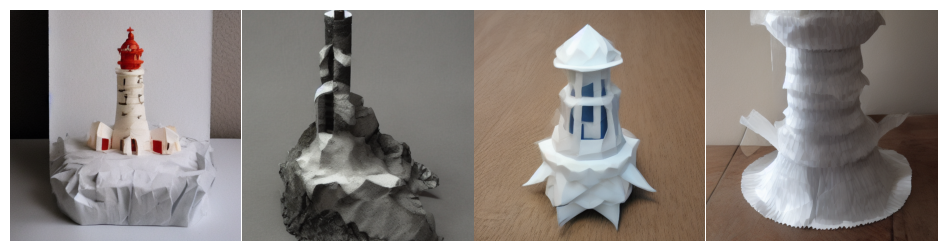

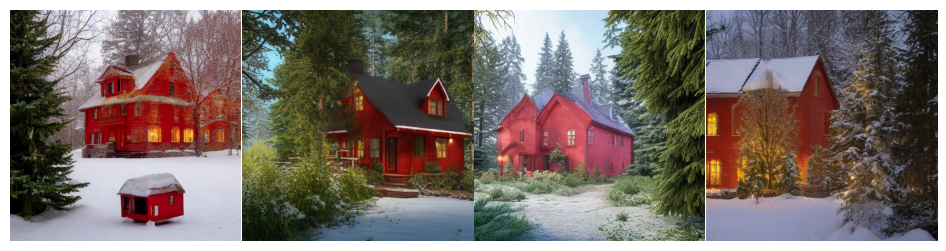

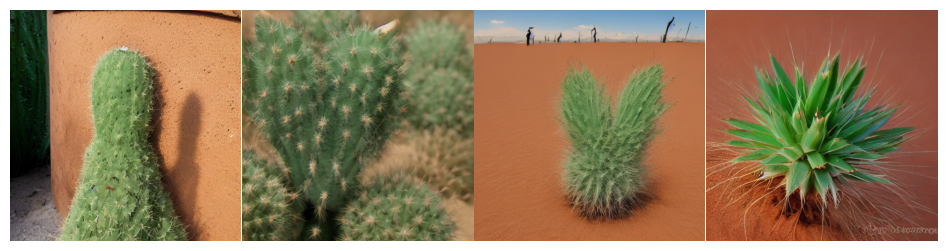

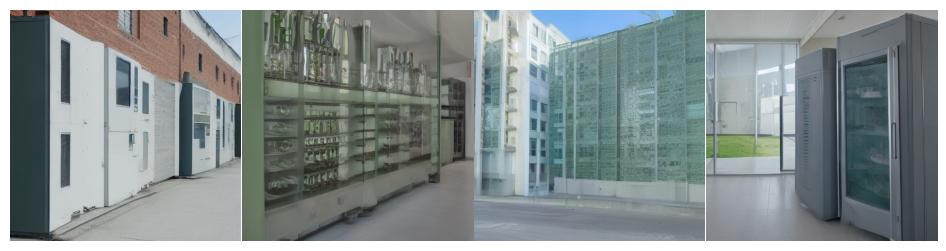

In [27]:
validation_prompts = [
    "A sad puppy with large eyes",
    "Astronaut in a jungle, cold color palette, muted colors, detailed, 8k",
    "A photo of beautiful mountain with realistic sunset and blue lake, highly detailed, masterpiece",
    "A girl with pale blue hair and a cami tank top",
    "A lighthouse in a giant wave, origami style",
    "belle epoque, christmas, red house in the forest, photo realistic, 8k",
    "A small cactus with a happy face in the Sahara desert",
    "Green commercial building with refrigerator and refrigeration units outside",
]

for prompt in validation_prompts:
    generator = torch.Generator(device="cuda").manual_seed(0)

    images = consistency_sampling(       # <YOUR CODE HERE>
        pipe,
        prompt,
        generator=generator,
        guidance_scale=0,
    )

    visualize_images(images)

#### Давайте посмотрим на картинки для других промптов

# Multi-boundary Сonsistency Distillation
<div>
<img src=https://storage.yandexcloud.net/yandex-research/cvweek-cd-task-images/multi-cd-idea.jpg width=600>
<div>
    
   В конце мы рассмотрим недавнюю модификацию CD, *Multi-boundary CD*, где интегрируем не всю траекторию сразу и потом сэмплируем с возвращением назад, а разбиваем траектории на $K$ отрезков и применяет CD внутри каждого отрезка независимо. Например, на картинке выше у нас два отрезка: зеленым и красным выделены две граничные точки.
Для классического CD, рассмотренного ранее, у нас только одна граничная точка в $t = 0$
    
**Обратим внимание**, что сэмплирование становится детерминистичным и можно снова использовать DDIM солвер, где число шагов равно числу интервалов $K$, на которые мы разбили траектории во время обучения.

Этот метод гораздо лучше работает чем обычный CD, потому что решать задачу CD на отрезках, а не на всей траектории, гораздо проще. В текущем задании мы разобьем траекторию на $K=4$ отрезка.

Подробнее почитать можно в этой [статье](https://arxiv.org/pdf/2403.06807).

## Задание №7 (0.25 балла, сдается в контесте)

Ниже реализуйте функцию, которая для $K=4$ отрезков будет сопоставлять таймстепам соответствующие граничные точки.

Например, для $K=2$ отрезков граничные точки будут: [0, 499]

$0 \leq t < 499$ -> граничная точка - $0$

$499 \leq t < 999$ -> граничная точка - $499$

**Замечание:** помним, что интервал между $t$ и $s$ - 20 шагов.


In [28]:
# Здесь важно повыводить timesteps и boundary_timesteps перед обучением,
# чтобы не перелетать граничные точки и при этом иногда попадать в них.
def get_multi_boundary_timesteps(
    timesteps,
    num_boundaries=4,
    num_timesteps=1000,
):
    """
    Для батча таймстепов определяем соответствующие граничные точки.
    params:
        timesteps: torch.Tensor(batch_size, device='cuda')
    returns:
        boundary_timesteps: torch.Tensor(batch_size, device='cuda')
    """
    segment_size = num_timesteps // num_boundaries
    bounds = list(range(0, num_timesteps, segment_size))[:num_boundaries]
    bounds = torch.tensor(bounds, dtype=torch.int, device=timesteps.device)
    bounds[1:] -= 1
    timesteps_expanded = timesteps.unsqueeze(-1)
    bounds_expanded = bounds.reshape(1, num_boundaries)
    mask = timesteps_expanded >= bounds_expanded
    result = torch.max(bounds_expanded * mask.float(), dim=-1)[0]
    return result.long()

In [29]:
multi_cd_loss = functools.partial(
    cm_loss_template,

    loss_fn=pseudo_huber_loss,
    get_boundary_timesteps=get_multi_boundary_timesteps,
    get_xs_from_xt=get_xs_from_xt_with_teacher
)

unet = unet.to(torch.float32)
unet.train()
assert unet.dtype == torch.float32

cm_unet.add_adapter("multi-cd", lora_config)
cm_unet.set_adapter("multi-cd")
assert cm_unet.active_adapter == 'multi-cd'

**Теперь обучим  Multi-boundary CD модель**

In [30]:
optimizer = torch.optim.AdamW(cm_unet.parameters(), lr=1e-4)

In [31]:
num_grad_accum = 2 # обновляем параметры каждые 2 шага

train_loop(cm_unet, pipe, train_dataloader, optimizer, multi_cd_loss, num_grad_accum)

  0%|          | 1/625 [00:02<22:49,  2.20s/it]

Loss: 0.010503560304641724


  0%|          | 2/625 [00:04<22:53,  2.20s/it]

Loss: 0.010477290488779545


  0%|          | 3/625 [00:06<22:32,  2.17s/it]

Loss: 0.009407680481672287


  1%|          | 4/625 [00:08<22:27,  2.17s/it]

Loss: 0.008289475925266743


  1%|          | 5/625 [00:10<22:17,  2.16s/it]

Loss: 0.014645613729953766


  1%|          | 6/625 [00:13<22:16,  2.16s/it]

Loss: 0.010555947199463844


  1%|          | 7/625 [00:15<23:21,  2.27s/it]

Loss: 0.010539527982473373


  1%|▏         | 8/625 [00:17<22:59,  2.24s/it]

Loss: 0.009909113869071007


  1%|▏         | 9/625 [00:19<22:36,  2.20s/it]

Loss: 0.010918380692601204


  2%|▏         | 10/625 [00:21<22:24,  2.19s/it]

Loss: 0.008167043328285217


  2%|▏         | 11/625 [00:24<22:14,  2.17s/it]

Loss: 0.010242563672363758


  2%|▏         | 12/625 [00:26<22:09,  2.17s/it]

Loss: 0.009925350546836853


  2%|▏         | 13/625 [00:28<22:01,  2.16s/it]

Loss: 0.010737501084804535


  2%|▏         | 14/625 [00:30<21:58,  2.16s/it]

Loss: 0.008735235780477524


  2%|▏         | 15/625 [00:32<21:54,  2.15s/it]

Loss: 0.010953476652503014


  3%|▎         | 16/625 [00:34<21:53,  2.16s/it]

Loss: 0.012520957738161087


  3%|▎         | 17/625 [00:36<21:47,  2.15s/it]

Loss: 0.010908869095146656


  3%|▎         | 18/625 [00:39<21:48,  2.16s/it]

Loss: 0.008020835928618908


  3%|▎         | 19/625 [00:41<21:44,  2.15s/it]

Loss: 0.008589624427258968


  3%|▎         | 20/625 [00:43<21:43,  2.16s/it]

Loss: 0.009936736896634102


  3%|▎         | 21/625 [00:45<21:40,  2.15s/it]

Loss: 0.008090092800557613


  4%|▎         | 22/625 [00:47<21:38,  2.15s/it]

Loss: 0.008564068004488945


  4%|▎         | 23/625 [00:49<21:33,  2.15s/it]

Loss: 0.010350139811635017


  4%|▍         | 24/625 [00:52<21:31,  2.15s/it]

Loss: 0.0088117104023695


  4%|▍         | 25/625 [00:54<21:25,  2.14s/it]

Loss: 0.010617773979902267


  4%|▍         | 26/625 [00:56<21:24,  2.14s/it]

Loss: 0.012911159545183182


  4%|▍         | 27/625 [00:58<21:20,  2.14s/it]

Loss: 0.008320488035678864


  4%|▍         | 28/625 [01:00<21:19,  2.14s/it]

Loss: 0.012018024921417236


  5%|▍         | 29/625 [01:02<21:19,  2.15s/it]

Loss: 0.007683281786739826


  5%|▍         | 30/625 [01:04<21:19,  2.15s/it]

Loss: 0.010979607701301575


  5%|▍         | 31/625 [01:07<21:17,  2.15s/it]

Loss: 0.009467760100960732


  5%|▌         | 32/625 [01:09<21:17,  2.15s/it]

Loss: 0.007148704491555691


  5%|▌         | 33/625 [01:11<21:13,  2.15s/it]

Loss: 0.012253871187567711


  5%|▌         | 34/625 [01:13<22:15,  2.26s/it]

Loss: 0.012574504129588604


  6%|▌         | 35/625 [01:16<21:53,  2.23s/it]

Loss: 0.011060587130486965


  6%|▌         | 36/625 [01:18<21:37,  2.20s/it]

Loss: 0.010374899953603745


  6%|▌         | 37/625 [01:20<21:22,  2.18s/it]

Loss: 0.011751990765333176


  6%|▌         | 38/625 [01:22<21:18,  2.18s/it]

Loss: 0.011085044592618942


  6%|▌         | 39/625 [01:24<21:08,  2.17s/it]

Loss: 0.010816439986228943


  6%|▋         | 40/625 [01:26<21:04,  2.16s/it]

Loss: 0.008885432966053486


  7%|▋         | 41/625 [01:28<20:59,  2.16s/it]

Loss: 0.008273466490209103


  7%|▋         | 42/625 [01:31<20:57,  2.16s/it]

Loss: 0.009522355161607265


  7%|▋         | 43/625 [01:33<20:52,  2.15s/it]

Loss: 0.011684314347803593


  7%|▋         | 44/625 [01:35<20:51,  2.15s/it]

Loss: 0.009204628877341747


  7%|▋         | 45/625 [01:37<20:47,  2.15s/it]

Loss: 0.011623061262071133


  7%|▋         | 46/625 [01:39<20:44,  2.15s/it]

Loss: 0.009221195243299007


  8%|▊         | 47/625 [01:41<20:40,  2.15s/it]

Loss: 0.012547594495117664


  8%|▊         | 48/625 [01:43<20:39,  2.15s/it]

Loss: 0.010414859279990196


  8%|▊         | 49/625 [01:46<20:34,  2.14s/it]

Loss: 0.012335658073425293


  8%|▊         | 50/625 [01:48<20:34,  2.15s/it]

Loss: 0.010348309762775898


  8%|▊         | 51/625 [01:50<20:30,  2.14s/it]

Loss: 0.013099022209644318


  8%|▊         | 52/625 [01:52<20:29,  2.15s/it]

Loss: 0.010294076055288315


  8%|▊         | 53/625 [01:54<20:25,  2.14s/it]

Loss: 0.009700654074549675


  9%|▊         | 54/625 [01:56<20:25,  2.15s/it]

Loss: 0.010911654680967331


  9%|▉         | 55/625 [01:58<20:20,  2.14s/it]

Loss: 0.009342757053673267


  9%|▉         | 56/625 [02:01<20:21,  2.15s/it]

Loss: 0.009320605546236038


  9%|▉         | 57/625 [02:03<20:18,  2.14s/it]

Loss: 0.011860181577503681


  9%|▉         | 58/625 [02:05<20:19,  2.15s/it]

Loss: 0.007342132274061441


  9%|▉         | 59/625 [02:07<20:15,  2.15s/it]

Loss: 0.009515534155070782


 10%|▉         | 60/625 [02:09<20:15,  2.15s/it]

Loss: 0.007519188337028027


 10%|▉         | 61/625 [02:12<21:07,  2.25s/it]

Loss: 0.008793510496616364


 10%|▉         | 62/625 [02:14<20:49,  2.22s/it]

Loss: 0.0103230569511652


 10%|█         | 63/625 [02:16<20:33,  2.19s/it]

Loss: 0.009968491271138191


 10%|█         | 64/625 [02:18<20:24,  2.18s/it]

Loss: 0.007017599418759346


 10%|█         | 65/625 [02:20<20:14,  2.17s/it]

Loss: 0.00786047987639904


 11%|█         | 66/625 [02:22<20:09,  2.16s/it]

Loss: 0.008862854912877083


 11%|█         | 67/625 [02:25<20:04,  2.16s/it]

Loss: 0.007578038610517979


 11%|█         | 68/625 [02:27<20:01,  2.16s/it]

Loss: 0.008491547778248787


 11%|█         | 69/625 [02:29<19:56,  2.15s/it]

Loss: 0.009401123970746994


 11%|█         | 70/625 [02:31<19:54,  2.15s/it]

Loss: 0.009255064651370049


 11%|█▏        | 71/625 [02:33<19:49,  2.15s/it]

Loss: 0.00923464447259903


 12%|█▏        | 72/625 [02:35<19:51,  2.15s/it]

Loss: 0.010985716246068478


 12%|█▏        | 73/625 [02:37<19:47,  2.15s/it]

Loss: 0.008944646455347538


 12%|█▏        | 74/625 [02:40<19:46,  2.15s/it]

Loss: 0.012677807360887527


 12%|█▏        | 75/625 [02:42<19:41,  2.15s/it]

Loss: 0.009833347983658314


 12%|█▏        | 76/625 [02:44<19:39,  2.15s/it]

Loss: 0.009601710364222527


 12%|█▏        | 77/625 [02:46<19:34,  2.14s/it]

Loss: 0.009679763577878475


 12%|█▏        | 78/625 [02:48<19:35,  2.15s/it]

Loss: 0.007923540659248829


 13%|█▎        | 79/625 [02:50<19:32,  2.15s/it]

Loss: 0.009124236181378365


 13%|█▎        | 80/625 [02:52<19:30,  2.15s/it]

Loss: 0.007677535526454449


 13%|█▎        | 81/625 [02:55<19:27,  2.15s/it]

Loss: 0.008550149388611317


 13%|█▎        | 82/625 [02:57<19:27,  2.15s/it]

Loss: 0.011660907417535782


 13%|█▎        | 83/625 [02:59<19:21,  2.14s/it]

Loss: 0.00818652007728815


 13%|█▎        | 84/625 [03:01<19:21,  2.15s/it]

Loss: 0.009744999930262566


 14%|█▎        | 85/625 [03:03<19:19,  2.15s/it]

Loss: 0.010577518492937088


 14%|█▍        | 86/625 [03:05<19:18,  2.15s/it]

Loss: 0.009365150704979897


 14%|█▍        | 87/625 [03:08<19:14,  2.15s/it]

Loss: 0.01442644465714693


 14%|█▍        | 88/625 [03:10<20:10,  2.25s/it]

Loss: 0.0096888467669487


 14%|█▍        | 89/625 [03:12<19:50,  2.22s/it]

Loss: 0.012765402905642986


 14%|█▍        | 90/625 [03:14<19:38,  2.20s/it]

Loss: 0.008277840912342072


 15%|█▍        | 91/625 [03:16<19:25,  2.18s/it]

Loss: 0.007933024317026138


 15%|█▍        | 92/625 [03:19<19:18,  2.17s/it]

Loss: 0.010674231685698032


 15%|█▍        | 93/625 [03:21<19:11,  2.16s/it]

Loss: 0.011900564655661583


 15%|█▌        | 94/625 [03:23<19:08,  2.16s/it]

Loss: 0.01575218327343464


 15%|█▌        | 95/625 [03:25<19:04,  2.16s/it]

Loss: 0.014290963299572468


 15%|█▌        | 96/625 [03:27<19:01,  2.16s/it]

Loss: 0.007841035723686218


 16%|█▌        | 97/625 [03:29<18:57,  2.15s/it]

Loss: 0.012989258393645287


 16%|█▌        | 98/625 [03:32<18:54,  2.15s/it]

Loss: 0.007118524517863989


 16%|█▌        | 99/625 [03:34<18:51,  2.15s/it]

Loss: 0.011125238612294197


 16%|█▌        | 100/625 [03:36<18:49,  2.15s/it]

Loss: 0.0077975778840482235


 16%|█▌        | 101/625 [03:38<18:46,  2.15s/it]

Loss: 0.011904150247573853


 16%|█▋        | 102/625 [03:40<18:44,  2.15s/it]

Loss: 0.011076150462031364


 16%|█▋        | 103/625 [03:42<18:39,  2.14s/it]

Loss: 0.010332309640944004


 17%|█▋        | 104/625 [03:44<18:37,  2.14s/it]

Loss: 0.00994747132062912


 17%|█▋        | 105/625 [03:47<18:35,  2.15s/it]

Loss: 0.011624547652900219


 17%|█▋        | 106/625 [03:49<18:35,  2.15s/it]

Loss: 0.008867483586072922


 17%|█▋        | 107/625 [03:51<18:31,  2.15s/it]

Loss: 0.00825406238436699


 17%|█▋        | 108/625 [03:53<18:31,  2.15s/it]

Loss: 0.010736925527453423


 17%|█▋        | 109/625 [03:55<18:26,  2.14s/it]

Loss: 0.01206136867403984


 18%|█▊        | 110/625 [03:57<18:25,  2.15s/it]

Loss: 0.00999625213444233


 18%|█▊        | 111/625 [03:59<18:21,  2.14s/it]

Loss: 0.009932240471243858


 18%|█▊        | 112/625 [04:02<18:21,  2.15s/it]

Loss: 0.008238757029175758


 18%|█▊        | 113/625 [04:04<18:17,  2.14s/it]

Loss: 0.012222211807966232


 18%|█▊        | 114/625 [04:06<19:08,  2.25s/it]

Loss: 0.013171491213142872


 18%|█▊        | 115/625 [04:08<18:50,  2.22s/it]

Loss: 0.01042427122592926


 19%|█▊        | 116/625 [04:10<18:36,  2.19s/it]

Loss: 0.01061519980430603


 19%|█▊        | 117/625 [04:13<18:24,  2.17s/it]

Loss: 0.013122208416461945


 19%|█▉        | 118/625 [04:15<18:20,  2.17s/it]

Loss: 0.009934109635651112


 19%|█▉        | 119/625 [04:17<18:14,  2.16s/it]

Loss: 0.00989130325615406


 19%|█▉        | 120/625 [04:19<18:10,  2.16s/it]

Loss: 0.011735618114471436


 19%|█▉        | 121/625 [04:21<18:05,  2.15s/it]

Loss: 0.01104041188955307


 20%|█▉        | 122/625 [04:23<18:04,  2.16s/it]

Loss: 0.011772294528782368


 20%|█▉        | 123/625 [04:26<18:00,  2.15s/it]

Loss: 0.010990303941071033


 20%|█▉        | 124/625 [04:28<17:59,  2.15s/it]

Loss: 0.010700924322009087


 20%|██        | 125/625 [04:30<17:55,  2.15s/it]

Loss: 0.010023863986134529


 20%|██        | 126/625 [04:32<17:54,  2.15s/it]

Loss: 0.012189514935016632


 20%|██        | 127/625 [04:34<17:51,  2.15s/it]

Loss: 0.008213061839342117


 20%|██        | 128/625 [04:36<17:50,  2.15s/it]

Loss: 0.011488830670714378


 21%|██        | 129/625 [04:38<17:46,  2.15s/it]

Loss: 0.01021464355289936


 21%|██        | 130/625 [04:41<17:44,  2.15s/it]

Loss: 0.018635964021086693


 21%|██        | 131/625 [04:43<17:40,  2.15s/it]

Loss: 0.011401685886085033


 21%|██        | 132/625 [04:45<17:40,  2.15s/it]

Loss: 0.013625972904264927


 21%|██▏       | 133/625 [04:47<17:36,  2.15s/it]

Loss: 0.009294157847762108


 21%|██▏       | 134/625 [04:49<17:35,  2.15s/it]

Loss: 0.01048072800040245


 22%|██▏       | 135/625 [04:51<17:31,  2.15s/it]

Loss: 0.009413450956344604


 22%|██▏       | 136/625 [04:53<17:30,  2.15s/it]

Loss: 0.009864852763712406


 22%|██▏       | 137/625 [04:56<17:27,  2.15s/it]

Loss: 0.015491556376218796


 22%|██▏       | 138/625 [04:58<17:25,  2.15s/it]

Loss: 0.00996018759906292


 22%|██▏       | 139/625 [05:00<17:22,  2.14s/it]

Loss: 0.008127396926283836


 22%|██▏       | 140/625 [05:02<18:13,  2.25s/it]

Loss: 0.012008197605609894


 23%|██▎       | 141/625 [05:05<17:54,  2.22s/it]

Loss: 0.0116758206859231


 23%|██▎       | 142/625 [05:07<17:43,  2.20s/it]

Loss: 0.012253189459443092


 23%|██▎       | 143/625 [05:09<17:31,  2.18s/it]

Loss: 0.012428448535501957


 23%|██▎       | 144/625 [05:11<17:24,  2.17s/it]

Loss: 0.010222507640719414


 23%|██▎       | 145/625 [05:13<17:18,  2.16s/it]

Loss: 0.013463052920997143


 23%|██▎       | 146/625 [05:15<17:14,  2.16s/it]

Loss: 0.010864531621336937


 24%|██▎       | 147/625 [05:17<17:09,  2.15s/it]

Loss: 0.011509972624480724


 24%|██▎       | 148/625 [05:20<17:07,  2.15s/it]

Loss: 0.012218219228088856


 24%|██▍       | 149/625 [05:22<17:01,  2.15s/it]

Loss: 0.00859103538095951


 24%|██▍       | 150/625 [05:24<16:59,  2.15s/it]

Loss: 0.00955043826252222


 24%|██▍       | 151/625 [05:26<16:55,  2.14s/it]

Loss: 0.011202837340533733


 24%|██▍       | 152/625 [05:28<16:55,  2.15s/it]

Loss: 0.01089938823133707


 24%|██▍       | 153/625 [05:30<16:52,  2.14s/it]

Loss: 0.008190622553229332


 25%|██▍       | 154/625 [05:32<16:52,  2.15s/it]

Loss: 0.011517480947077274


 25%|██▍       | 155/625 [05:35<16:49,  2.15s/it]

Loss: 0.006569851189851761


 25%|██▍       | 156/625 [05:37<16:50,  2.15s/it]

Loss: 0.012219632044434547


 25%|██▌       | 157/625 [05:39<16:47,  2.15s/it]

Loss: 0.010449260473251343


 25%|██▌       | 158/625 [05:41<16:45,  2.15s/it]

Loss: 0.012459615245461464


 25%|██▌       | 159/625 [05:43<16:42,  2.15s/it]

Loss: 0.010850545018911362


 26%|██▌       | 160/625 [05:45<16:41,  2.15s/it]

Loss: 0.013713919557631016


 26%|██▌       | 161/625 [05:48<16:38,  2.15s/it]

Loss: 0.008817855268716812


 26%|██▌       | 162/625 [05:50<16:37,  2.15s/it]

Loss: 0.009089102037250996


 26%|██▌       | 163/625 [05:52<16:32,  2.15s/it]

Loss: 0.011192940175533295


 26%|██▌       | 164/625 [05:54<16:33,  2.16s/it]

Loss: 0.008283564820885658


 26%|██▋       | 165/625 [05:56<16:31,  2.16s/it]

Loss: 0.011510590091347694


 27%|██▋       | 166/625 [05:58<16:29,  2.16s/it]

Loss: 0.009086746722459793


 27%|██▋       | 167/625 [06:01<17:13,  2.26s/it]

Loss: 0.010792638175189495


 27%|██▋       | 168/625 [06:03<16:58,  2.23s/it]

Loss: 0.013256228528916836


 27%|██▋       | 169/625 [06:05<16:46,  2.21s/it]

Loss: 0.008751899935305119


 27%|██▋       | 170/625 [06:07<16:38,  2.20s/it]

Loss: 0.013064784929156303


 27%|██▋       | 171/625 [06:09<16:29,  2.18s/it]

Loss: 0.010763539001345634


 28%|██▊       | 172/625 [06:12<16:23,  2.17s/it]

Loss: 0.012418498285114765


 28%|██▊       | 173/625 [06:14<16:15,  2.16s/it]

Loss: 0.008896219544112682


 28%|██▊       | 174/625 [06:16<16:12,  2.16s/it]

Loss: 0.009400886483490467


 28%|██▊       | 175/625 [06:18<16:07,  2.15s/it]

Loss: 0.008165441453456879


 28%|██▊       | 176/625 [06:20<16:06,  2.15s/it]

Loss: 0.010556837543845177


 28%|██▊       | 177/625 [06:22<16:00,  2.14s/it]

Loss: 0.013446380384266376


 28%|██▊       | 178/625 [06:24<15:59,  2.15s/it]

Loss: 0.014430643990635872


 29%|██▊       | 179/625 [06:27<15:56,  2.14s/it]

Loss: 0.009562032297253609


 29%|██▉       | 180/625 [06:29<15:59,  2.16s/it]

Loss: 0.009518474340438843


 29%|██▉       | 181/625 [06:31<15:54,  2.15s/it]

Loss: 0.010684216395020485


 29%|██▉       | 182/625 [06:33<15:53,  2.15s/it]

Loss: 0.010985183529555798


 29%|██▉       | 183/625 [06:35<15:50,  2.15s/it]

Loss: 0.012401165440678596


 29%|██▉       | 184/625 [06:37<15:47,  2.15s/it]

Loss: 0.00859083142131567


 30%|██▉       | 185/625 [06:39<15:43,  2.14s/it]

Loss: 0.009806115180253983


 30%|██▉       | 186/625 [06:42<15:43,  2.15s/it]

Loss: 0.00949227437376976


 30%|██▉       | 187/625 [06:44<15:40,  2.15s/it]

Loss: 0.009629366919398308


 30%|███       | 188/625 [06:46<15:38,  2.15s/it]

Loss: 0.009226207621395588


 30%|███       | 189/625 [06:48<15:34,  2.14s/it]

Loss: 0.011310846544802189


 30%|███       | 190/625 [06:50<15:34,  2.15s/it]

Loss: 0.010390186682343483


 31%|███       | 191/625 [06:52<15:32,  2.15s/it]

Loss: 0.01208251528441906


 31%|███       | 192/625 [06:55<15:32,  2.15s/it]

Loss: 0.010716431774199009


 31%|███       | 193/625 [06:57<15:28,  2.15s/it]

Loss: 0.010352271609008312


 31%|███       | 194/625 [06:59<16:10,  2.25s/it]

Loss: 0.009963281452655792


 31%|███       | 195/625 [07:01<15:54,  2.22s/it]

Loss: 0.014116625301539898


 31%|███▏      | 196/625 [07:03<15:43,  2.20s/it]

Loss: 0.011748222634196281


 32%|███▏      | 197/625 [07:06<15:33,  2.18s/it]

Loss: 0.009956208057701588


 32%|███▏      | 198/625 [07:08<15:29,  2.18s/it]

Loss: 0.010351374745368958


 32%|███▏      | 199/625 [07:10<15:22,  2.16s/it]

Loss: 0.009735403582453728


 32%|███▏      | 200/625 [07:12<15:22,  2.17s/it]

Loss: 0.008769695647060871


 32%|███▏      | 201/625 [07:14<15:16,  2.16s/it]

Loss: 0.013824716210365295


 32%|███▏      | 202/625 [07:16<15:14,  2.16s/it]

Loss: 0.010152112692594528


 32%|███▏      | 203/625 [07:19<15:08,  2.15s/it]

Loss: 0.011446510441601276


 33%|███▎      | 204/625 [07:21<15:06,  2.15s/it]

Loss: 0.012443363666534424


 33%|███▎      | 205/625 [07:23<15:02,  2.15s/it]

Loss: 0.012784508056938648


 33%|███▎      | 206/625 [07:25<15:01,  2.15s/it]

Loss: 0.01291641965508461


 33%|███▎      | 207/625 [07:27<14:57,  2.15s/it]

Loss: 0.009442814625799656


 33%|███▎      | 208/625 [07:29<14:56,  2.15s/it]

Loss: 0.013076783157885075


 33%|███▎      | 209/625 [07:31<14:52,  2.15s/it]

Loss: 0.010254362598061562


 34%|███▎      | 210/625 [07:34<14:51,  2.15s/it]

Loss: 0.008152687922120094


 34%|███▍      | 211/625 [07:36<14:46,  2.14s/it]

Loss: 0.008730986155569553


 34%|███▍      | 212/625 [07:38<14:47,  2.15s/it]

Loss: 0.011224571615457535


 34%|███▍      | 213/625 [07:40<14:44,  2.15s/it]

Loss: 0.008199783973395824


 34%|███▍      | 214/625 [07:42<14:44,  2.15s/it]

Loss: 0.010144791565835476


 34%|███▍      | 215/625 [07:44<14:41,  2.15s/it]

Loss: 0.01260029710829258


 35%|███▍      | 216/625 [07:46<14:40,  2.15s/it]

Loss: 0.009044520556926727


 35%|███▍      | 217/625 [07:49<14:38,  2.15s/it]

Loss: 0.012528564780950546


 35%|███▍      | 218/625 [07:51<14:36,  2.15s/it]

Loss: 0.009300808422267437


 35%|███▌      | 219/625 [07:53<14:32,  2.15s/it]

Loss: 0.01312512718141079


 35%|███▌      | 220/625 [07:55<15:12,  2.25s/it]

Loss: 0.010871754959225655


 35%|███▌      | 221/625 [07:58<14:56,  2.22s/it]

Loss: 0.008652321062982082


 36%|███▌      | 222/625 [08:00<14:46,  2.20s/it]

Loss: 0.010121075436472893


 36%|███▌      | 223/625 [08:02<14:37,  2.18s/it]

Loss: 0.00852029025554657


 36%|███▌      | 224/625 [08:04<14:33,  2.18s/it]

Loss: 0.014961358159780502


 36%|███▌      | 225/625 [08:06<14:27,  2.17s/it]

Loss: 0.008869309909641743


 36%|███▌      | 226/625 [08:08<14:25,  2.17s/it]

Loss: 0.010542452335357666


 36%|███▋      | 227/625 [08:10<14:19,  2.16s/it]

Loss: 0.007149072829633951


 36%|███▋      | 228/625 [08:13<14:17,  2.16s/it]

Loss: 0.008760412223637104


 37%|███▋      | 229/625 [08:15<14:13,  2.15s/it]

Loss: 0.011375363916158676


 37%|███▋      | 230/625 [08:17<14:12,  2.16s/it]

Loss: 0.008072897791862488


 37%|███▋      | 231/625 [08:19<14:09,  2.16s/it]

Loss: 0.011116400361061096


 37%|███▋      | 232/625 [08:21<14:07,  2.16s/it]

Loss: 0.009439550340175629


 37%|███▋      | 233/625 [08:23<14:02,  2.15s/it]

Loss: 0.010642943903803825


 37%|███▋      | 234/625 [08:26<14:02,  2.15s/it]

Loss: 0.008908946067094803


 38%|███▊      | 235/625 [08:28<13:58,  2.15s/it]

Loss: 0.012209394946694374


 38%|███▊      | 236/625 [08:30<13:55,  2.15s/it]

Loss: 0.010873578488826752


 38%|███▊      | 237/625 [08:32<13:52,  2.15s/it]

Loss: 0.008474141359329224


 38%|███▊      | 238/625 [08:34<13:51,  2.15s/it]

Loss: 0.008885568007826805


 38%|███▊      | 239/625 [08:36<13:50,  2.15s/it]

Loss: 0.013802066445350647


 38%|███▊      | 240/625 [08:38<13:48,  2.15s/it]

Loss: 0.016391947865486145


 39%|███▊      | 241/625 [08:41<13:44,  2.15s/it]

Loss: 0.010145471431314945


 39%|███▊      | 242/625 [08:43<13:42,  2.15s/it]

Loss: 0.015229791402816772


 39%|███▉      | 243/625 [08:45<13:39,  2.15s/it]

Loss: 0.011993307620286942


 39%|███▉      | 244/625 [08:47<13:38,  2.15s/it]

Loss: 0.014731085859239101


 39%|███▉      | 245/625 [08:49<13:36,  2.15s/it]

Loss: 0.008738216944038868


 39%|███▉      | 246/625 [08:52<14:13,  2.25s/it]

Loss: 0.009975699707865715


 40%|███▉      | 247/625 [08:54<13:58,  2.22s/it]

Loss: 0.010903329588472843


 40%|███▉      | 248/625 [08:56<13:49,  2.20s/it]

Loss: 0.009350672364234924


 40%|███▉      | 249/625 [08:58<13:40,  2.18s/it]

Loss: 0.00904542300850153


 40%|████      | 250/625 [09:00<13:34,  2.17s/it]

Loss: 0.010857556015253067


 40%|████      | 251/625 [09:02<13:27,  2.16s/it]

Loss: 0.00904938019812107


 40%|████      | 252/625 [09:04<13:25,  2.16s/it]

Loss: 0.008795367553830147


 40%|████      | 253/625 [09:07<13:21,  2.16s/it]

Loss: 0.01223655417561531


 41%|████      | 254/625 [09:09<13:19,  2.15s/it]

Loss: 0.007319631986320019


 41%|████      | 255/625 [09:11<13:15,  2.15s/it]

Loss: 0.01192430965602398


 41%|████      | 256/625 [09:13<13:14,  2.15s/it]

Loss: 0.00910685583949089


 41%|████      | 257/625 [09:15<13:10,  2.15s/it]

Loss: 0.010473803617060184


 41%|████▏     | 258/625 [09:17<13:08,  2.15s/it]

Loss: 0.007525226566940546


 41%|████▏     | 259/625 [09:20<13:05,  2.15s/it]

Loss: 0.013517362996935844


 42%|████▏     | 260/625 [09:22<13:03,  2.15s/it]

Loss: 0.011582021601498127


 42%|████▏     | 261/625 [09:24<13:00,  2.14s/it]

Loss: 0.012386566959321499


 42%|████▏     | 262/625 [09:26<13:00,  2.15s/it]

Loss: 0.011394282802939415


 42%|████▏     | 263/625 [09:28<12:57,  2.15s/it]

Loss: 0.007971695624291897


 42%|████▏     | 264/625 [09:30<12:56,  2.15s/it]

Loss: 0.01243000291287899


 42%|████▏     | 265/625 [09:32<12:53,  2.15s/it]

Loss: 0.009294000454246998


 43%|████▎     | 266/625 [09:35<12:52,  2.15s/it]

Loss: 0.008497096598148346


 43%|████▎     | 267/625 [09:37<12:49,  2.15s/it]

Loss: 0.009056862443685532


 43%|████▎     | 268/625 [09:39<12:48,  2.15s/it]

Loss: 0.01322860736399889


 43%|████▎     | 269/625 [09:41<12:44,  2.15s/it]

Loss: 0.012109228409826756


 43%|████▎     | 270/625 [09:43<12:41,  2.15s/it]

Loss: 0.011258549988269806


 43%|████▎     | 271/625 [09:45<12:39,  2.14s/it]

Loss: 0.009442608803510666


 44%|████▎     | 272/625 [09:47<12:38,  2.15s/it]

Loss: 0.010486534796655178


 44%|████▎     | 273/625 [09:50<13:10,  2.25s/it]

Loss: 0.007725908886641264


 44%|████▍     | 274/625 [09:52<12:58,  2.22s/it]

Loss: 0.007883930578827858


 44%|████▍     | 275/625 [09:54<12:48,  2.20s/it]

Loss: 0.01139897108078003


 44%|████▍     | 276/625 [09:56<12:42,  2.19s/it]

Loss: 0.014454401098191738


 44%|████▍     | 277/625 [09:59<12:36,  2.17s/it]

Loss: 0.011751895770430565


 44%|████▍     | 278/625 [10:01<12:32,  2.17s/it]

Loss: 0.014552827924489975


 45%|████▍     | 279/625 [10:03<12:27,  2.16s/it]

Loss: 0.011032387614250183


 45%|████▍     | 280/625 [10:05<12:25,  2.16s/it]

Loss: 0.009006567299365997


 45%|████▍     | 281/625 [10:07<12:22,  2.16s/it]

Loss: 0.01198924146592617


 45%|████▌     | 282/625 [10:09<12:21,  2.16s/it]

Loss: 0.01440387312322855


 45%|████▌     | 283/625 [10:11<12:18,  2.16s/it]

Loss: 0.010685795918107033


 45%|████▌     | 284/625 [10:14<12:16,  2.16s/it]

Loss: 0.00668641272932291


 46%|████▌     | 285/625 [10:16<12:13,  2.16s/it]

Loss: 0.00989313330501318


 46%|████▌     | 286/625 [10:18<12:11,  2.16s/it]

Loss: 0.013726376928389072


 46%|████▌     | 287/625 [10:20<12:07,  2.15s/it]

Loss: 0.009433114901185036


 46%|████▌     | 288/625 [10:22<12:07,  2.16s/it]

Loss: 0.009177334606647491


 46%|████▌     | 289/625 [10:24<12:03,  2.15s/it]

Loss: 0.01201796904206276


 46%|████▋     | 290/625 [10:27<12:02,  2.16s/it]

Loss: 0.008084338158369064


 47%|████▋     | 291/625 [10:29<11:57,  2.15s/it]

Loss: 0.017983831465244293


 47%|████▋     | 292/625 [10:31<11:57,  2.15s/it]

Loss: 0.008446406573057175


 47%|████▋     | 293/625 [10:33<11:53,  2.15s/it]

Loss: 0.010740216821432114


 47%|████▋     | 294/625 [10:35<11:53,  2.15s/it]

Loss: 0.008885618299245834


 47%|████▋     | 295/625 [10:37<11:49,  2.15s/it]

Loss: 0.012148240581154823


 47%|████▋     | 296/625 [10:39<11:47,  2.15s/it]

Loss: 0.008898919448256493


 48%|████▊     | 297/625 [10:42<11:43,  2.14s/it]

Loss: 0.010117674246430397


 48%|████▊     | 298/625 [10:44<11:40,  2.14s/it]

Loss: 0.008783016353845596


 48%|████▊     | 299/625 [10:46<11:37,  2.14s/it]

Loss: 0.010762237012386322


 48%|████▊     | 300/625 [10:48<12:09,  2.25s/it]

Loss: 0.008241308853030205


 48%|████▊     | 301/625 [10:51<11:57,  2.22s/it]

Loss: 0.013340288773179054


 48%|████▊     | 302/625 [10:53<11:50,  2.20s/it]

Loss: 0.009210189804434776


 48%|████▊     | 303/625 [10:55<11:41,  2.18s/it]

Loss: 0.014527197927236557


 49%|████▊     | 304/625 [10:57<11:36,  2.17s/it]

Loss: 0.007934723049402237


 49%|████▉     | 305/625 [10:59<11:31,  2.16s/it]

Loss: 0.010807652026414871


 49%|████▉     | 306/625 [11:01<11:27,  2.16s/it]

Loss: 0.011522762477397919


 49%|████▉     | 307/625 [11:03<11:23,  2.15s/it]

Loss: 0.009413082152605057


 49%|████▉     | 308/625 [11:06<11:21,  2.15s/it]

Loss: 0.011728733777999878


 49%|████▉     | 309/625 [11:08<11:18,  2.15s/it]

Loss: 0.007119306363165379


 50%|████▉     | 310/625 [11:10<11:17,  2.15s/it]

Loss: 0.0075326282531023026


 50%|████▉     | 311/625 [11:12<11:14,  2.15s/it]

Loss: 0.011337464675307274


 50%|████▉     | 312/625 [11:14<11:14,  2.15s/it]

Loss: 0.013537459075450897


 50%|█████     | 313/625 [11:16<11:10,  2.15s/it]

Loss: 0.01001991331577301


 50%|█████     | 314/625 [11:18<11:08,  2.15s/it]

Loss: 0.009260758757591248


 50%|█████     | 315/625 [11:21<11:05,  2.15s/it]

Loss: 0.012783436104655266


 51%|█████     | 316/625 [11:23<11:04,  2.15s/it]

Loss: 0.013012951239943504


 51%|█████     | 317/625 [11:25<11:00,  2.14s/it]

Loss: 0.011655233800411224


 51%|█████     | 318/625 [11:27<10:58,  2.15s/it]

Loss: 0.00894763320684433


 51%|█████     | 319/625 [11:29<10:54,  2.14s/it]

Loss: 0.00933888927102089


 51%|█████     | 320/625 [11:31<10:53,  2.14s/it]

Loss: 0.013903804123401642


 51%|█████▏    | 321/625 [11:33<10:50,  2.14s/it]

Loss: 0.007579172030091286


 52%|█████▏    | 322/625 [11:36<10:49,  2.14s/it]

Loss: 0.01201031357049942


 52%|█████▏    | 323/625 [11:38<10:46,  2.14s/it]

Loss: 0.005705439485609531


 52%|█████▏    | 324/625 [11:40<10:45,  2.15s/it]

Loss: 0.011450388468801975


 52%|█████▏    | 325/625 [11:42<10:42,  2.14s/it]

Loss: 0.010599082335829735


 52%|█████▏    | 326/625 [11:44<11:11,  2.25s/it]

Loss: 0.009044356644153595


 52%|█████▏    | 327/625 [11:47<10:59,  2.21s/it]

Loss: 0.009260580874979496


 52%|█████▏    | 328/625 [11:49<10:51,  2.20s/it]

Loss: 0.010887809097766876


 53%|█████▎    | 329/625 [11:51<10:44,  2.18s/it]

Loss: 0.008935045450925827


 53%|█████▎    | 330/625 [11:53<10:40,  2.17s/it]

Loss: 0.010661667212843895


 53%|█████▎    | 331/625 [11:55<10:35,  2.16s/it]

Loss: 0.011817064136266708


 53%|█████▎    | 332/625 [11:57<10:32,  2.16s/it]

Loss: 0.011307669803500175


 53%|█████▎    | 333/625 [11:59<10:28,  2.15s/it]

Loss: 0.00967465154826641


 53%|█████▎    | 334/625 [12:02<10:27,  2.15s/it]

Loss: 0.01032224390655756


 54%|█████▎    | 335/625 [12:04<10:23,  2.15s/it]

Loss: 0.00907196570187807


 54%|█████▍    | 336/625 [12:06<10:22,  2.15s/it]

Loss: 0.012798745185136795


 54%|█████▍    | 337/625 [12:08<10:20,  2.15s/it]

Loss: 0.00861646980047226


 54%|█████▍    | 338/625 [12:10<10:18,  2.15s/it]

Loss: 0.009966153651475906


 54%|█████▍    | 339/625 [12:12<10:15,  2.15s/it]

Loss: 0.008057880215346813


 54%|█████▍    | 340/625 [12:15<10:13,  2.15s/it]

Loss: 0.013160196132957935


 55%|█████▍    | 341/625 [12:17<10:09,  2.15s/it]

Loss: 0.01059536449611187


 55%|█████▍    | 342/625 [12:19<10:07,  2.15s/it]

Loss: 0.00699759041890502


 55%|█████▍    | 343/625 [12:21<10:03,  2.14s/it]

Loss: 0.007213405333459377


 55%|█████▌    | 344/625 [12:23<10:01,  2.14s/it]

Loss: 0.008646214380860329


 55%|█████▌    | 345/625 [12:25<09:59,  2.14s/it]

Loss: 0.010725158266723156


 55%|█████▌    | 346/625 [12:27<09:58,  2.14s/it]

Loss: 0.020776236429810524


 56%|█████▌    | 347/625 [12:30<09:54,  2.14s/it]

Loss: 0.014478614553809166


 56%|█████▌    | 348/625 [12:32<09:53,  2.14s/it]

Loss: 0.010810100473463535


 56%|█████▌    | 349/625 [12:34<09:51,  2.14s/it]

Loss: 0.0060379477217793465


 56%|█████▌    | 350/625 [12:36<09:50,  2.15s/it]

Loss: 0.010592138394713402


 56%|█████▌    | 351/625 [12:38<09:48,  2.15s/it]

Loss: 0.00899581890553236


 56%|█████▋    | 352/625 [12:41<10:14,  2.25s/it]

Loss: 0.01005229540169239


 56%|█████▋    | 353/625 [12:43<10:02,  2.22s/it]

Loss: 0.01110808365046978


 57%|█████▋    | 354/625 [12:45<09:55,  2.20s/it]

Loss: 0.008147962391376495


 57%|█████▋    | 355/625 [12:47<09:48,  2.18s/it]

Loss: 0.011961998417973518


 57%|█████▋    | 356/625 [12:49<09:43,  2.17s/it]

Loss: 0.009387530386447906


 57%|█████▋    | 357/625 [12:51<09:38,  2.16s/it]

Loss: 0.009231999516487122


 57%|█████▋    | 358/625 [12:53<09:36,  2.16s/it]

Loss: 0.010919997468590736


 57%|█████▋    | 359/625 [12:56<09:32,  2.15s/it]

Loss: 0.011030287481844425


 58%|█████▊    | 360/625 [12:58<09:30,  2.15s/it]

Loss: 0.012572994455695152


 58%|█████▊    | 361/625 [13:00<09:27,  2.15s/it]

Loss: 0.01047605462372303


 58%|█████▊    | 362/625 [13:02<09:26,  2.15s/it]

Loss: 0.0121233519166708


 58%|█████▊    | 363/625 [13:04<09:22,  2.15s/it]

Loss: 0.011538157239556313


 58%|█████▊    | 364/625 [13:06<09:20,  2.15s/it]

Loss: 0.011313889175653458


 58%|█████▊    | 365/625 [13:09<09:19,  2.15s/it]

Loss: 0.010967820882797241


 59%|█████▊    | 366/625 [13:11<09:17,  2.15s/it]

Loss: 0.012124874629080296


 59%|█████▊    | 367/625 [13:13<09:14,  2.15s/it]

Loss: 0.009975450113415718


 59%|█████▉    | 368/625 [13:15<09:12,  2.15s/it]

Loss: 0.01068723201751709


 59%|█████▉    | 369/625 [13:17<09:09,  2.15s/it]

Loss: 0.0093695018440485


 59%|█████▉    | 370/625 [13:19<09:08,  2.15s/it]

Loss: 0.009607379324734211


 59%|█████▉    | 371/625 [13:21<09:05,  2.15s/it]

Loss: 0.012091273441910744


 60%|█████▉    | 372/625 [13:24<09:04,  2.15s/it]

Loss: 0.01058078184723854


 60%|█████▉    | 373/625 [13:26<09:00,  2.15s/it]

Loss: 0.011045844294130802


 60%|█████▉    | 374/625 [13:28<09:00,  2.15s/it]

Loss: 0.00972901750355959


 60%|██████    | 375/625 [13:30<08:57,  2.15s/it]

Loss: 0.010559674352407455


 60%|██████    | 376/625 [13:32<08:56,  2.15s/it]

Loss: 0.009918688796460629


 60%|██████    | 377/625 [13:34<08:53,  2.15s/it]

Loss: 0.008552350103855133


 60%|██████    | 378/625 [13:36<08:51,  2.15s/it]

Loss: 0.009594136849045753


 61%|██████    | 379/625 [13:39<09:13,  2.25s/it]

Loss: 0.00811309739947319


 61%|██████    | 380/625 [13:41<09:04,  2.22s/it]

Loss: 0.0074968403205275536


 61%|██████    | 381/625 [13:43<08:55,  2.20s/it]

Loss: 0.007780984975397587


 61%|██████    | 382/625 [13:45<08:50,  2.18s/it]

Loss: 0.014047517441213131


 61%|██████▏   | 383/625 [13:48<08:44,  2.17s/it]

Loss: 0.010826129466295242


 61%|██████▏   | 384/625 [13:50<08:41,  2.17s/it]

Loss: 0.009490725584328175


 62%|██████▏   | 385/625 [13:52<08:37,  2.16s/it]

Loss: 0.010342655703425407


 62%|██████▏   | 386/625 [13:54<08:35,  2.16s/it]

Loss: 0.009967833757400513


 62%|██████▏   | 387/625 [13:56<08:32,  2.15s/it]

Loss: 0.012014779262244701


 62%|██████▏   | 388/625 [13:58<08:30,  2.16s/it]

Loss: 0.00926526915282011


 62%|██████▏   | 389/625 [14:00<08:26,  2.15s/it]

Loss: 0.011081552132964134


 62%|██████▏   | 390/625 [14:03<08:25,  2.15s/it]

Loss: 0.006553980987519026


 63%|██████▎   | 391/625 [14:05<08:22,  2.15s/it]

Loss: 0.009306231513619423


 63%|██████▎   | 392/625 [14:07<08:21,  2.15s/it]

Loss: 0.00941294152289629


 63%|██████▎   | 393/625 [14:09<08:18,  2.15s/it]

Loss: 0.0088035361841321


 63%|██████▎   | 394/625 [14:11<08:18,  2.16s/it]

Loss: 0.010587098076939583


 63%|██████▎   | 395/625 [14:13<08:15,  2.15s/it]

Loss: 0.007834754884243011


 63%|██████▎   | 396/625 [14:16<08:14,  2.16s/it]

Loss: 0.010191180743277073


 64%|██████▎   | 397/625 [14:18<08:11,  2.16s/it]

Loss: 0.00990359764546156


 64%|██████▎   | 398/625 [14:20<08:09,  2.16s/it]

Loss: 0.007816718891263008


 64%|██████▍   | 399/625 [14:22<08:06,  2.15s/it]

Loss: 0.009365914389491081


 64%|██████▍   | 400/625 [14:24<08:04,  2.15s/it]

Loss: 0.008411988615989685


 64%|██████▍   | 401/625 [14:26<08:01,  2.15s/it]

Loss: 0.0080904271453619


 64%|██████▍   | 402/625 [14:28<08:00,  2.15s/it]

Loss: 0.008134137839078903


 64%|██████▍   | 403/625 [14:31<07:57,  2.15s/it]

Loss: 0.0082674790173769


 65%|██████▍   | 404/625 [14:33<07:56,  2.15s/it]

Loss: 0.009633737616240978


 65%|██████▍   | 405/625 [14:35<07:52,  2.15s/it]

Loss: 0.012329058721661568


 65%|██████▍   | 406/625 [14:37<08:14,  2.26s/it]

Loss: 0.012178194709122181


 65%|██████▌   | 407/625 [14:40<08:04,  2.22s/it]

Loss: 0.008772090077400208


 65%|██████▌   | 408/625 [14:42<07:57,  2.20s/it]

Loss: 0.011417417787015438


 65%|██████▌   | 409/625 [14:44<07:52,  2.19s/it]

Loss: 0.006360471248626709


 66%|██████▌   | 410/625 [14:46<07:47,  2.18s/it]

Loss: 0.012092545628547668


 66%|██████▌   | 411/625 [14:48<07:43,  2.17s/it]

Loss: 0.008367236703634262


 66%|██████▌   | 412/625 [14:50<07:41,  2.17s/it]

Loss: 0.013153481297194958


 66%|██████▌   | 413/625 [14:52<07:37,  2.16s/it]

Loss: 0.01152961514890194


 66%|██████▌   | 414/625 [14:55<07:35,  2.16s/it]

Loss: 0.0084958765655756


 66%|██████▋   | 415/625 [14:57<07:32,  2.15s/it]

Loss: 0.010241719894111156


 67%|██████▋   | 416/625 [14:59<07:30,  2.16s/it]

Loss: 0.0072983247227966785


 67%|██████▋   | 417/625 [15:01<07:27,  2.15s/it]

Loss: 0.011664433404803276


 67%|██████▋   | 418/625 [15:03<07:25,  2.15s/it]

Loss: 0.00957025308161974


 67%|██████▋   | 419/625 [15:05<07:23,  2.15s/it]

Loss: 0.009432164952158928


 67%|██████▋   | 420/625 [15:08<07:21,  2.16s/it]

Loss: 0.00728253461420536


 67%|██████▋   | 421/625 [15:10<07:18,  2.15s/it]

Loss: 0.00980217382311821


 68%|██████▊   | 422/625 [15:12<07:17,  2.15s/it]

Loss: 0.00997735746204853


 68%|██████▊   | 423/625 [15:14<07:14,  2.15s/it]

Loss: 0.013784192502498627


 68%|██████▊   | 424/625 [15:16<07:12,  2.15s/it]

Loss: 0.011303585954010487


 68%|██████▊   | 425/625 [15:18<07:09,  2.15s/it]

Loss: 0.008212177082896233


 68%|██████▊   | 426/625 [15:20<07:06,  2.15s/it]

Loss: 0.010708363726735115


 68%|██████▊   | 427/625 [15:23<07:04,  2.14s/it]

Loss: 0.008933032862842083


 68%|██████▊   | 428/625 [15:25<07:02,  2.15s/it]

Loss: 0.019260216504335403


 69%|██████▊   | 429/625 [15:27<06:59,  2.14s/it]

Loss: 0.014107836410403252


 69%|██████▉   | 430/625 [15:29<06:58,  2.14s/it]

Loss: 0.008005740121006966


 69%|██████▉   | 431/625 [15:31<06:54,  2.14s/it]

Loss: 0.01206339243799448


 69%|██████▉   | 432/625 [15:34<07:14,  2.25s/it]

Loss: 0.011246184818446636


 69%|██████▉   | 433/625 [15:36<07:04,  2.21s/it]

Loss: 0.009773606434464455


 69%|██████▉   | 434/625 [15:38<06:59,  2.20s/it]

Loss: 0.017267893999814987


 70%|██████▉   | 435/625 [15:40<06:54,  2.18s/it]

Loss: 0.009236939251422882


 70%|██████▉   | 436/625 [15:42<06:51,  2.18s/it]

Loss: 0.009137514047324657


 70%|██████▉   | 437/625 [15:44<06:47,  2.17s/it]

Loss: 0.01050708070397377


 70%|███████   | 438/625 [15:46<06:44,  2.16s/it]

Loss: 0.014589400961995125


 70%|███████   | 439/625 [15:49<06:40,  2.15s/it]

Loss: 0.011271955445408821


 70%|███████   | 440/625 [15:51<06:39,  2.16s/it]

Loss: 0.012606202624738216


 71%|███████   | 441/625 [15:53<06:35,  2.15s/it]

Loss: 0.007787411101162434


 71%|███████   | 442/625 [15:55<06:33,  2.15s/it]

Loss: 0.00858351495116949


 71%|███████   | 443/625 [15:57<06:30,  2.15s/it]

Loss: 0.009418267756700516


 71%|███████   | 444/625 [15:59<06:29,  2.15s/it]

Loss: 0.008623480796813965


 71%|███████   | 445/625 [16:01<06:26,  2.15s/it]

Loss: 0.013754677958786488


 71%|███████▏  | 446/625 [16:04<06:24,  2.15s/it]

Loss: 0.011713274754583836


 72%|███████▏  | 447/625 [16:06<06:21,  2.14s/it]

Loss: 0.013193640857934952


 72%|███████▏  | 448/625 [16:08<06:20,  2.15s/it]

Loss: 0.01054565329104662


 72%|███████▏  | 449/625 [16:10<06:17,  2.15s/it]

Loss: 0.01391051895916462


 72%|███████▏  | 450/625 [16:12<06:16,  2.15s/it]

Loss: 0.008695928379893303


 72%|███████▏  | 451/625 [16:14<06:13,  2.15s/it]

Loss: 0.013827645219862461


 72%|███████▏  | 452/625 [16:17<06:13,  2.16s/it]

Loss: 0.0075810570269823074


 72%|███████▏  | 453/625 [16:19<06:09,  2.15s/it]

Loss: 0.005335668101906776


 73%|███████▎  | 454/625 [16:21<06:07,  2.15s/it]

Loss: 0.011041101068258286


 73%|███████▎  | 455/625 [16:23<06:05,  2.15s/it]

Loss: 0.010957942344248295


 73%|███████▎  | 456/625 [16:25<06:03,  2.15s/it]

Loss: 0.008784288540482521


 73%|███████▎  | 457/625 [16:27<06:00,  2.15s/it]

Loss: 0.009539702907204628


 73%|███████▎  | 458/625 [16:30<06:15,  2.25s/it]

Loss: 0.009465370327234268


 73%|███████▎  | 459/625 [16:32<06:07,  2.22s/it]

Loss: 0.008008516393601894


 74%|███████▎  | 460/625 [16:34<06:02,  2.20s/it]

Loss: 0.014094917103648186


 74%|███████▍  | 461/625 [16:36<05:57,  2.18s/it]

Loss: 0.008542056195437908


 74%|███████▍  | 462/625 [16:38<05:54,  2.17s/it]

Loss: 0.008181774988770485


 74%|███████▍  | 463/625 [16:41<05:50,  2.16s/it]

Loss: 0.008533237501978874


 74%|███████▍  | 464/625 [16:43<05:48,  2.16s/it]

Loss: 0.011390658095479012


 74%|███████▍  | 465/625 [16:45<05:44,  2.15s/it]

Loss: 0.010168604552745819


 75%|███████▍  | 466/625 [16:47<05:42,  2.15s/it]

Loss: 0.007367782294750214


 75%|███████▍  | 467/625 [16:49<05:39,  2.15s/it]

Loss: 0.0073779793456196785


 75%|███████▍  | 468/625 [16:51<05:37,  2.15s/it]

Loss: 0.012769156135618687


 75%|███████▌  | 469/625 [16:53<05:35,  2.15s/it]

Loss: 0.01263678353279829


 75%|███████▌  | 470/625 [16:56<05:33,  2.15s/it]

Loss: 0.008244942873716354


 75%|███████▌  | 471/625 [16:58<05:30,  2.15s/it]

Loss: 0.008140794932842255


 76%|███████▌  | 472/625 [17:00<05:29,  2.15s/it]

Loss: 0.011886678636074066


 76%|███████▌  | 473/625 [17:02<05:26,  2.15s/it]

Loss: 0.011575737968087196


 76%|███████▌  | 474/625 [17:04<05:25,  2.15s/it]

Loss: 0.009514382109045982


 76%|███████▌  | 475/625 [17:06<05:22,  2.15s/it]

Loss: 0.007445590570569038


 76%|███████▌  | 476/625 [17:08<05:20,  2.15s/it]

Loss: 0.008167237043380737


 76%|███████▋  | 477/625 [17:11<05:18,  2.15s/it]

Loss: 0.010589372366666794


 76%|███████▋  | 478/625 [17:13<05:16,  2.15s/it]

Loss: 0.008661866188049316


 77%|███████▋  | 479/625 [17:15<05:13,  2.15s/it]

Loss: 0.00892859697341919


 77%|███████▋  | 480/625 [17:17<05:12,  2.15s/it]

Loss: 0.0099879689514637


 77%|███████▋  | 481/625 [17:19<05:08,  2.15s/it]

Loss: 0.011380378156900406


 77%|███████▋  | 482/625 [17:21<05:06,  2.15s/it]

Loss: 0.008937975391745567


 77%|███████▋  | 483/625 [17:23<05:04,  2.14s/it]

Loss: 0.005714310333132744


 77%|███████▋  | 484/625 [17:26<05:02,  2.14s/it]

Loss: 0.00805915892124176


 78%|███████▊  | 485/625 [17:28<05:14,  2.24s/it]

Loss: 0.01029999554157257


 78%|███████▊  | 486/625 [17:30<05:07,  2.21s/it]

Loss: 0.010193717665970325


 78%|███████▊  | 487/625 [17:32<05:02,  2.19s/it]

Loss: 0.00971184391528368


 78%|███████▊  | 488/625 [17:35<04:59,  2.18s/it]

Loss: 0.008199811913073063


 78%|███████▊  | 489/625 [17:37<04:54,  2.17s/it]

Loss: 0.010050542652606964


 78%|███████▊  | 490/625 [17:39<04:52,  2.16s/it]

Loss: 0.009157273918390274


 79%|███████▊  | 491/625 [17:41<04:49,  2.16s/it]

Loss: 0.009482447989284992


 79%|███████▊  | 492/625 [17:43<04:46,  2.15s/it]

Loss: 0.009586242958903313


 79%|███████▉  | 493/625 [17:45<04:43,  2.15s/it]

Loss: 0.017409801483154297


 79%|███████▉  | 494/625 [17:47<04:41,  2.15s/it]

Loss: 0.01060279831290245


 79%|███████▉  | 495/625 [17:50<04:38,  2.15s/it]

Loss: 0.012041166424751282


 79%|███████▉  | 496/625 [17:52<04:36,  2.15s/it]

Loss: 0.009736558422446251


 80%|███████▉  | 497/625 [17:54<04:33,  2.14s/it]

Loss: 0.011287761852145195


 80%|███████▉  | 498/625 [17:56<04:32,  2.14s/it]

Loss: 0.01006576418876648


 80%|███████▉  | 499/625 [17:58<04:29,  2.14s/it]

Loss: 0.01046021468937397


 80%|████████  | 500/625 [18:00<04:28,  2.15s/it]

Loss: 0.0073488494381308556


 80%|████████  | 501/625 [18:02<04:25,  2.14s/it]

Loss: 0.00823634397238493


 80%|████████  | 502/625 [18:05<04:24,  2.15s/it]

Loss: 0.007878392934799194


 80%|████████  | 503/625 [18:07<04:22,  2.15s/it]

Loss: 0.010317337699234486


 81%|████████  | 504/625 [18:09<04:20,  2.15s/it]

Loss: 0.009290767833590508


 81%|████████  | 505/625 [18:11<04:18,  2.15s/it]

Loss: 0.007848253473639488


 81%|████████  | 506/625 [18:13<04:16,  2.15s/it]

Loss: 0.008381522260606289


 81%|████████  | 507/625 [18:15<04:13,  2.15s/it]

Loss: 0.013907263055443764


 81%|████████▏ | 508/625 [18:17<04:11,  2.15s/it]

Loss: 0.009931023232638836


 81%|████████▏ | 509/625 [18:20<04:09,  2.15s/it]

Loss: 0.009542090818285942


 82%|████████▏ | 510/625 [18:22<04:07,  2.16s/it]

Loss: 0.010649159550666809


 82%|████████▏ | 511/625 [18:24<04:04,  2.15s/it]

Loss: 0.013835810124874115


 82%|████████▏ | 512/625 [18:26<04:14,  2.25s/it]

Loss: 0.008977244608104229


 82%|████████▏ | 513/625 [18:29<04:08,  2.22s/it]

Loss: 0.011292336508631706


 82%|████████▏ | 514/625 [18:31<04:04,  2.20s/it]

Loss: 0.008967223577201366


 82%|████████▏ | 515/625 [18:33<04:00,  2.18s/it]

Loss: 0.010378759354352951


 83%|████████▎ | 516/625 [18:35<03:56,  2.17s/it]

Loss: 0.009305424988269806


 83%|████████▎ | 517/625 [18:37<03:53,  2.16s/it]

Loss: 0.010832277126610279


 83%|████████▎ | 518/625 [18:39<03:51,  2.16s/it]

Loss: 0.01214878261089325


 83%|████████▎ | 519/625 [18:41<03:48,  2.15s/it]

Loss: 0.008156801573932171


 83%|████████▎ | 520/625 [18:44<03:46,  2.16s/it]

Loss: 0.01320669800043106


 83%|████████▎ | 521/625 [18:46<03:43,  2.15s/it]

Loss: 0.01018097996711731


 84%|████████▎ | 522/625 [18:48<03:41,  2.15s/it]

Loss: 0.013621375896036625


 84%|████████▎ | 523/625 [18:50<03:38,  2.14s/it]

Loss: 0.010076225735247135


 84%|████████▍ | 524/625 [18:52<03:36,  2.15s/it]

Loss: 0.007665078621357679


 84%|████████▍ | 525/625 [18:54<03:34,  2.14s/it]

Loss: 0.006849144585430622


 84%|████████▍ | 526/625 [18:56<03:32,  2.15s/it]

Loss: 0.008839154615998268


 84%|████████▍ | 527/625 [18:59<03:30,  2.15s/it]

Loss: 0.014189625158905983


 84%|████████▍ | 528/625 [19:01<03:28,  2.15s/it]

Loss: 0.009639227762818336


 85%|████████▍ | 529/625 [19:03<03:26,  2.15s/it]

Loss: 0.009249158203601837


 85%|████████▍ | 530/625 [19:05<03:24,  2.15s/it]

Loss: 0.014192236587405205


 85%|████████▍ | 531/625 [19:07<03:22,  2.15s/it]

Loss: 0.008128399029374123


 85%|████████▌ | 532/625 [19:09<03:20,  2.16s/it]

Loss: 0.007477546576410532


 85%|████████▌ | 533/625 [19:12<03:18,  2.15s/it]

Loss: 0.013301858678460121


 85%|████████▌ | 534/625 [19:14<03:16,  2.16s/it]

Loss: 0.011192410252988338


 86%|████████▌ | 535/625 [19:16<03:13,  2.15s/it]

Loss: 0.007300770841538906


 86%|████████▌ | 536/625 [19:18<03:11,  2.15s/it]

Loss: 0.01128767803311348


 86%|████████▌ | 537/625 [19:20<03:08,  2.14s/it]

Loss: 0.006583801470696926


 86%|████████▌ | 538/625 [19:23<03:15,  2.25s/it]

Loss: 0.009539294987916946


 86%|████████▌ | 539/625 [19:25<03:10,  2.21s/it]

Loss: 0.008577555418014526


 86%|████████▋ | 540/625 [19:27<03:06,  2.19s/it]

Loss: 0.012137401849031448


 87%|████████▋ | 541/625 [19:29<03:02,  2.17s/it]

Loss: 0.0073303114622831345
Loss: 0.014441048726439476

 87%|████████▋ | 542/625 [19:31<02:59,  2.17s/it]

 87%|████████▋ | 543/625 [19:33<02:57,  2.16s/it]

Loss: 0.01155511848628521


 87%|████████▋ | 544/625 [19:35<02:54,  2.16s/it]

Loss: 0.010169221088290215


 87%|████████▋ | 545/625 [19:38<02:52,  2.15s/it]

Loss: 0.009441860020160675


 87%|████████▋ | 546/625 [19:40<02:50,  2.15s/it]

Loss: 0.012851954437792301


 88%|████████▊ | 547/625 [19:42<02:47,  2.15s/it]

Loss: 0.01100144162774086


 88%|████████▊ | 548/625 [19:44<02:45,  2.15s/it]

Loss: 0.011129362508654594


 88%|████████▊ | 549/625 [19:46<02:43,  2.15s/it]

Loss: 0.00938950851559639


 88%|████████▊ | 550/625 [19:48<02:41,  2.16s/it]

Loss: 0.011098144575953484


 88%|████████▊ | 551/625 [19:51<02:39,  2.15s/it]

Loss: 0.00802595540881157


 88%|████████▊ | 552/625 [19:53<02:37,  2.15s/it]

Loss: 0.013148410245776176


 88%|████████▊ | 553/625 [19:55<02:34,  2.15s/it]

Loss: 0.013672136701643467


 89%|████████▊ | 554/625 [19:57<02:32,  2.15s/it]

Loss: 0.01149666029959917


 89%|████████▉ | 555/625 [19:59<02:30,  2.15s/it]

Loss: 0.010354249738156796


 89%|████████▉ | 556/625 [20:01<02:28,  2.15s/it]

Loss: 0.010335293598473072


 89%|████████▉ | 557/625 [20:03<02:26,  2.15s/it]

Loss: 0.014280557632446289


 89%|████████▉ | 558/625 [20:06<02:24,  2.15s/it]

Loss: 0.015977293252944946


 89%|████████▉ | 559/625 [20:08<02:21,  2.15s/it]

Loss: 0.01608947664499283


 90%|████████▉ | 560/625 [20:10<02:19,  2.15s/it]

Loss: 0.008184416219592094


 90%|████████▉ | 561/625 [20:12<02:17,  2.15s/it]

Loss: 0.01315589714795351


 90%|████████▉ | 562/625 [20:14<02:15,  2.15s/it]

Loss: 0.008277412503957748


 90%|█████████ | 563/625 [20:16<02:13,  2.15s/it]

Loss: 0.011837953701615334


 90%|█████████ | 564/625 [20:19<02:17,  2.25s/it]

Loss: 0.010941311717033386


 90%|█████████ | 565/625 [20:21<02:12,  2.21s/it]

Loss: 0.010022047907114029


 91%|█████████ | 566/625 [20:23<02:09,  2.20s/it]

Loss: 0.009963265620172024


 91%|█████████ | 567/625 [20:25<02:06,  2.18s/it]

Loss: 0.007562460843473673


 91%|█████████ | 568/625 [20:27<02:03,  2.17s/it]

Loss: 0.010022920556366444


 91%|█████████ | 569/625 [20:30<02:01,  2.16s/it]

Loss: 0.013477722182869911


 91%|█████████ | 570/625 [20:32<01:58,  2.16s/it]

Loss: 0.01008529495447874


 91%|█████████▏| 571/625 [20:34<01:56,  2.16s/it]

Loss: 0.011679381132125854


 92%|█████████▏| 572/625 [20:36<01:54,  2.16s/it]

Loss: 0.01011336874216795


 92%|█████████▏| 573/625 [20:38<01:52,  2.15s/it]

Loss: 0.009034354239702225


 92%|█████████▏| 574/625 [20:40<01:49,  2.16s/it]

Loss: 0.00958159938454628


 92%|█████████▏| 575/625 [20:42<01:47,  2.15s/it]

Loss: 0.008924429304897785


 92%|█████████▏| 576/625 [20:45<01:45,  2.16s/it]

Loss: 0.010903826914727688


 92%|█████████▏| 577/625 [20:47<01:43,  2.15s/it]

Loss: 0.009188065305352211


 92%|█████████▏| 578/625 [20:49<01:41,  2.15s/it]

Loss: 0.009593903087079525


 93%|█████████▎| 579/625 [20:51<01:38,  2.15s/it]

Loss: 0.008891290053725243


 93%|█████████▎| 580/625 [20:53<01:36,  2.15s/it]

Loss: 0.010686064139008522


 93%|█████████▎| 581/625 [20:55<01:34,  2.15s/it]

Loss: 0.00784225296229124


 93%|█████████▎| 582/625 [20:58<01:32,  2.15s/it]

Loss: 0.008448196575045586


 93%|█████████▎| 583/625 [21:00<01:30,  2.15s/it]

Loss: 0.010810443200170994


 93%|█████████▎| 584/625 [21:02<01:28,  2.15s/it]

Loss: 0.00984923169016838


 94%|█████████▎| 585/625 [21:04<01:25,  2.15s/it]

Loss: 0.014132942073047161


 94%|█████████▍| 586/625 [21:06<01:23,  2.15s/it]

Loss: 0.011181888170540333


 94%|█████████▍| 587/625 [21:08<01:21,  2.15s/it]

Loss: 0.011364609934389591


 94%|█████████▍| 588/625 [21:10<01:19,  2.16s/it]

Loss: 0.011145200580358505


 94%|█████████▍| 589/625 [21:13<01:17,  2.16s/it]

Loss: 0.009757010266184807


 94%|█████████▍| 590/625 [21:15<01:15,  2.16s/it]

Loss: 0.009969223290681839


 95%|█████████▍| 591/625 [21:17<01:16,  2.25s/it]

Loss: 0.008020531386137009


 95%|█████████▍| 592/625 [21:19<01:13,  2.22s/it]

Loss: 0.011273572221398354


 95%|█████████▍| 593/625 [21:22<01:10,  2.20s/it]

Loss: 0.008681016974151134


 95%|█████████▌| 594/625 [21:24<01:07,  2.19s/it]

Loss: 0.0075159743428230286


 95%|█████████▌| 595/625 [21:26<01:05,  2.17s/it]

Loss: 0.008953822776675224


 95%|█████████▌| 596/625 [21:28<01:02,  2.17s/it]

Loss: 0.010684937238693237


 96%|█████████▌| 597/625 [21:30<01:00,  2.16s/it]

Loss: 0.008098743855953217


 96%|█████████▌| 598/625 [21:32<00:58,  2.16s/it]

Loss: 0.009180139750242233


 96%|█████████▌| 599/625 [21:34<00:55,  2.15s/it]

Loss: 0.012578430585563183


 96%|█████████▌| 600/625 [21:37<00:53,  2.16s/it]

Loss: 0.010582475923001766


 96%|█████████▌| 601/625 [21:39<00:51,  2.15s/it]

Loss: 0.008173762820661068


 96%|█████████▋| 602/625 [21:41<00:49,  2.15s/it]

Loss: 0.00821329653263092


 96%|█████████▋| 603/625 [21:43<00:47,  2.15s/it]

Loss: 0.008899664506316185


 97%|█████████▋| 604/625 [21:45<00:45,  2.15s/it]

Loss: 0.011285858228802681


 97%|█████████▋| 605/625 [21:47<00:42,  2.15s/it]

Loss: 0.008381525985896587


 97%|█████████▋| 606/625 [21:49<00:40,  2.15s/it]

Loss: 0.010600775480270386


 97%|█████████▋| 607/625 [21:52<00:38,  2.14s/it]

Loss: 0.006381620652973652


 97%|█████████▋| 608/625 [21:54<00:36,  2.15s/it]

Loss: 0.011608454398810863


 97%|█████████▋| 609/625 [21:56<00:34,  2.14s/it]

Loss: 0.011367084458470345


 98%|█████████▊| 610/625 [21:58<00:32,  2.14s/it]

Loss: 0.008180172182619572


 98%|█████████▊| 611/625 [22:00<00:29,  2.14s/it]

Loss: 0.009668681770563126


 98%|█████████▊| 612/625 [22:02<00:27,  2.15s/it]

Loss: 0.011263113468885422


 98%|█████████▊| 613/625 [22:04<00:25,  2.14s/it]

Loss: 0.014345278963446617


 98%|█████████▊| 614/625 [22:07<00:23,  2.15s/it]

Loss: 0.008923783898353577


 98%|█████████▊| 615/625 [22:09<00:21,  2.14s/it]

Loss: 0.008749615401029587


 99%|█████████▊| 616/625 [22:11<00:19,  2.14s/it]

Loss: 0.013864303939044476


 99%|█████████▊| 617/625 [22:13<00:17,  2.14s/it]

Loss: 0.01065417006611824


 99%|█████████▉| 618/625 [22:15<00:15,  2.25s/it]

Loss: 0.011516641825437546


 99%|█████████▉| 619/625 [22:18<00:13,  2.22s/it]

Loss: 0.011638471856713295


 99%|█████████▉| 620/625 [22:20<00:10,  2.20s/it]

Loss: 0.015789762139320374


 99%|█████████▉| 621/625 [22:22<00:08,  2.18s/it]

Loss: 0.01094699464738369


100%|█████████▉| 622/625 [22:24<00:06,  2.17s/it]

Loss: 0.009087497368454933


100%|█████████▉| 623/625 [22:26<00:04,  2.16s/it]

Loss: 0.008374713361263275


100%|█████████▉| 624/625 [22:28<00:02,  2.16s/it]

Loss: 0.0074392822571098804


100%|██████████| 625/625 [22:30<00:00,  2.16s/it]

Loss: 0.009500280022621155


### И в последний раз сэмплируем

**Важно:** теперь у нас появляется возможно сэмплировать детерминистично с помощью оригинального солвера DDIM за 4 шага. Так что возвращаем сэмплирование исходным pipe-ом.

Ниже прикрепляем референс и напомним, что у вас картинки могут отличаться и быть чуть хуже/лучше.
![img](https://storage.yandexcloud.net/yandex-research/cvweek-cd-task-images/reference-multi-cd.png)

100%|██████████| 4/4 [00:00<00:00,  7.04it/s]


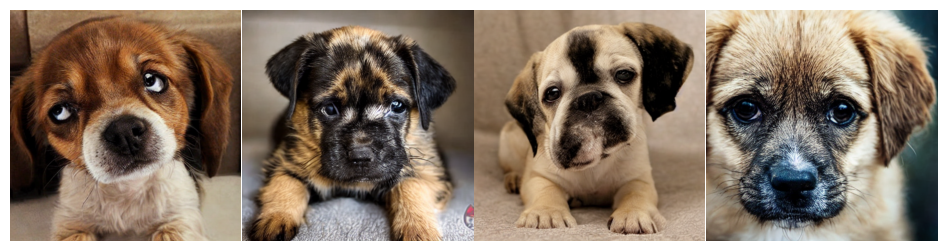

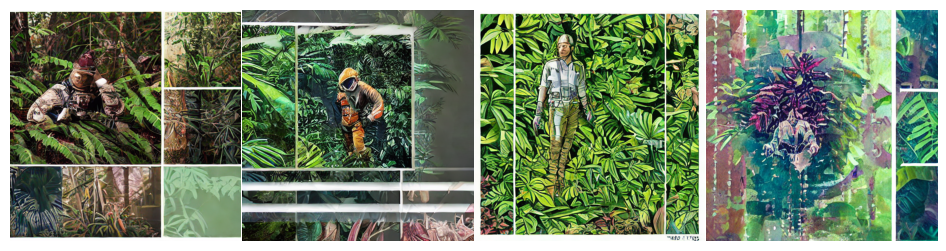

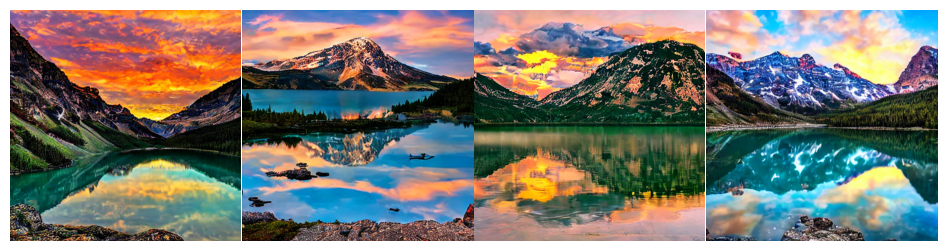

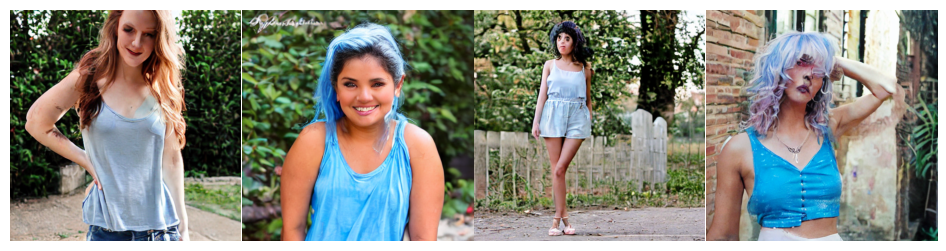

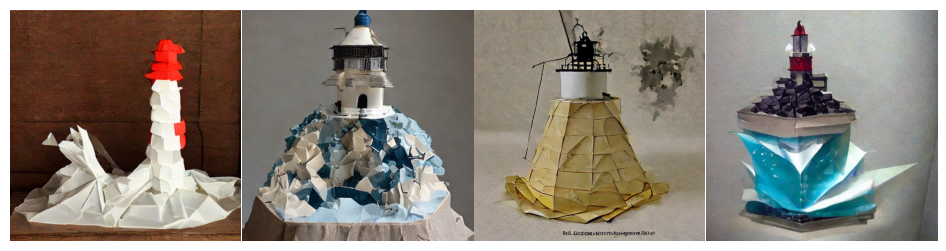

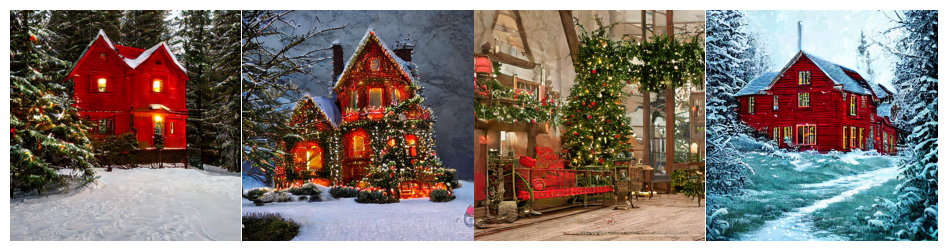

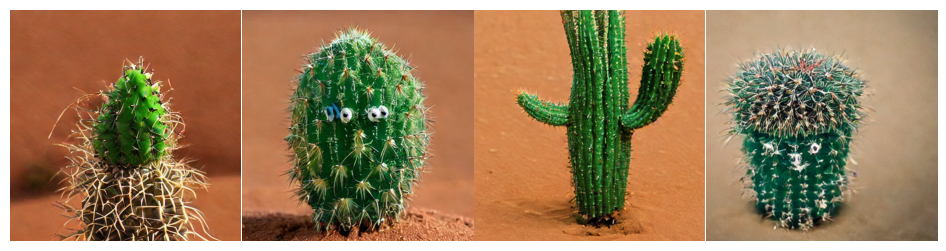

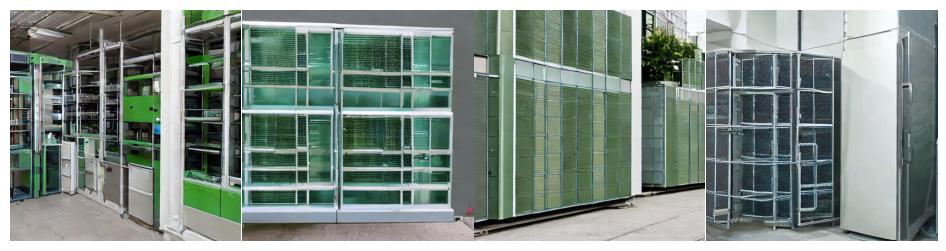

In [38]:
pipe.unet = cm_unet.eval().to(torch.float16)
assert cm_unet.active_adapter == 'multi-cd'

guidance_scale = 1

for prompt in validation_prompts:
    generator = torch.Generator(device="cuda").manual_seed(1)
    images = pipe(prompt, num_inference_steps=4, generator=generator, guidance_scale=guidance_scale, num_images_per_prompt=4).images

    visualize_images(images)

## Задание №8

Все, что осталось сделать - это загрузить ваши обученные модельки на huggingface_hub.
Это очень популярный и удобный способ для хранения моделей, которые легко можно загружать и подставлять в модель.
Другими словами GitHub для моделей и датасетов.

1) Создайте аккаунт на [huggingface.co](huggingface.co)

2) Получите свой HF токен, который можно получить здесь: https://huggingface.co/settings/tokens

3) Создайте репозиторий для ваших моделей https://huggingface.co/new

**Важно: перед отправкой нотбука на проверку, не забудьте удалить свой HF токен!**

In [40]:
cm_unet.push_to_hub(
    'Demid-Osipov/my_diffusion_new', # "<username>/<repo-name>"
    token='...'
)


adapter_model.safetensors:   0%|          | 0.00/269M [00:00<?, ?B/s]

Upload 3 LFS files:   0%|          | 0/3 [00:00<?, ?it/s]


adapter_model.safetensors:   0%|          | 8.19k/269M [00:00<1:09:11, 64.8kB/s]


adapter_model.safetensors:   0%|          | 8.19k/135M [00:00<32:27, 69.1kB/s]
adapter_model.safetensors:   0%|          | 336k/269M [00:00<02:57, 1.51MB/s]   A


adapter_model.safetensors:   0%|          | 287k/135M [00:00<01:44, 1.29MB/s] 
adapter_model.safetensors:   1%|          | 2.00M/269M [00:00<00:39, 6.74MB/s]
adapter_model.safetensors:   1%|          | 1.17M/135M [00:00<00:35, 3.72MB/s]


adapter_model.safetensors:   2%|▏         | 2.02M/135M [00:00<00:19, 6.85MB/s]


adapter_model.safetensors:   4%|▍         | 5.73M/135M [00:00<00:07, 16.2MB/s]
adapter_model.safetensors:   4%|▎         | 9.76M/269M [00:00<00:12, 20.7MB/s]


adapter_model.safetensors:   7%|▋         | 9.68M/135M [00:00<00:06, 19.6MB/s]
adapter_model.safetensors:   6%|▋         | 8.73M/135M [00:00<0

CommitInfo(commit_url='https://huggingface.co/Demid-Osipov/my_diffusion_new/commit/433dddd23af22078d082ee6babe45d4f2a4c3a61', commit_message='Upload model', commit_description='', oid='433dddd23af22078d082ee6babe45d4f2a4c3a61', pr_url=None, pr_revision=None, pr_num=None)

Пример, как должен выглядеть результат выполнения команды: https://huggingface.co/dbaranchuk/cv-week-final-task-example

Давайте проверим, что загрузка модели корректно работает.

In [41]:
from peft import PeftModel

loaded_cm_unet = PeftModel.from_pretrained(
    unet,
    'Demid-Osipov/my_diffusion_new',
    token='...',      # токен для чтения (старый)
    subfolder='multi-cd',
    adapter_name="multi-cd",
)

100%|██████████| 4/4 [00:00<00:00,  7.04it/s]


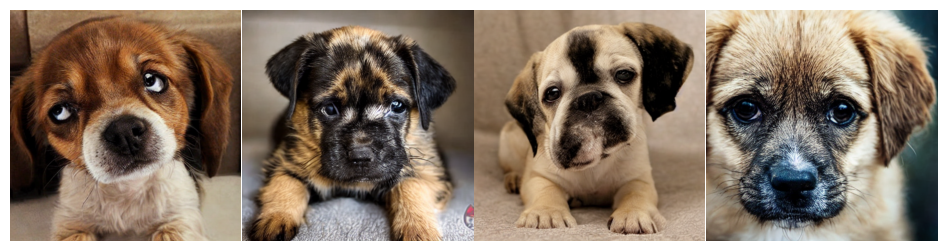

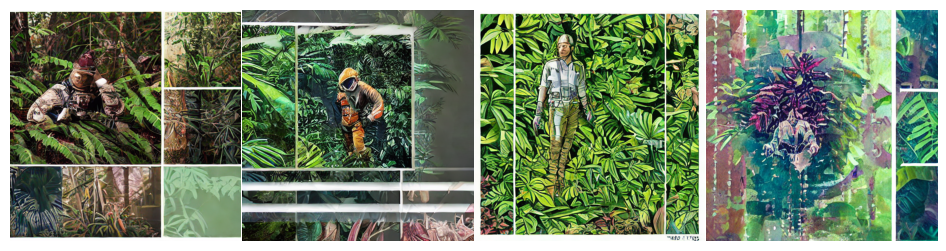

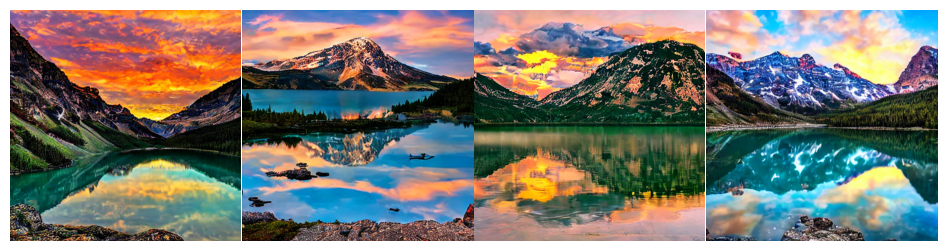

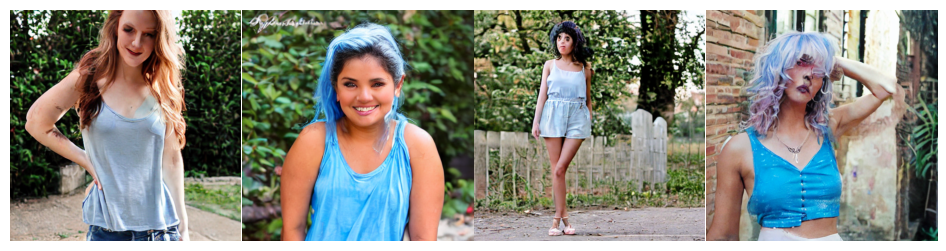

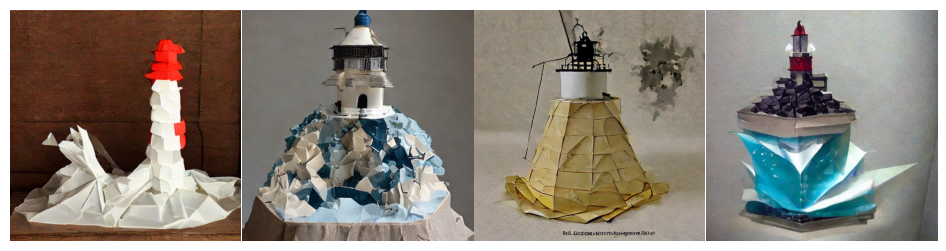

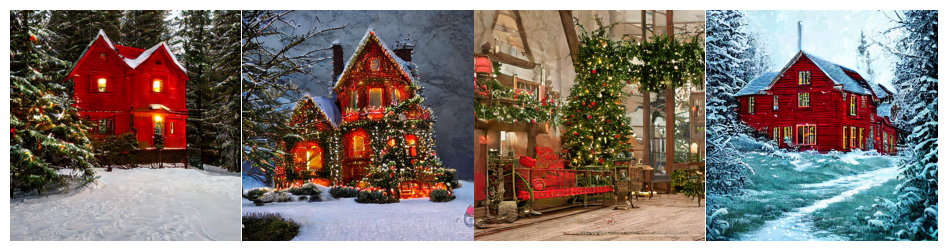

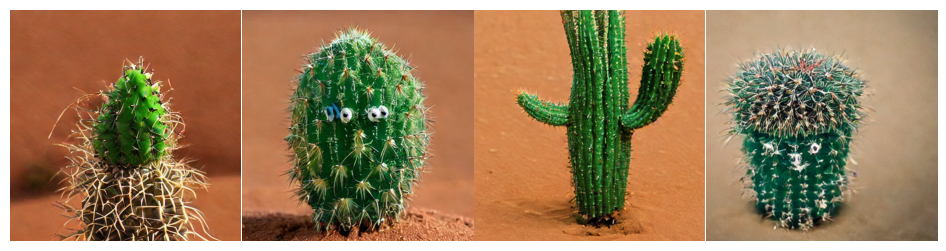

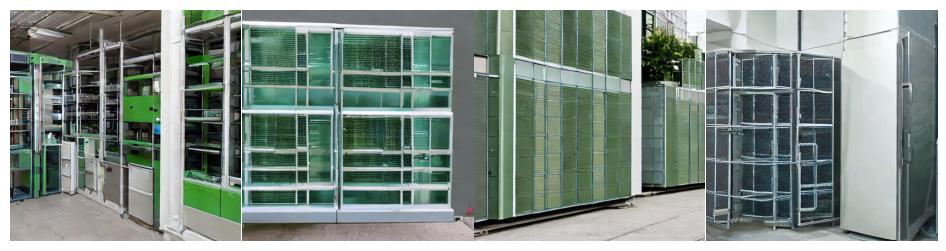

In [43]:
pipe.unet = loaded_cm_unet.eval().to(torch.float16)
assert loaded_cm_unet.active_adapter == 'multi-cd'

guidance_scale = 1

for prompt in validation_prompts:
    generator = torch.Generator(device="cuda").manual_seed(1)

    images = pipe(prompt, num_inference_steps=4, generator=generator, guidance_scale=guidance_scale, num_images_per_prompt=4).images
    visualize_images(images)

**На этом все! Ура!**

<div>
<img src="https://storage.yandexcloud.net/yandex-research/cvweek-cd-task-images/yoda.jpg" width=400>
<div>

### P.S. Некоторые примеры плохих генераций, которые могут возникать при выполнении задания

#### Неправильный сэмплинг

![img](https://storage.yandexcloud.net/yandex-research/cvweek-cd-task-images/fail_case_1.jpg)
![img](https://storage.yandexcloud.net/yandex-research/cvweek-cd-task-images/fail_case_2.jpg)

#### Ошибки в обучении

![img](https://storage.yandexcloud.net/yandex-research/cvweek-cd-task-images/fail_case_3.jpg)
![img](https://storage.yandexcloud.net/yandex-research/cvweek-cd-task-images/fail_case_4.jpg)

#### Необученная модель

![img](https://storage.yandexcloud.net/yandex-research/cvweek-cd-task-images/fail_case_5.jpg)
